In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import joblib
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder


import plotly.graph_objs as go


from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV,StratifiedKFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import SGDClassifier

from sklearn.metrics import roc_auc_score,roc_curve, confusion_matrix, accuracy_score, recall_score, precision_score
from sklearn.metrics import classification_report, f1_score

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import learning_curve
from mlxtend.plotting import plot_decision_regions

sns.set_style('darkgrid')
%matplotlib inline

In [ ]:
# curr_path= os.getcwd()
# print(curr_path)

In [ ]:
# os.listdir("/kaggle/input/hypothyroid/hypothyroid.csv")

In [2]:
df= pd.read_csv("/kaggle/input/hypothyroid/hypothyroid.csv")
df

,age,sex,on thyroxine,query on thyroxine,on antithyroid medication,sick,pregnant,thyroid surgery,I131 treatment,query hypothyroid,...,TT4 measured,TT4,T4U measured,T4U,FTI measured,FTI,TBG measured,TBG,referral source,binaryClass
0,41,F,f,f,f,f,f,f,f,f,...,t,125,t,1.14,t,109,f,?,SVHC,P
1,23,F,f,f,f,f,f,f,f,f,...,t,102,f,?,f,?,f,?,other,P
2,46,M,f,f,f,f,f,f,f,f,...,t,109,t,0.91,t,120,f,?,other,P
3,70,F,t,f,f,f,f,f,f,f,...,t,175,f,?,f,?,f,?,other,P
4,70,F,f,f,f,f,f,f,f,f,...,t,61,t,0.87,t,70,f,?,SVI,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3767,30,F,f,f,f,f,f,f,f,f,...,f,?,f,?,f,?,f,?,other,P
3768,68,F,f,f,f,f,f,f,f,f,...,t,124,t,1.08,t,114,f,?,SVI,P
3769,74,F,f,f,f,f,f,f,f,f,...,t,112,t,1.07,t,105,f,?,other,P
3770,72,M,f,f,f,f,f,f,f,f,...,t,82,t,0.94,t,87,f,?,SVI,P


In [3]:
print(df.shape)

(3772, 30)


In [4]:
df.columns

Index(['age', 'sex', 'on thyroxine', 'query on thyroxine',
       'on antithyroid medication', 'sick', 'pregnant', 'thyroid surgery',
       'I131 treatment', 'query hypothyroid', 'query hyperthyroid', 'lithium',
       'goitre', 'tumor', 'hypopituitary', 'psych', 'TSH measured', 'TSH',
       'T3 measured', 'T3', 'TT4 measured', 'TT4', 'T4U measured', 'T4U',
       'FTI measured', 'FTI', 'TBG measured', 'TBG', 'referral source',
       'binaryClass'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3772 entries, 0 to 3771
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   age                        3772 non-null   object
 1   sex                        3772 non-null   object
 2   on thyroxine               3772 non-null   object
 3   query on thyroxine         3772 non-null   object
 4   on antithyroid medication  3772 non-null   object
 5   sick                       3772 non-null   object
 6   pregnant                   3772 non-null   object
 7   thyroid surgery            3772 non-null   object
 8   I131 treatment             3772 non-null   object
 9   query hypothyroid          3772 non-null   object
 10  query hyperthyroid         3772 non-null   object
 11  lithium                    3772 non-null   object
 12  goitre                     3772 non-null   object
 13  tumor                      3772 non-null   object
 14  hypopitu

In [6]:
df.describe().T

,count,unique,top,freq
age,3772,94,59,95
sex,3772,3,F,2480
on thyroxine,3772,2,f,3308
query on thyroxine,3772,2,f,3722
on antithyroid medication,3772,2,f,3729
sick,3772,2,f,3625
pregnant,3772,2,f,3719
thyroid surgery,3772,2,f,3719
I131 treatment,3772,2,f,3713
query hypothyroid,3772,2,f,3538


In [7]:
df['binaryClass'].value_counts()

P    3481
N     291
Name: binaryClass, dtype: int64

In [8]:
## checking missing values
df= df.replace({"?":np.NAN})
print(df.isnull().sum())
print(f'Total number of missing values: {df.isnull().sum().sum()}')

age                             1
sex                           150
on thyroxine                    0
query on thyroxine              0
on antithyroid medication       0
sick                            0
pregnant                        0
thyroid surgery                 0
I131 treatment                  0
query hypothyroid               0
query hyperthyroid              0
lithium                         0
goitre                          0
tumor                           0
hypopituitary                   0
psych                           0
TSH measured                    0
TSH                           369
T3 measured                     0
T3                            769
TT4 measured                    0
TT4                           231
T4U measured                    0
T4U                           387
FTI measured                    0
FTI                           385
TBG measured                    0
TBG                          3772
referral source                 0
binaryClass   

In [9]:
# convert numerical columns to to_numeric
num_cols= ['age', 'FTI', 'TSH', 'T3', 'TT4', 'T4U']
for i in num_cols:
    df[i] = pd.to_numeric(df[i])

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3772 entries, 0 to 3771
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        3771 non-null   float64
 1   sex                        3622 non-null   object 
 2   on thyroxine               3772 non-null   object 
 3   query on thyroxine         3772 non-null   object 
 4   on antithyroid medication  3772 non-null   object 
 5   sick                       3772 non-null   object 
 6   pregnant                   3772 non-null   object 
 7   thyroid surgery            3772 non-null   object 
 8   I131 treatment             3772 non-null   object 
 9   query hypothyroid          3772 non-null   object 
 10  query hyperthyroid         3772 non-null   object 
 11  lithium                    3772 non-null   object 
 12  goitre                     3772 non-null   object 
 13  tumor                      3772 non-null   objec

In [11]:
df.drop(['TBG', 'referral source'], axis=1, inplace=True)

In [12]:
def mode_imputation(feature):
    mode=df[feature].mode()[0]
    df[feature]=df[feature].fillna(mode)
    
for col in ['sex', 'T4U measured']:
    mode_imputation(col)

In [13]:
df['sex'].mode()[0] ## since the mode returns a series, the [0] returns the first element of the series

'F'

In [14]:
df['age'].fillna(df['age'].mean(), inplace=True)
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
df['TSH'] = imputer.fit_transform(df[['TSH']])
df['T3'] = imputer.fit_transform(df[['T3']])
df['TT4'] = imputer.fit_transform(df[['TT4']])
df['T4U'] = imputer.fit_transform(df[['T4U']])
df['FTI'] = imputer.fit_transform(df[['FTI']])
#Checks each column datatype
print(df.dtypes)
#Checks null values
print(df.isnull().sum())
print('Total number of null values:', df.isnull().sum().sum())

age                          float64
sex                           object
on thyroxine                  object
query on thyroxine            object
on antithyroid medication     object
sick                          object
pregnant                      object
thyroid surgery               object
I131 treatment                object
query hypothyroid             object
query hyperthyroid            object
lithium                       object
goitre                        object
tumor                         object
hypopituitary                 object
psych                         object
TSH measured                  object
TSH                          float64
T3 measured                   object
T3                           float64
TT4 measured                  object
TT4                          float64
T4U measured                  object
T4U                          float64
FTI measured                  object
FTI                          float64
TBG measured                  object
b

In [15]:
for i in range (df.shape[0]):
    if df.age.iloc[i] > 100.0:
        df.age.iloc[i] = 100.0

In [16]:
df['age'].describe()

count    3772.000000
mean       51.641765
std        18.994291
min         1.000000
25%        36.000000
50%        54.000000
75%        67.000000
max       100.000000
Name: age, dtype: float64

In [17]:
print("Total Number of samples :{}".format(df.shape[0]))
print("Total No.of Negative Thyroid: {}".format(df[df.binaryClass =='N'].shape[0]))
print("Total No.of Positive Thyroid: {}".format(df[df.binaryClass =='P'].shape[0]))

Total Number of samples :3772
Total No.of Negative Thyroid: 291
Total No.of Positive Thyroid: 3481


In [18]:
df['binaryClass'].value_counts()

P    3481
N     291
Name: binaryClass, dtype: int64

In [19]:
# converts binaryClass feature to {0,1}
def map_binaryClass(n):
    if n == "N":
        return 0
    else:
        return 1
df['binaryClass'] = df['binaryClass'].apply(lambda x:map_binaryClass(x))

# converts sex feature to {0,1}
def map_sex(n):
    if n == "F":
        return 0
    else:
        return 1

df['sex'] = df['sex'].apply(lambda x: map_sex(x))
df=df.replace({"t":1,"f":0})

In [20]:
df['binaryClass'].value_counts()

1    3481
0     291
Name: binaryClass, dtype: int64

In [21]:
# Extracts output and input variables
y = df['binaryClass'].values 

In [22]:
df['binaryClass'].value_counts()

1    3481
0     291
Name: binaryClass, dtype: int64

In [23]:
np.unique(y)

array([0, 1])

In [24]:
# Target for the model
X = df.drop(['binaryClass'], axis =1)

In [25]:
df['binaryClass'].value_counts()

1    3481
0     291
Name: binaryClass, dtype: int64

In [26]:
np.unique(y)

array([0, 1])

In [27]:
print(X.shape)
print(y.shape)

(3772, 27)
(3772,)


In [28]:
print(df.shape)

(3772, 28)


In [29]:
df['binaryClass'].value_counts()

1    3481
0     291
Name: binaryClass, dtype: int64

In [30]:
np.unique(y)

array([0, 1])

In [31]:
#Feature Importance using RandomForest Classifier
names = X.columns
rf = RandomForestClassifier()
rf.fit(X, y)

RandomForestClassifier()

In [32]:
result_rf = pd.DataFrame()
result_rf['Features'] = X.columns
result_rf ['Values'] = rf.feature_importances_
result_rf.sort_values('Values',inplace = True, ascending = False)

In [33]:
result_rf

,Features,Values
17,TSH,0.595717
25,FTI,0.112216
21,TT4,0.090635
2,on thyroxine,0.056563
19,T3,0.036128
0,age,0.030899
23,T4U,0.029506
7,thyroid surgery,0.015323
1,sex,0.006094
9,query hypothyroid,0.005786


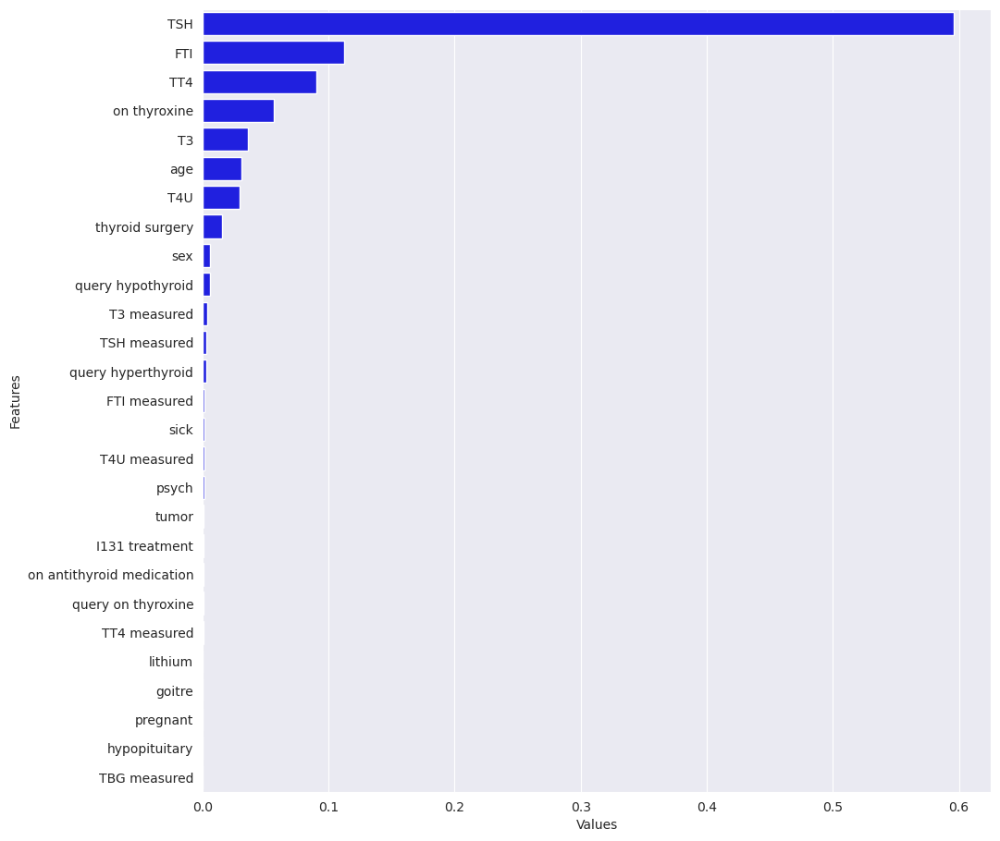

In [34]:
plt.figure(figsize=(11,11))
sns.set_color_codes("pastel")
sns.barplot(x ='Values', y='Features', data=result_rf, color="Blue")
plt.show()

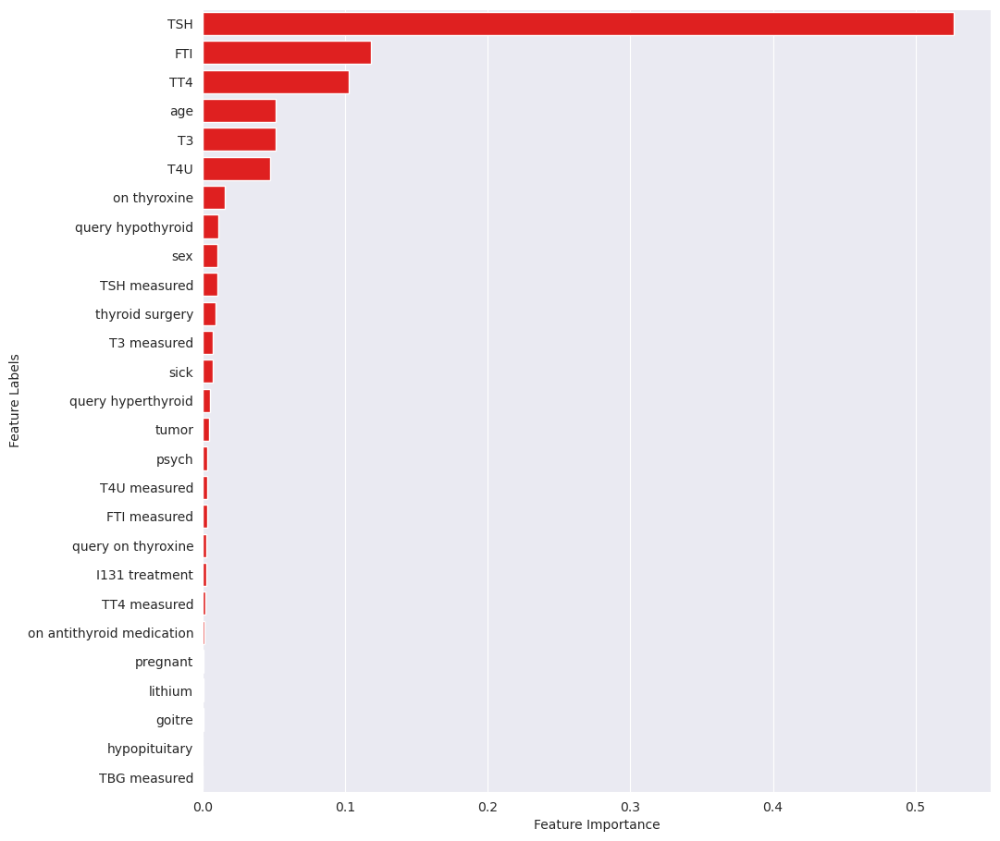

In [37]:
#Feature Importance using ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X, y)
result_et = pd.DataFrame()
result_et['Features'] = X.columns
result_et ['Values'] = model.feature_importances_
result_et.sort_values('Values', inplace=True, ascending =False)
plt.figure(figsize=(11,11))
sns.set_color_codes("pastel")
sns.barplot(x = 'Values',y ='Features', data=result_et,color="red")
plt.xlabel('Feature Importance', fontsize=10)
plt.ylabel('Feature Labels', fontsize=10)
plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.show()

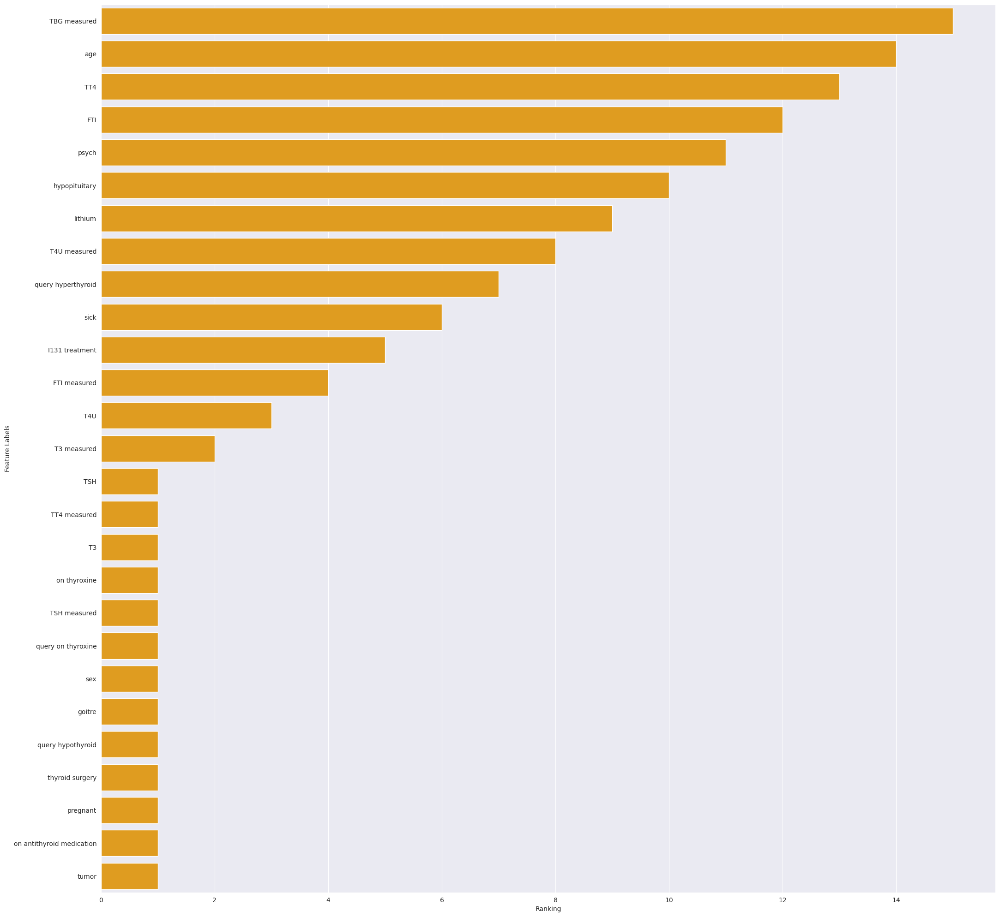

Feature Ranking:
                     Features  Ranking
26               TBG measured       15
0                         age       14
21                        TT4       13
25                        FTI       12
15                      psych       11
14              hypopituitary       10
11                    lithium        9
22               T4U measured        8
10         query hyperthyroid        7
5                        sick        6
8              I131 treatment        5
24               FTI measured        4
23                        T4U        3
18                T3 measured        2
17                        TSH        1
20               TT4 measured        1
19                         T3        1
2                on thyroxine        1
16               TSH measured        1
3          query on thyroxine        1
1                         sex        1
12                     goitre        1
9           query hypothyroid        1
7             thyroid surgery        1
6       

In [38]:
#Feature Importance using RFE 
from sklearn.feature_selection import RFE
model = LogisticRegression()
# create the RFE model
rfe = RFE(model)
rfe = rfe.fit(X, y)
result_lg = pd.DataFrame()
result_lg['Features'] = X.columns
result_lg ['Ranking'] = rfe.ranking_
result_lg.sort_values('Ranking',inplace=True , ascending = False)
plt.figure(figsize=(25,25))
sns.set_color_codes("pastel")
sns.barplot(x = 'Ranking',y ='Features', data=result_lg,color="orange")
plt.ylabel('Feature Labels',fontsize=10)
plt.tick_params(axis='x',labelsize=10)
plt.tick_params(axis='y',labelsize=10)
plt.show()
print("Feature Ranking:")
print(result_lg)

In [39]:
np.unique(y)

array([0, 1])

In [ ]:
## Resampling and Splitting Data

In [40]:
sm = SMOTE(random_state=42)
## SMOTE (Synthetic Minority Oversampling Technique) - It generates synthetic samples for the minority class

X,y = sm.fit_resample(X, y.ravel())
## splits the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 2021, stratify=y)
X_train_raw = X_train.copy()
X_test_raw = X_test.copy()
y_train_raw = y_train.copy()
y_test_raw = y_test.copy()
X_train_norm = X_train.copy()
X_test_norm = X_test.copy()
y_train_norm = y_train.copy()
y_test_norm = y_test.copy()
norm = MinMaxScaler()
X_train_norm = norm.fit_transform(X_train_norm)
X_test_norm = norm.transform(X_test_norm)
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()
y_train_stand = y_train.copy()
y_test_stand = y_test.copy()
scaler = StandardScaler()
X_train_stand = scaler.fit_transform(X_train_stand)
X_test_stand = scaler.transform(X_test_stand)

In [41]:
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(35, 10))
    
    axes[0].set_title(title)
    
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")
    
    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, return_times=True)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std, fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

In [42]:
def plot_real_pred_val(Y_test, ypred, name):
    plt.figure(figsize=(25, 15))
    acc = accuracy_score(Y_test, ypred)
    plt.scatter(range(len(ypred)), ypred, color="blue", lw=5, label="Predicted")
    plt.scatter(range(len(Y_test)), Y_test, color="red", label="Actual")
    plt.title("Predicted Values vs True Values of " + name, fontsize=10)
    plt.xlabel("Accuracy: " + str(round((acc * 100), 3)) + "%")
    plt.legend()
    plt.grid(True, alpha=0.75, lw=1, ls='-.')
    plt.show()

def plot_cm(Y_test, ypred, name):
    fig, ax = plt.subplots(figsize=(25, 15))
    cm = confusion_matrix(Y_test, ypred)
    sns.heatmap(cm, annot=True, linewidth=0.7, linecolor='red', fmt='g', cmap="YlOrBr", annot_kws={"size": 30})
    plt.title(name + ' Confusion Matrix', fontsize=30)
    ax.xaxis.set_ticklabels(['Negative', 'Positive'], fontsize=20)
    ax.yaxis.set_ticklabels(['Negative', 'Positive'], fontsize=20)
    plt.xlabel('Y predict', fontsize=30)
    plt.ylabel('Y test', fontsize=30)
    plt.show()
    return cm


In [43]:
# Plots ROC
def plot_roc(model, X_test, y_test, title):
    Y_pred_prob = model.predict_proba(X_test)
    Y_pred_prob = Y_pred_prob[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, Y_pred_prob)
    plt.figure(figsize=(25, 15))
    plt.plot([0, 1], [0, 1], color='navy', lw=5, linestyle='--')
    plt.plot(fpr, tpr, label='ANN')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve of ' + title)
    plt.grid(True)
    plt.show()

def plot_decision_boundary(model, xtest, ytest, name):
    plt.figure(figsize=(25, 15))
    # Trains model with two features
    model.fit(xtest, ytest)
    plot_decision_regions(xtest.values, ytest.ravel(), clf=model, legend=2)
    plt.title("Decision boundary for " + name + " (Test)", fontsize=30)
    plt.xlabel("TSH", fontsize=25)
    plt.ylabel("FTI", fontsize=25)
    plt.legend(fontsize=25)
    plt.show()

In [44]:
# oose two features for decision boundary:
feat_boundary = ['TSH','FTI']
X_feature = X[feat_boundary]
X_train_feat, X_test_feat,y_train_feat, y_test_feat = train_test_split(X_feature, y,test_size = 0.2, random_state = 2021, stratify=y)

In [45]:
def train_model(model, X, y):
    model.fit(X, y)
    return model

def predict_model(model, X, proba=False):
    if not proba:
        y_pred = model.predict(X)
    else:
        y_pred_proba = model.predict_proba(X)
        y_pred = np.argmax(y_pred_proba, axis=1)
    return y_pred

list_scores = []

def run_model(name, model, X_train, X_test, y_train, y_test, fc, proba=False):
    print(name)
    print(fc)
    model = train_model(model, X_train, y_train)
    y_pred = predict_model(model, X_test, proba)
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    print('accuracy: ', accuracy)
    print('recall: ', recall)
    print('precision: ', precision)
    print('f1: ', f1)
    print(classification_report(y_test, y_pred))
    plot_cm(y_test, y_pred, name)
    plot_real_pred_val(y_test, y_pred, name)
    plot_roc(model, X_test, y_test, name)
    plot_decision_boundary(model, X_test_feat, y_test_feat, name)
    plot_learning_curve(model, name, X_train, y_train, cv=3)
    plt.show()
    list_scores.append({'Model Name': name, 'Feature Scaling': fc, 'Accuracy': accuracy, 'Recall': recall, 'Precision': precision, 'F1': f1})

SVC
Raw
accuracy:  0.9705671213208902
recall:  0.9755747126436781
precision:  0.9658605974395448
f1:  0.9706933523945676
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       697
           1       0.97      0.98      0.97       696

    accuracy                           0.97      1393
   macro avg       0.97      0.97      0.97      1393
weighted avg       0.97      0.97      0.97      1393



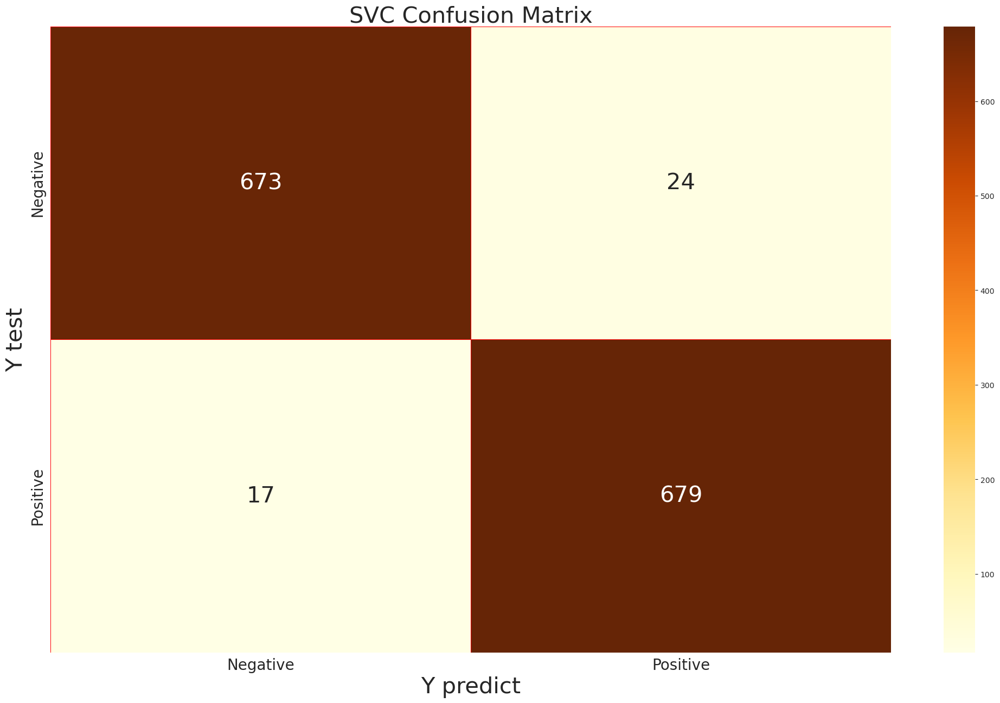

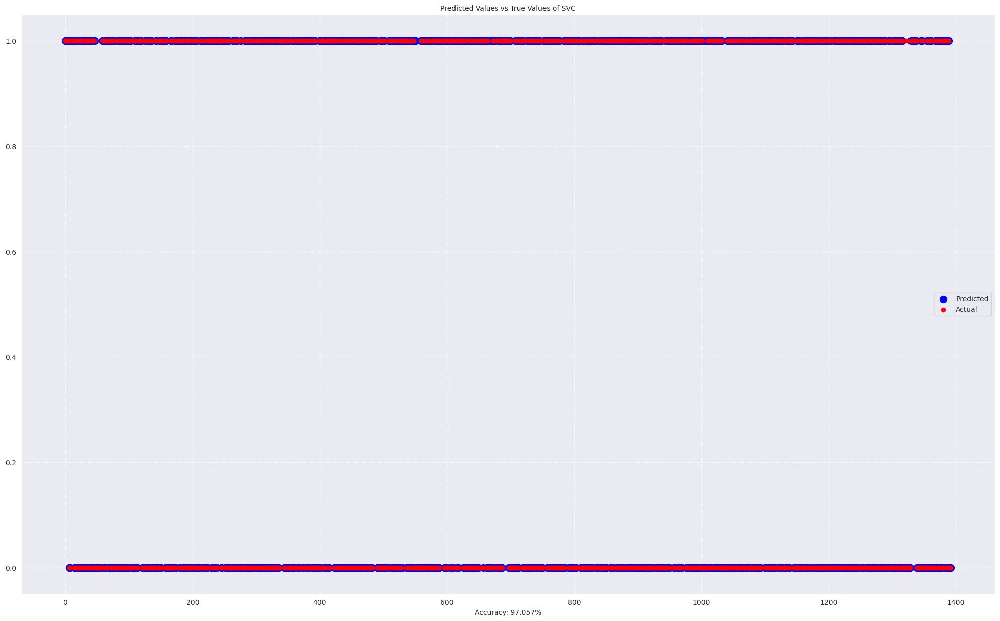

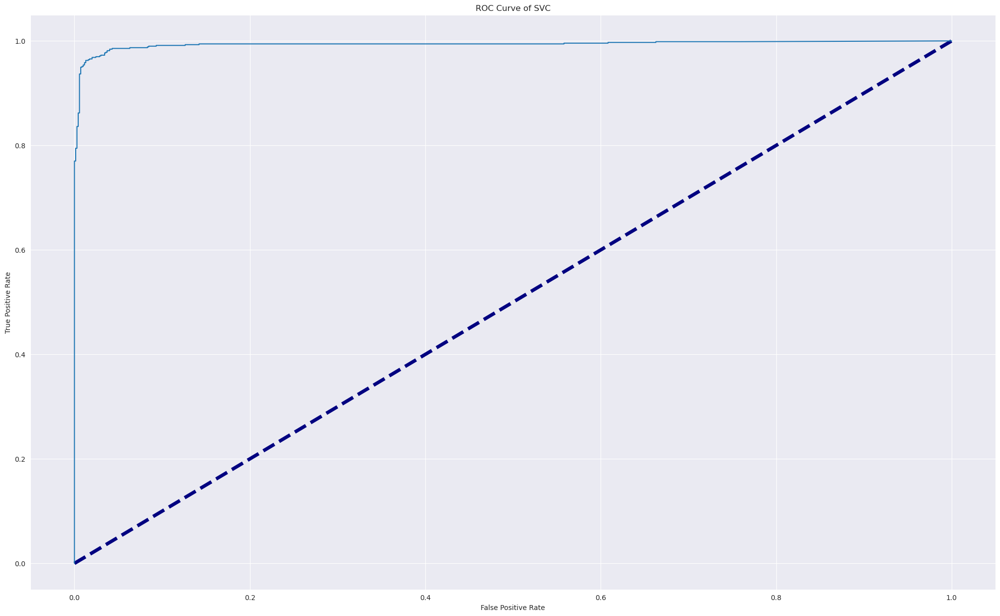

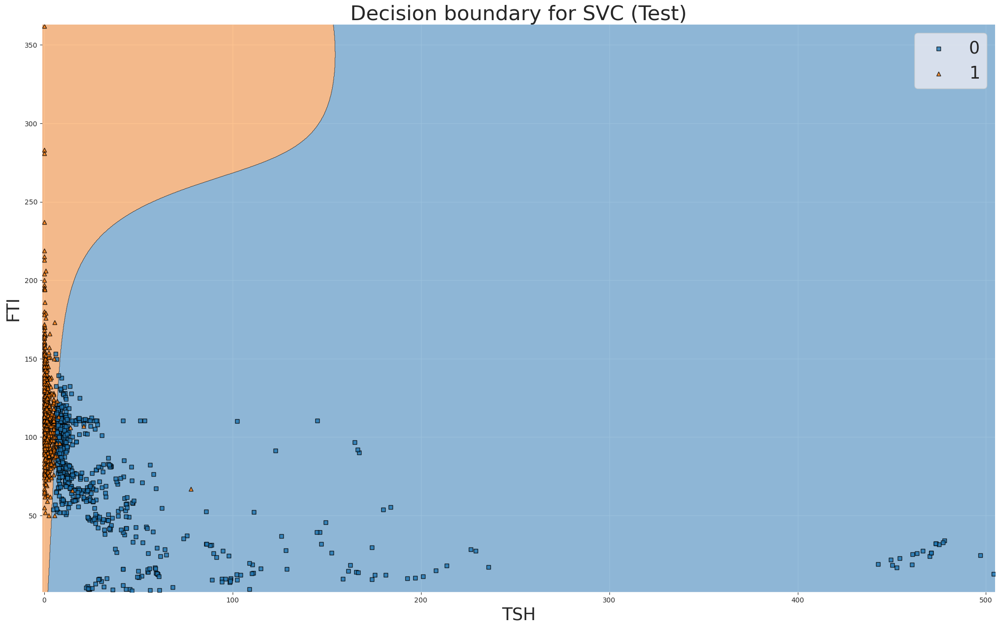

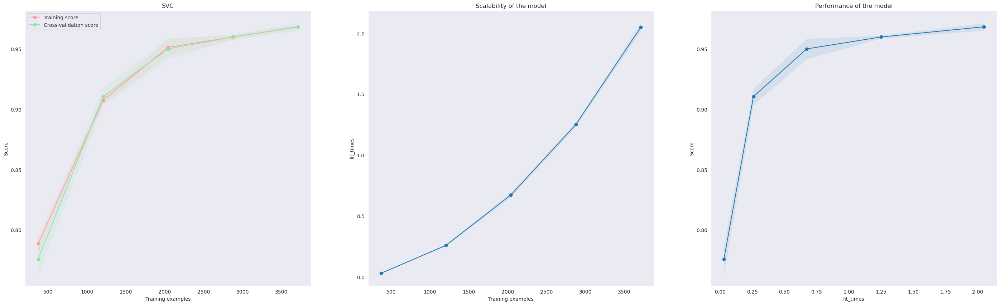

SVC
Normalization
accuracy:  0.8406317300789663
recall:  0.7974137931034483
precision:  0.8726415094339622
f1:  0.8333333333333333
              precision    recall  f1-score   support

           0       0.81      0.88      0.85       697
           1       0.87      0.80      0.83       696

    accuracy                           0.84      1393
   macro avg       0.84      0.84      0.84      1393
weighted avg       0.84      0.84      0.84      1393



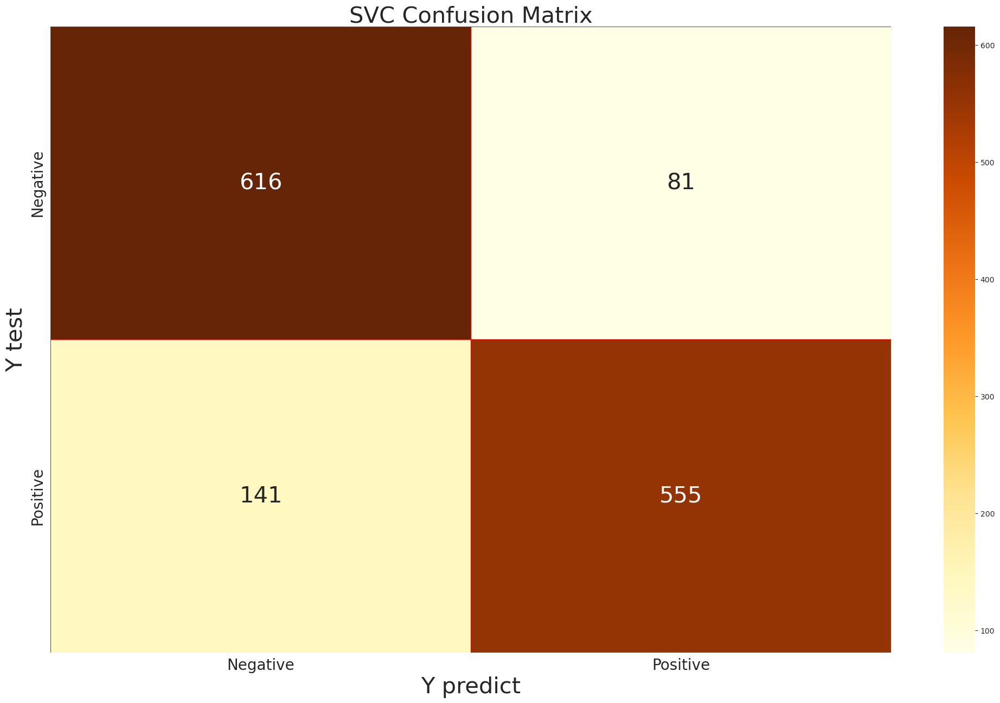

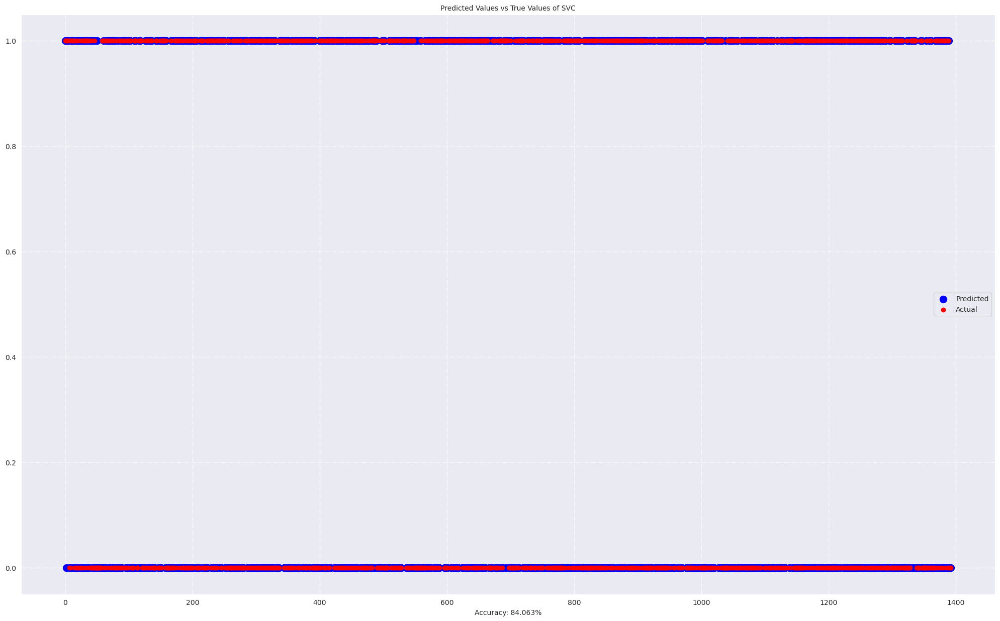

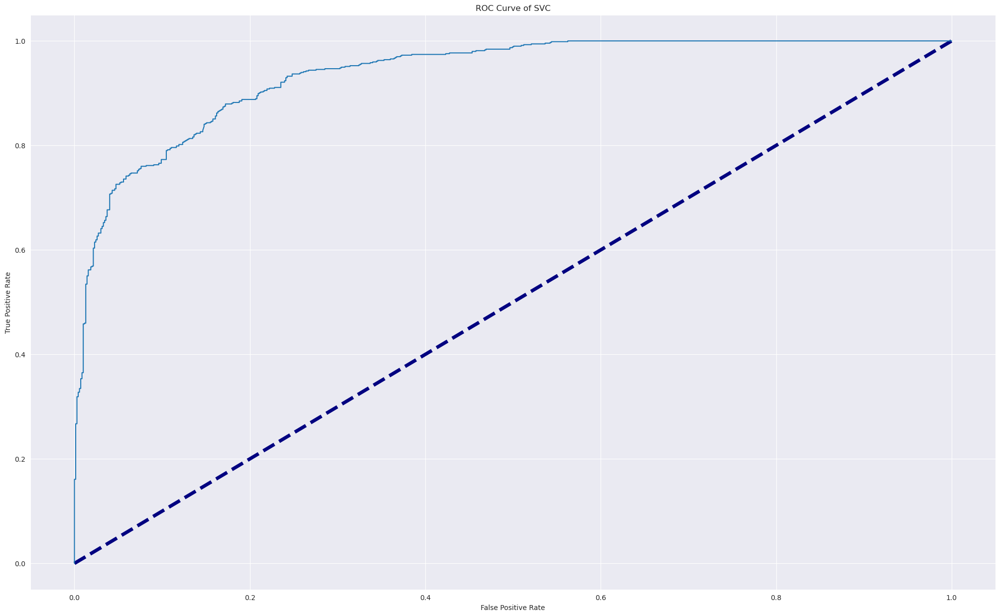

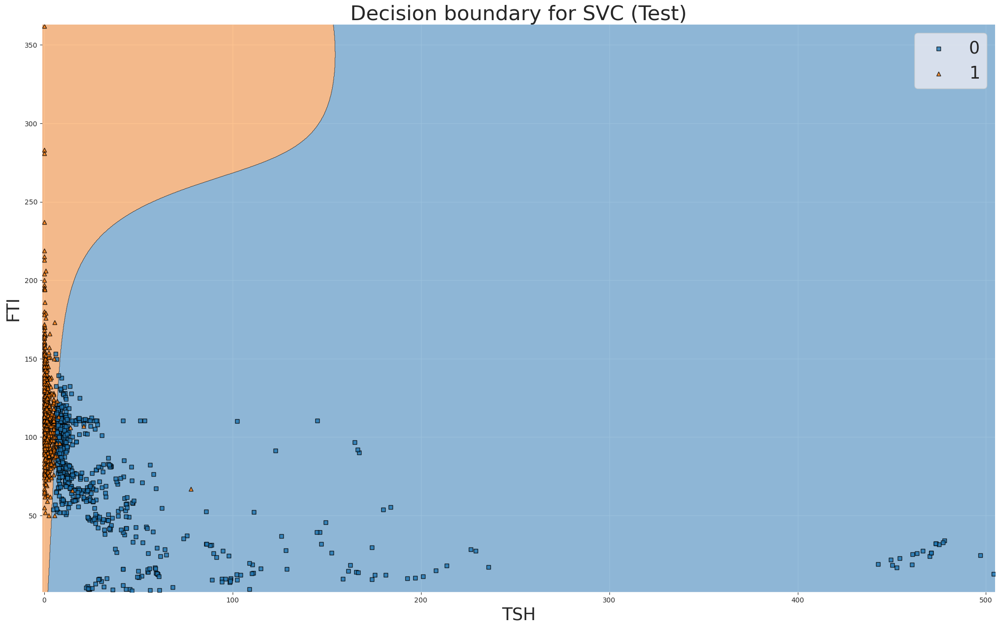

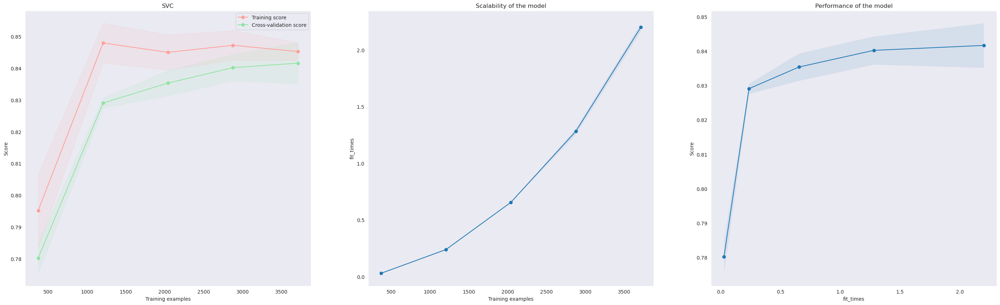

SVC
Standardization
accuracy:  0.9109834888729361
recall:  0.8979885057471264
precision:  0.9218289085545722
f1:  0.9097525473071324
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       697
           1       0.92      0.90      0.91       696

    accuracy                           0.91      1393
   macro avg       0.91      0.91      0.91      1393
weighted avg       0.91      0.91      0.91      1393



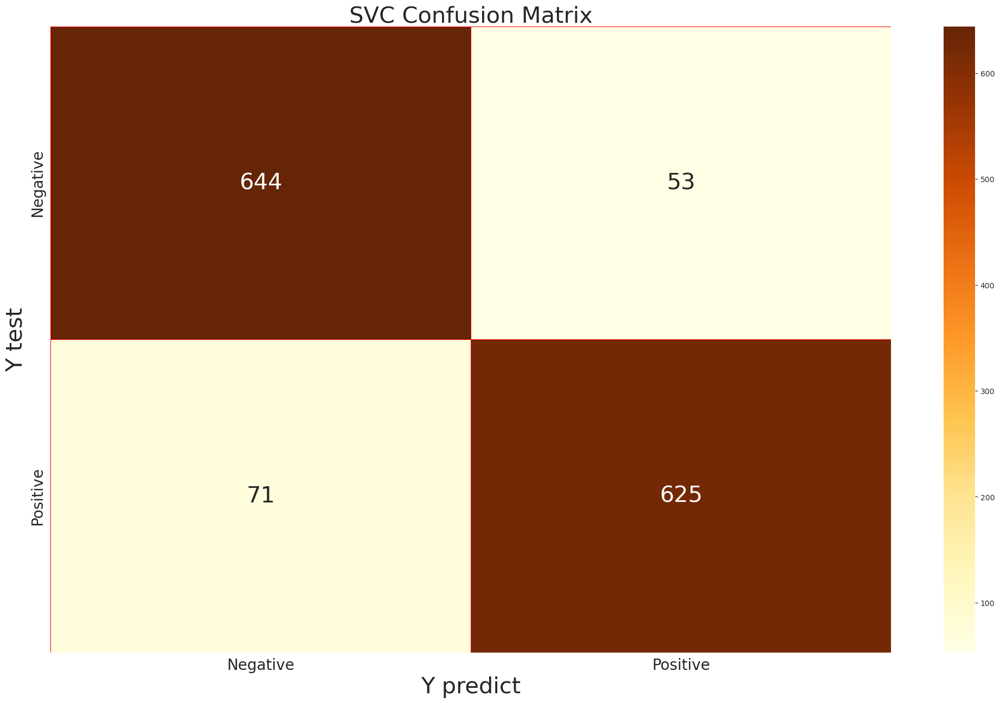

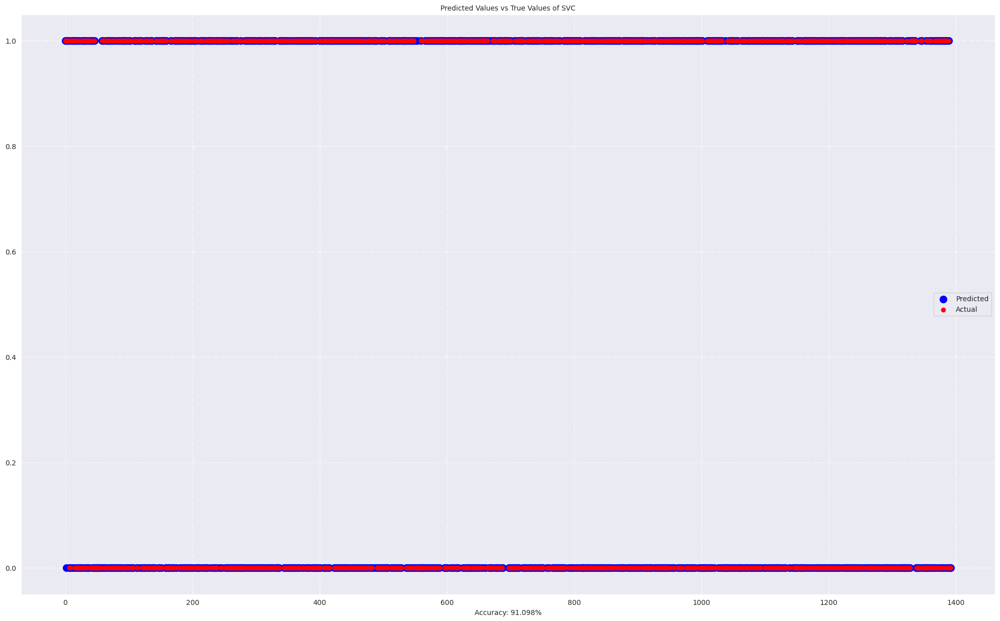

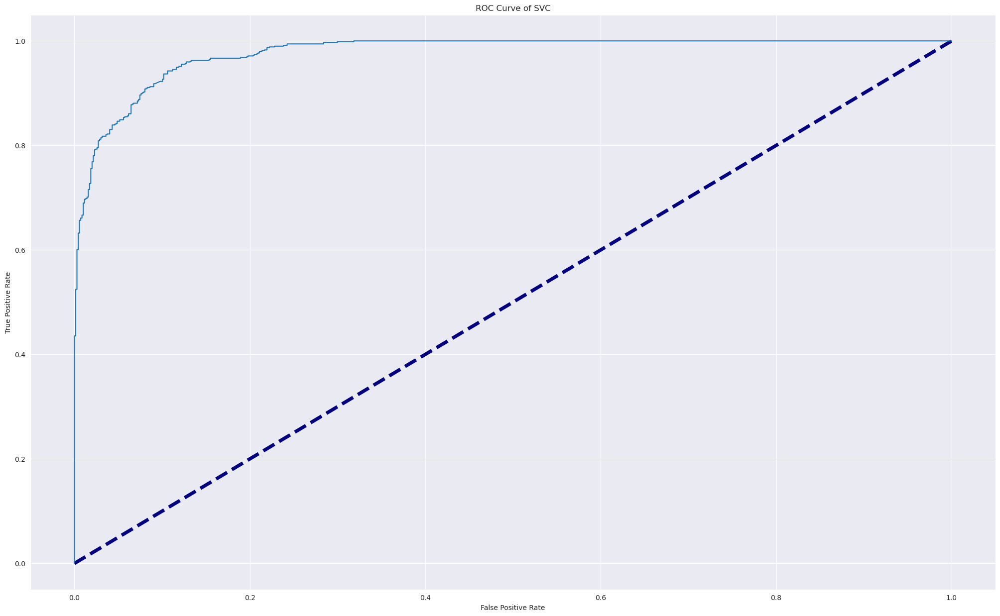

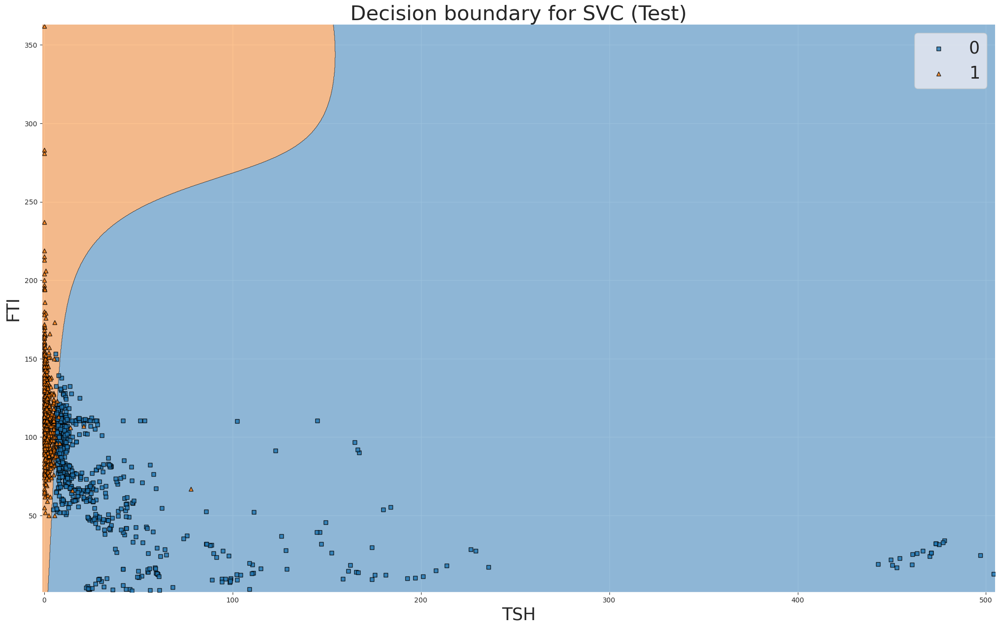

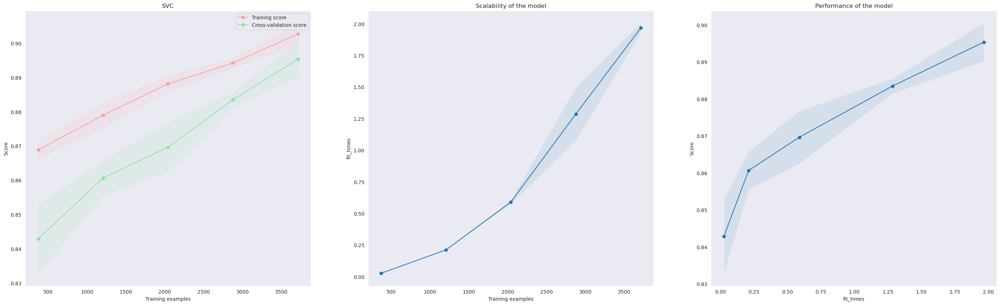

In [46]:
## Run Support Vector Classifier (SVC) on three feature scaling:

feature_scaling = {
    'Raw': (X_train_raw, X_test_raw, y_train_raw, y_test_raw),
    'Normalization': (X_train_norm, X_test_norm, y_train_norm, y_test_norm),
    'Standardization': (X_train_stand, X_test_stand, y_train_stand, y_test_stand),
}

model_svc = SVC(random_state=2021, probability=True)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('SVC', model_svc, X_train, X_test, y_train, y_test, fc_name)


Logistic Regression
Raw
accuracy:  0.9877961234745154
recall:  0.9899425287356322
precision:  0.9856938483547926
f1:  0.9878136200716845
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



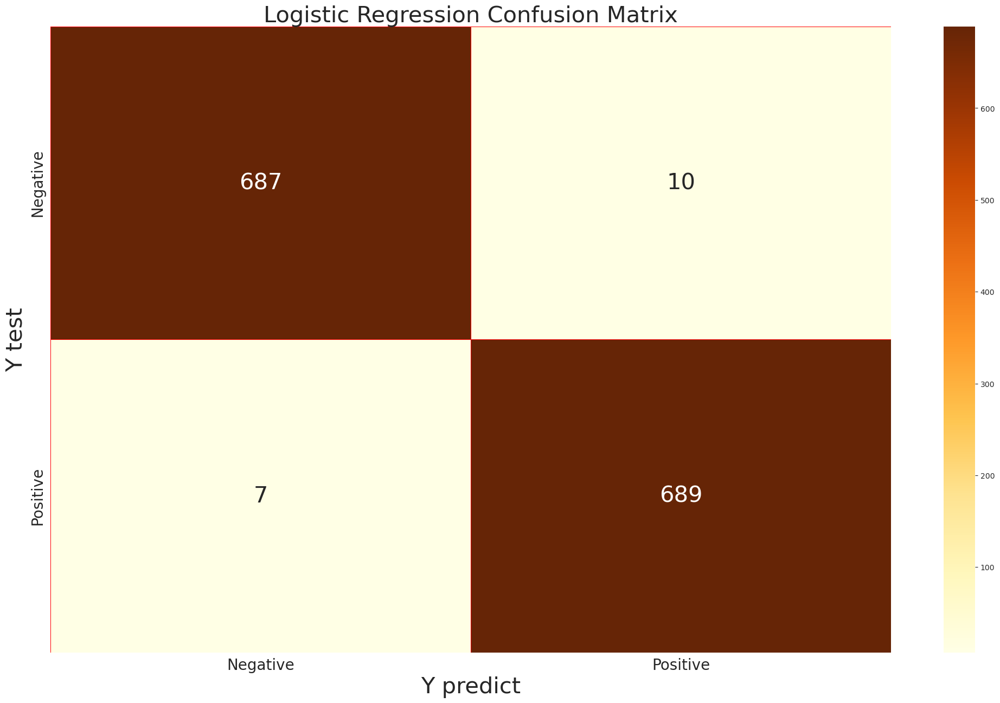

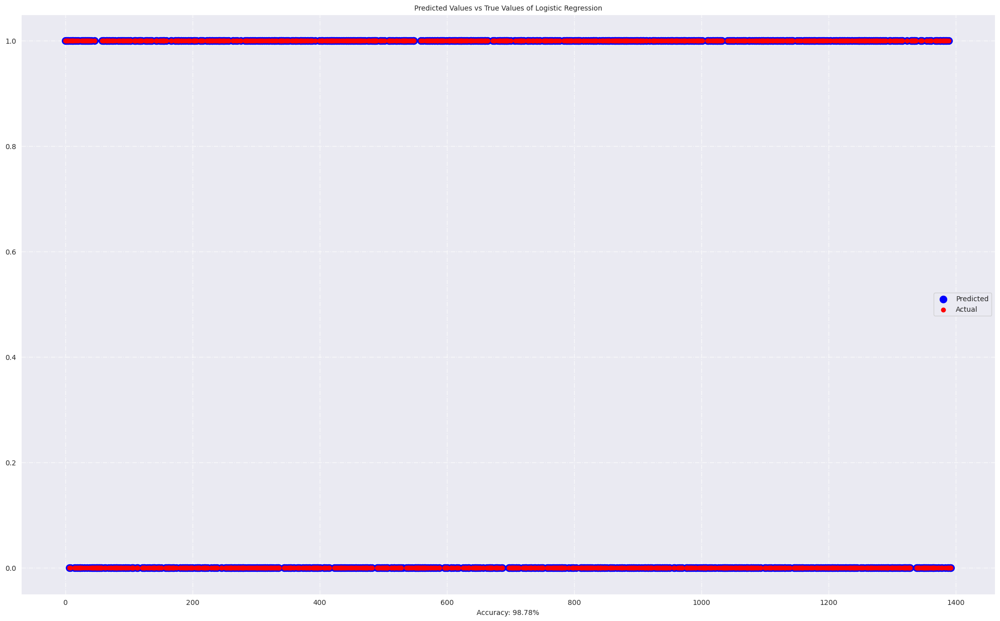

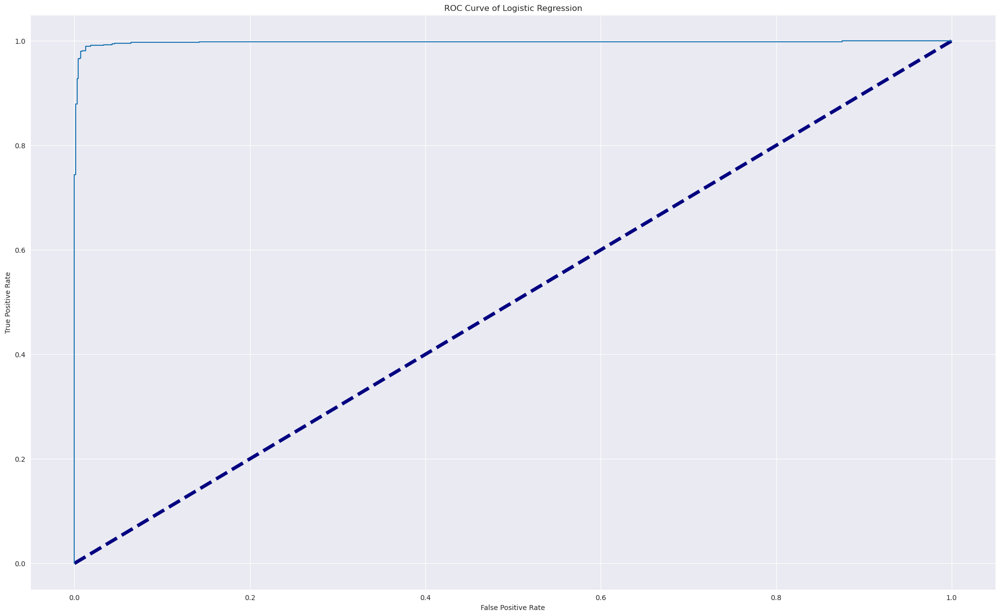

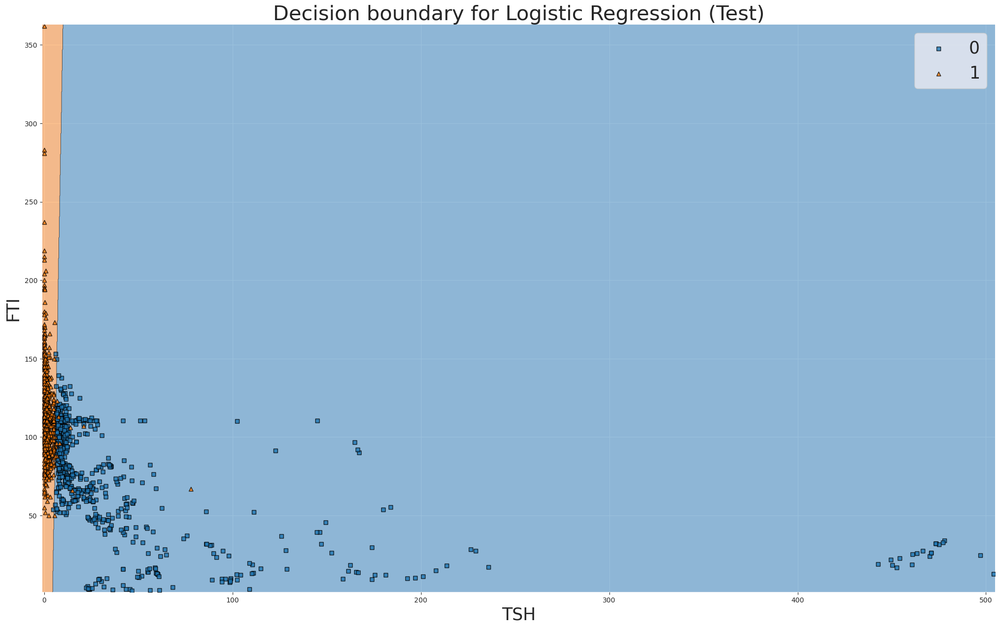

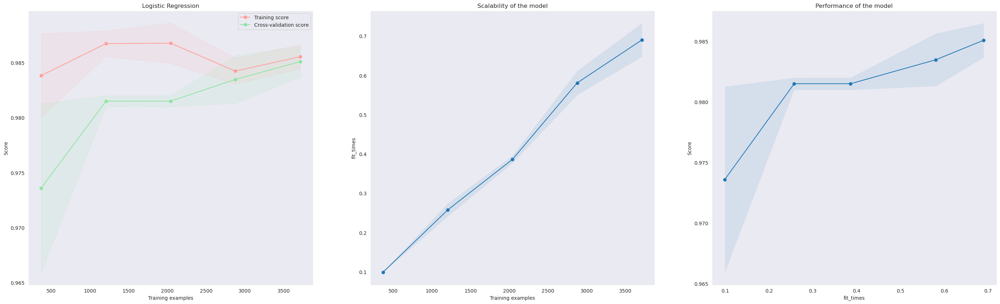

Logistic Regression
Normalization
accuracy:  0.8341708542713567
recall:  0.8117816091954023
precision:  0.849624060150376
f1:  0.8302718589272594
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       697
           1       0.85      0.81      0.83       696

    accuracy                           0.83      1393
   macro avg       0.83      0.83      0.83      1393
weighted avg       0.83      0.83      0.83      1393



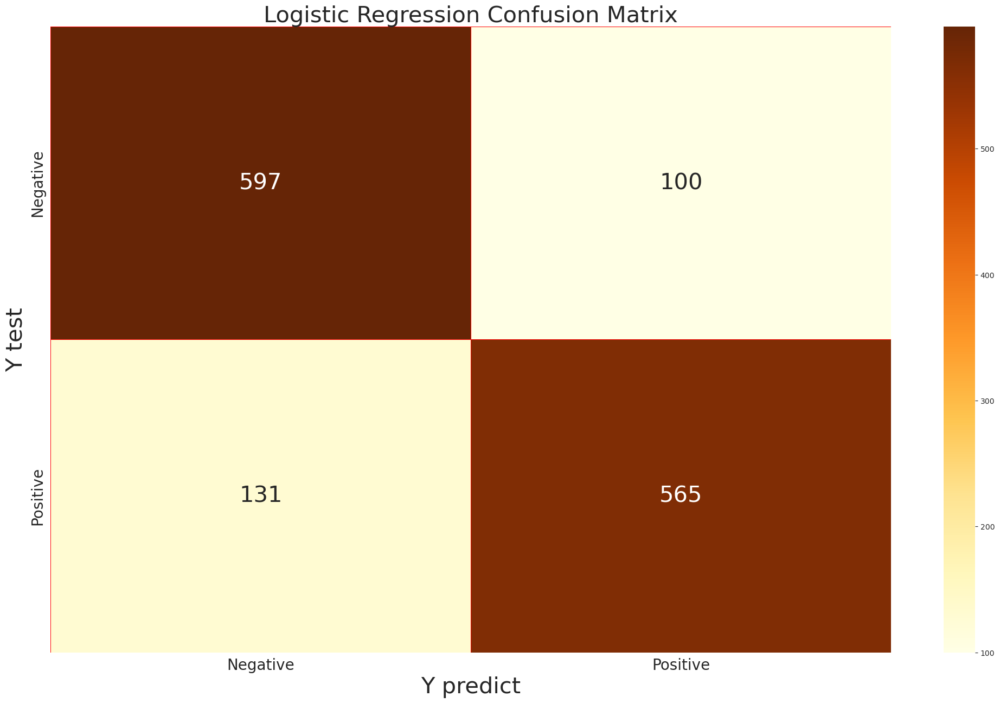

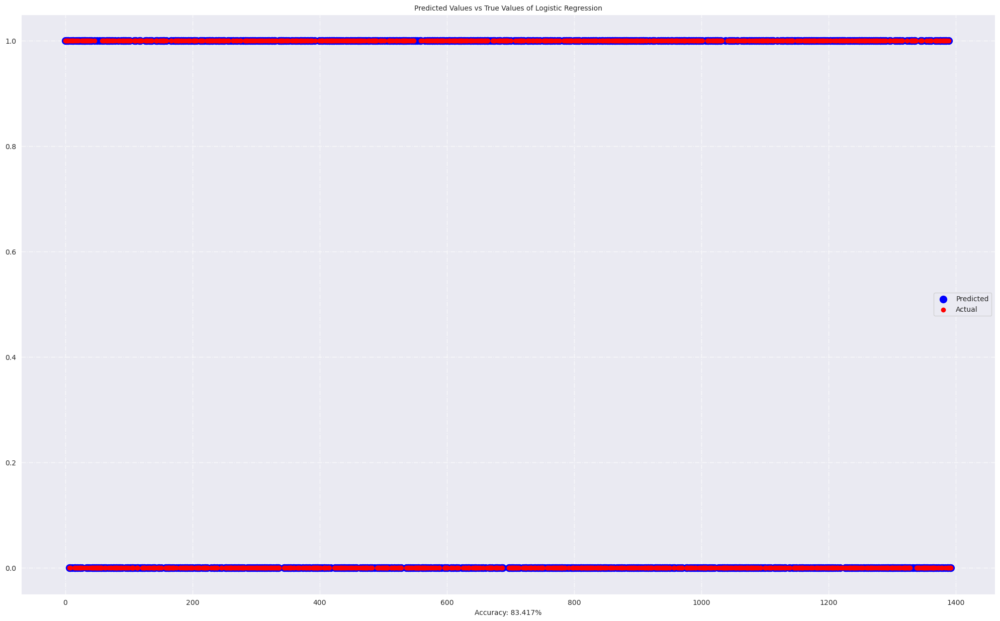

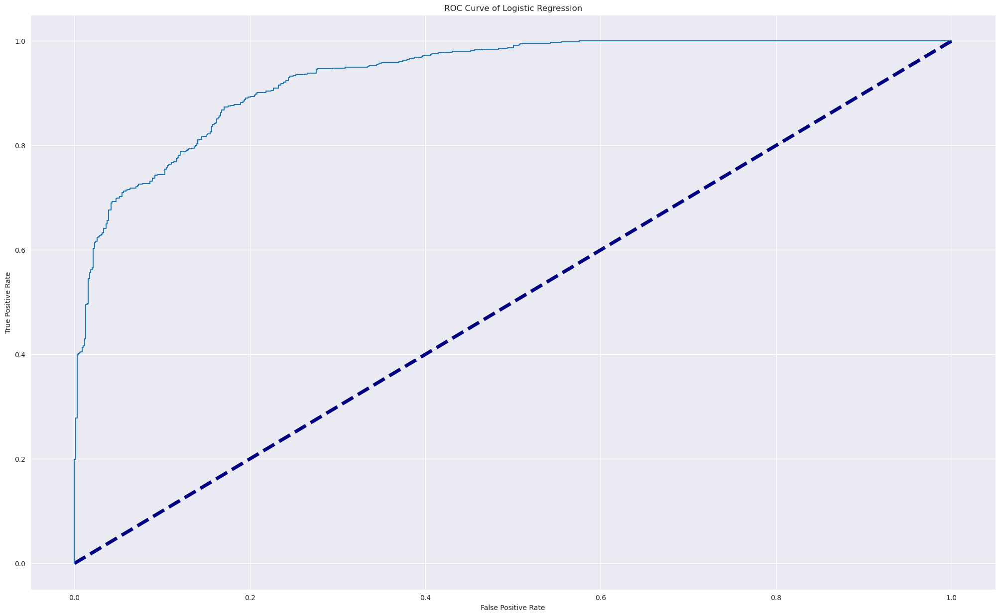

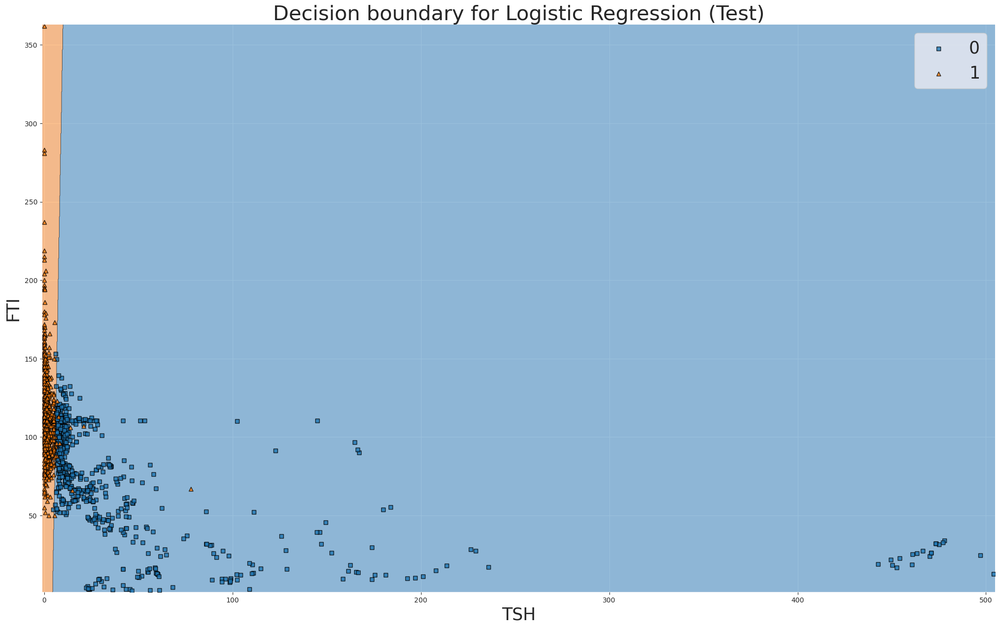

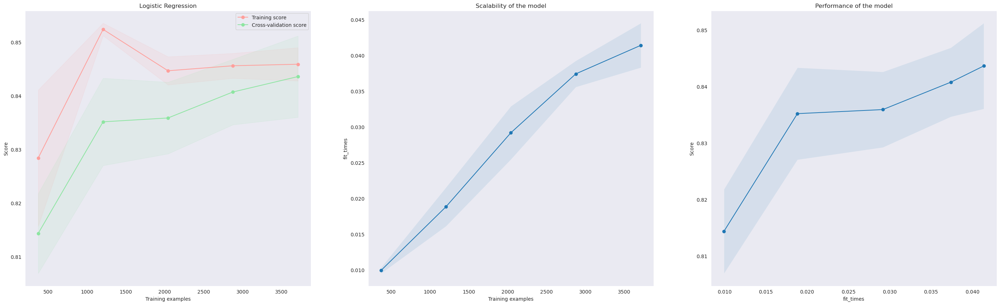

Logistic Regression
Standardization
accuracy:  0.9641062455132807
recall:  0.9755747126436781
precision:  0.9536516853932584
f1:  0.9644886363636364
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       697
           1       0.95      0.98      0.96       696

    accuracy                           0.96      1393
   macro avg       0.96      0.96      0.96      1393
weighted avg       0.96      0.96      0.96      1393



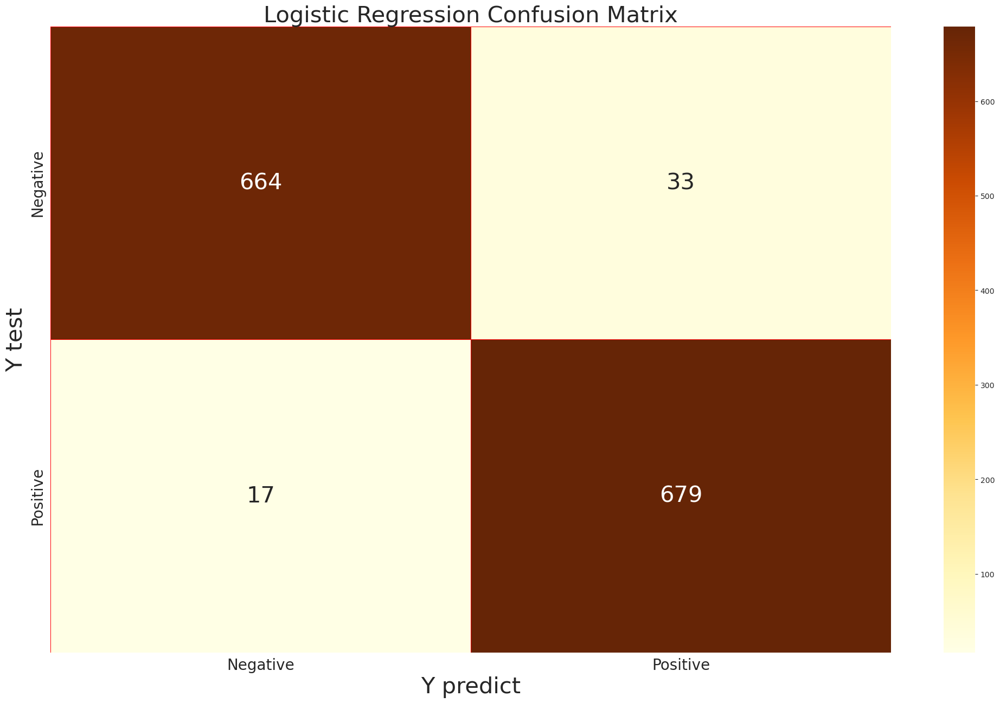

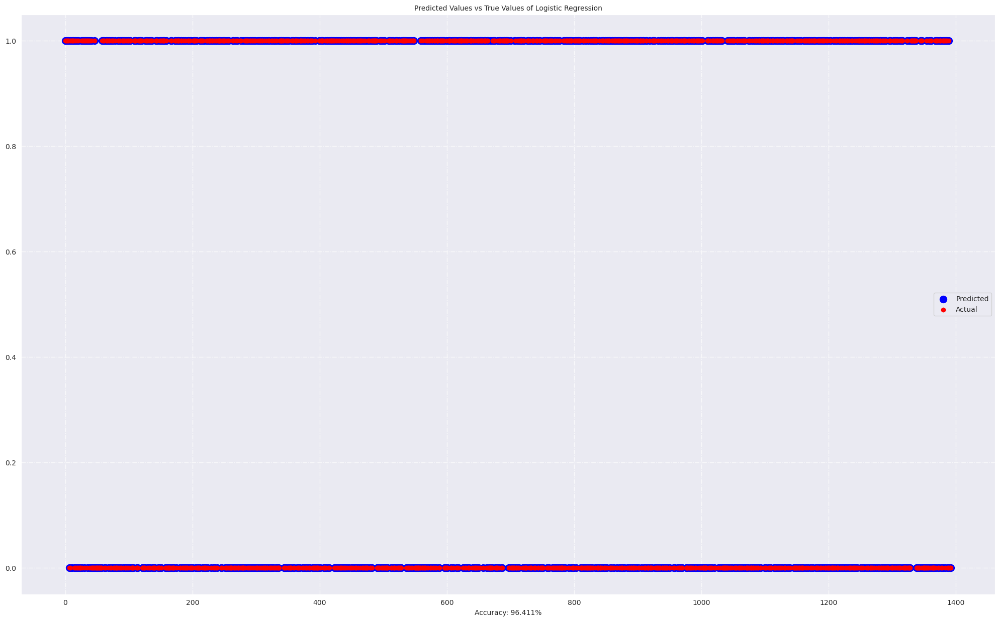

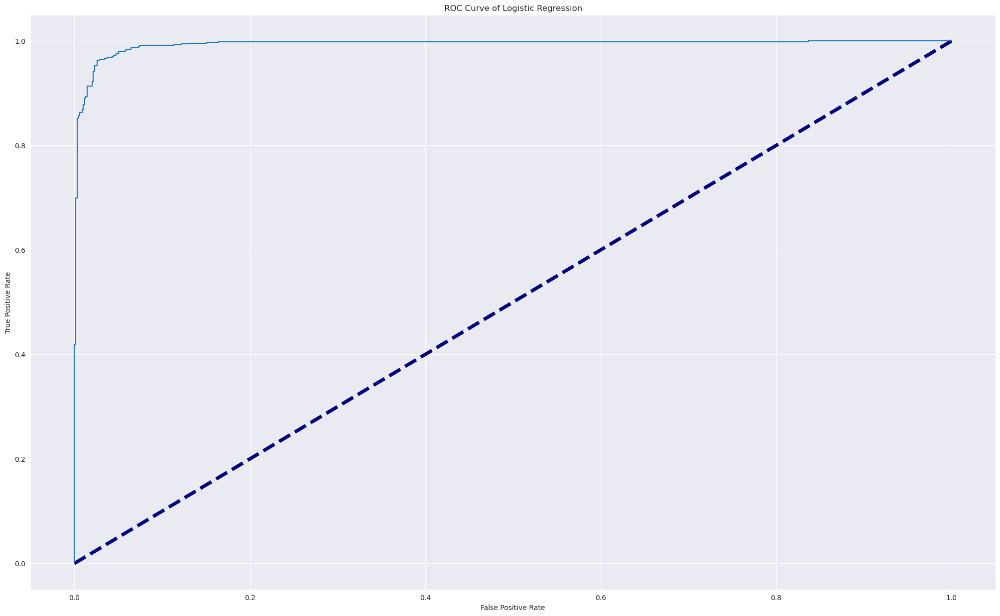

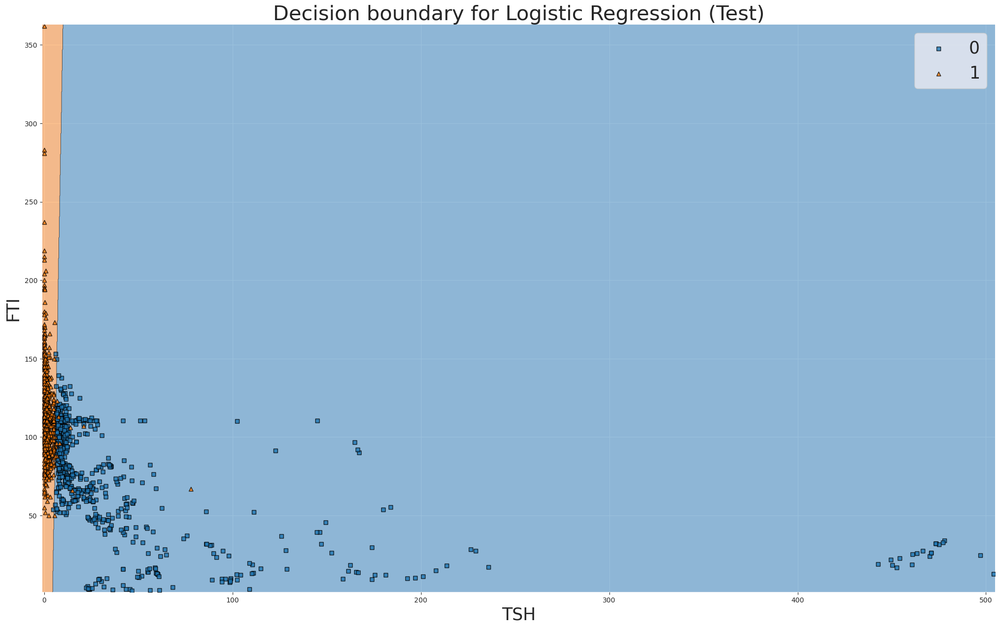

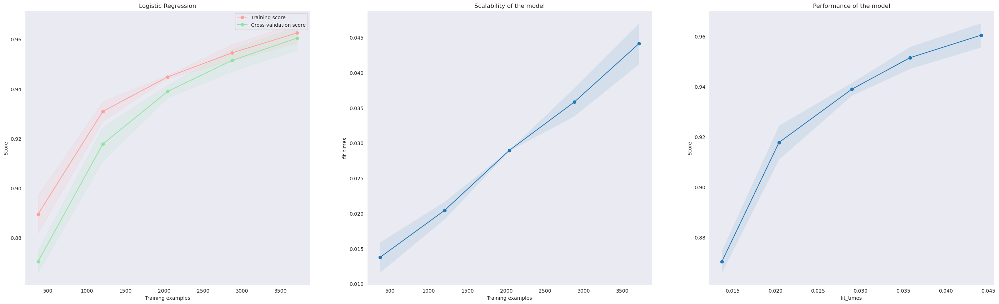

In [47]:
## Run Logistic Regression (LR) on three feature scaling:
logreg = LogisticRegression(solver='lbfgs', max_iter=5000, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('Logistic Regression', logreg, X_train, X_test, y_train, y_test, fc_name, proba=True)


KNeighbors Classifier n_neighbors = 3
Raw
accuracy:  0.9813352476669059
recall:  0.9669540229885057
precision:  0.9955621301775148
f1:  0.9810495626822157
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       697
           1       1.00      0.97      0.98       696

    accuracy                           0.98      1393
   macro avg       0.98      0.98      0.98      1393
weighted avg       0.98      0.98      0.98      1393



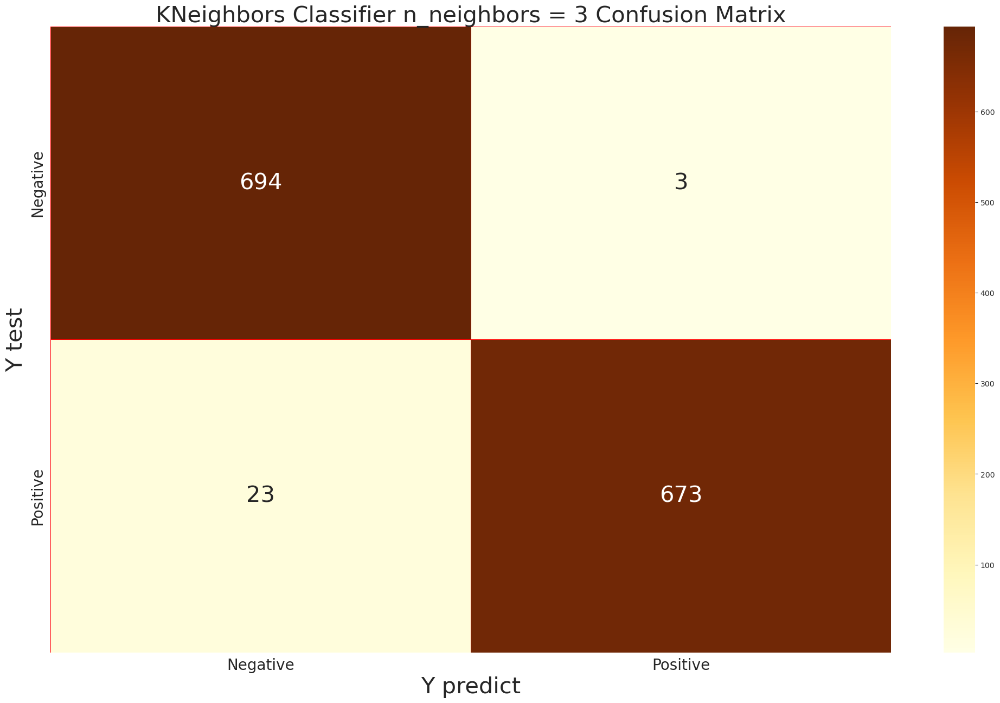

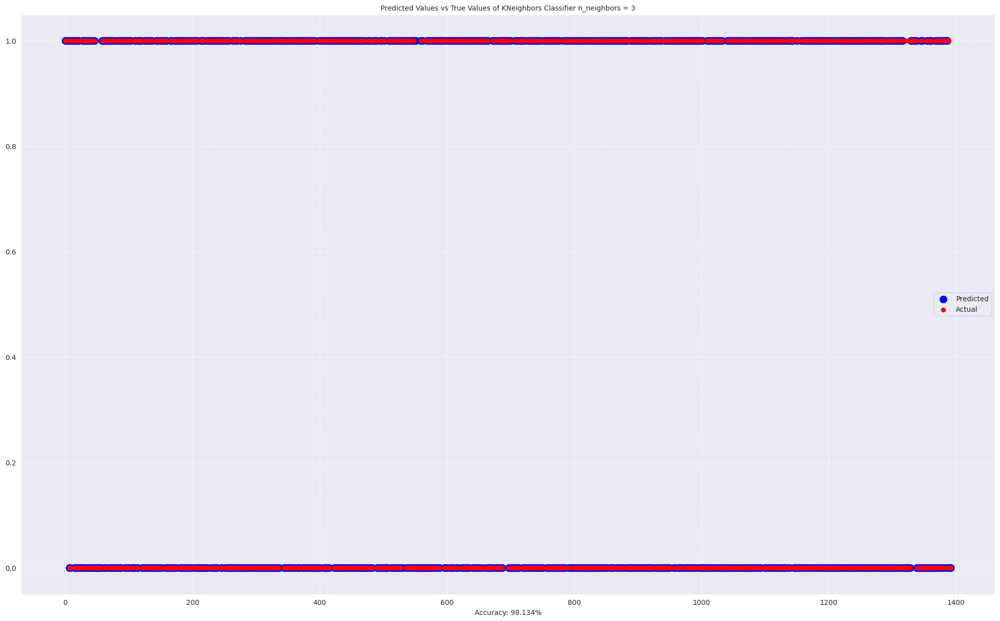

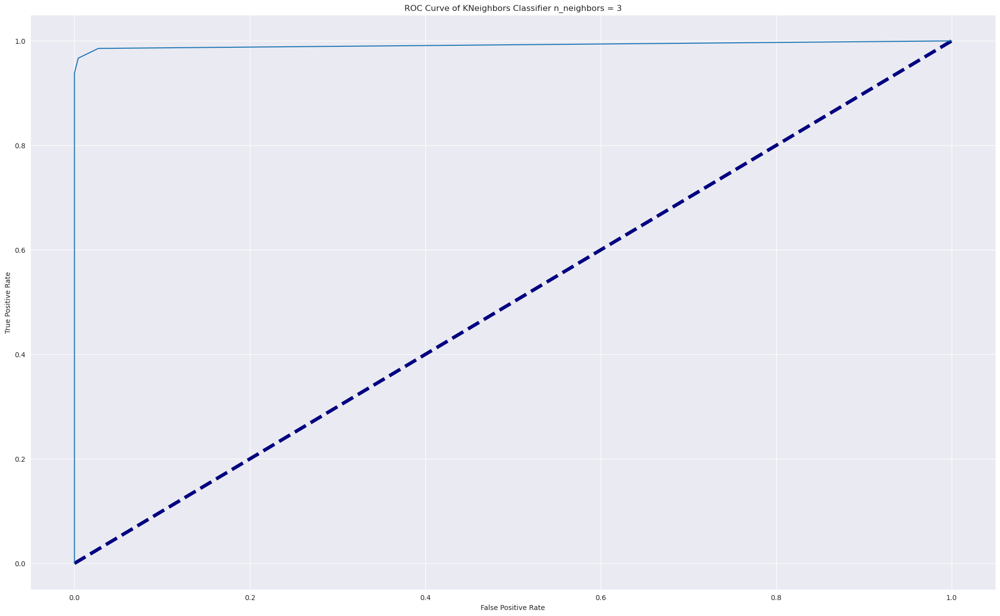

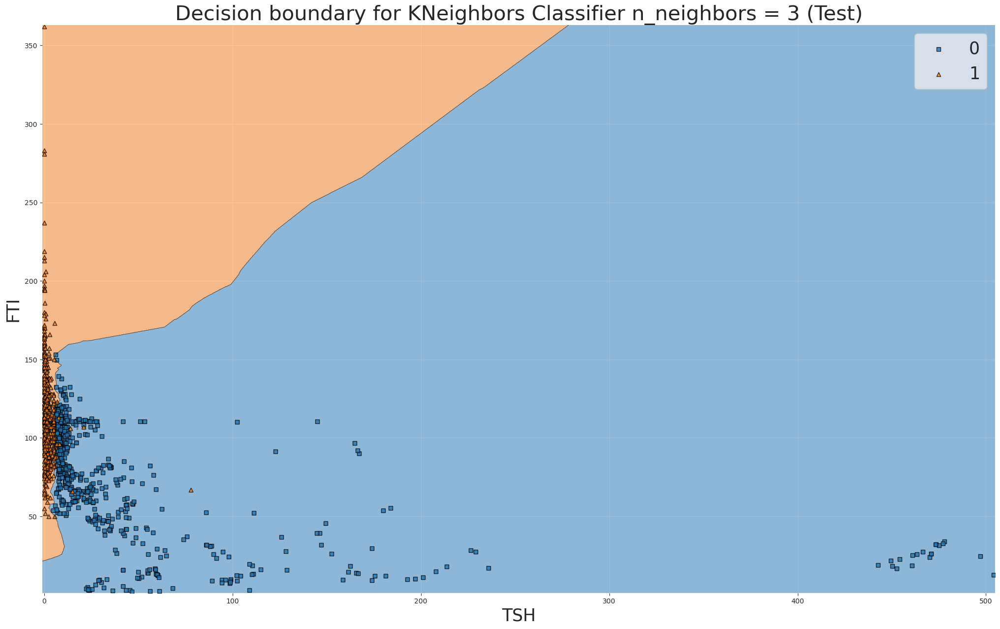

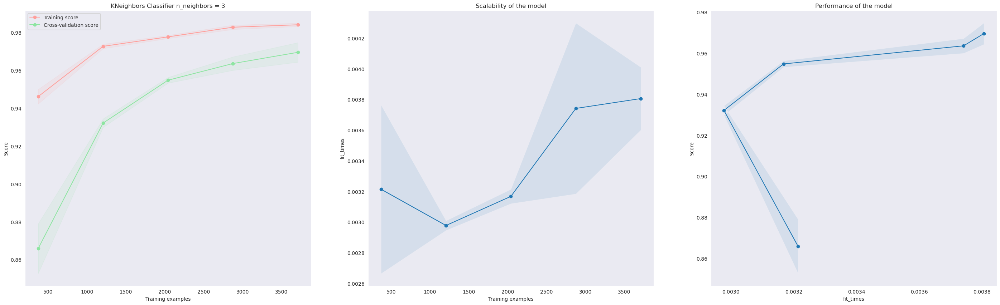

KNeighbors Classifier n_neighbors = 3
Normalization
accuracy:  0.9210337401292176
recall:  0.8778735632183908
precision:  0.960691823899371
f1:  0.9174174174174174
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       697
           1       0.96      0.88      0.92       696

    accuracy                           0.92      1393
   macro avg       0.92      0.92      0.92      1393
weighted avg       0.92      0.92      0.92      1393



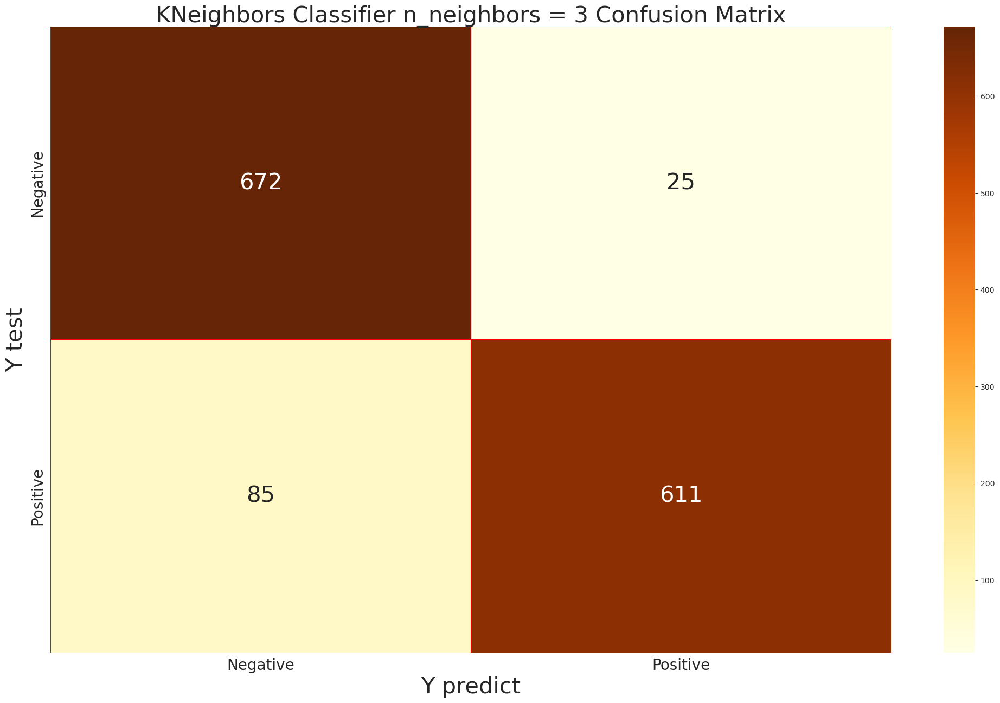

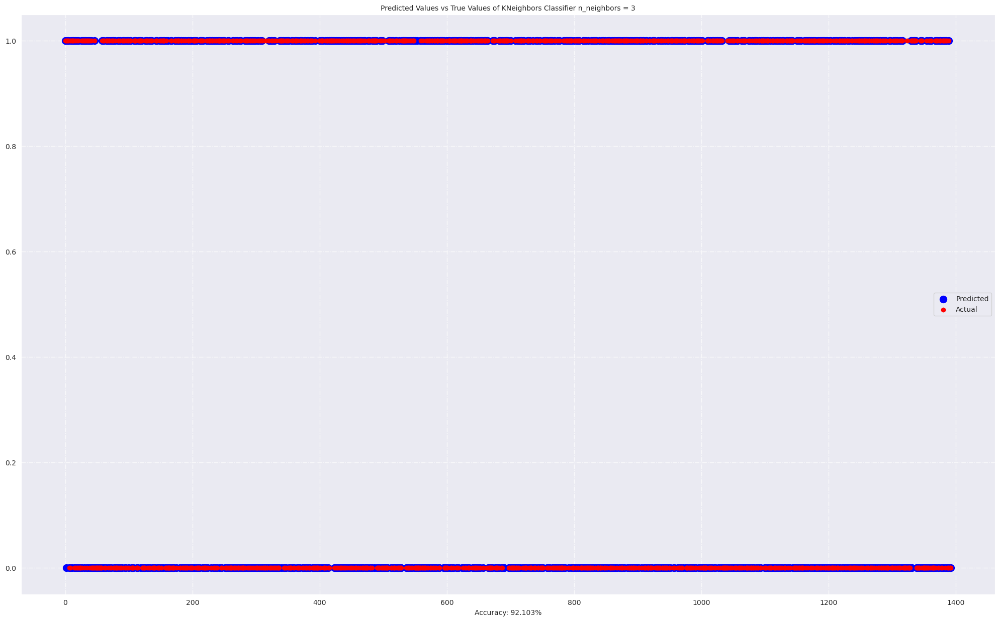

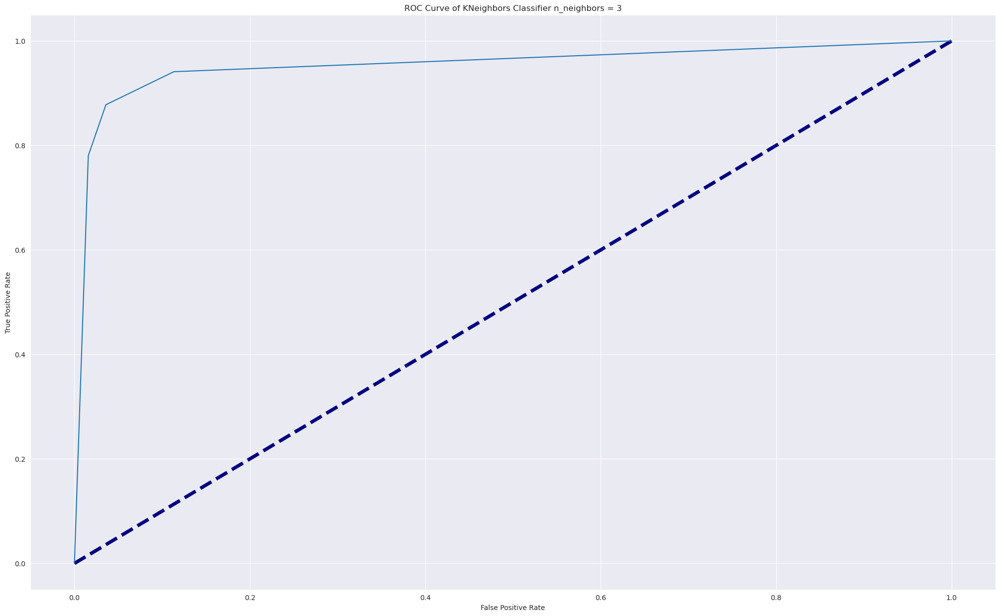

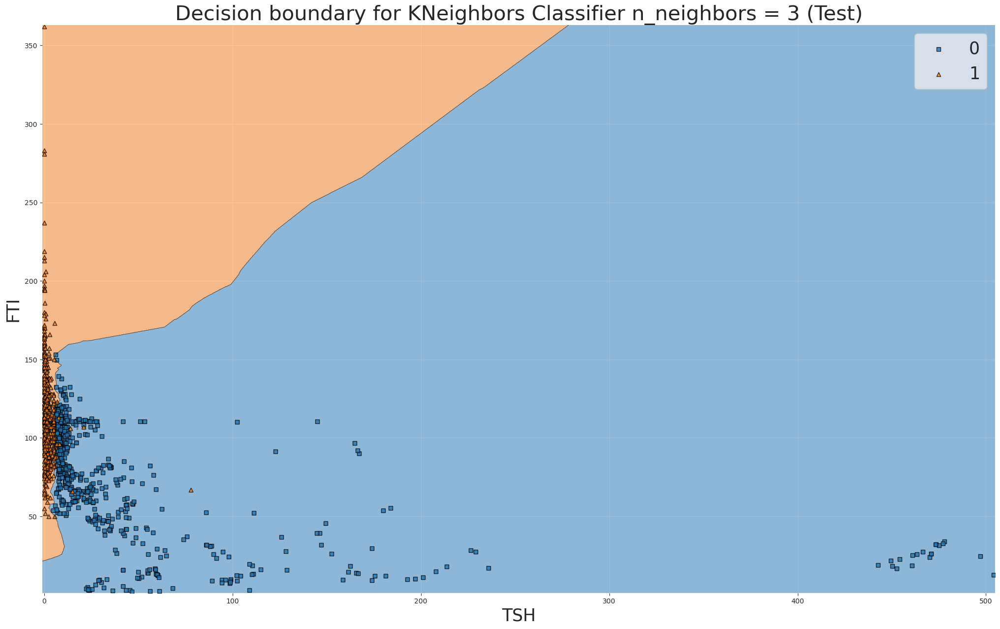

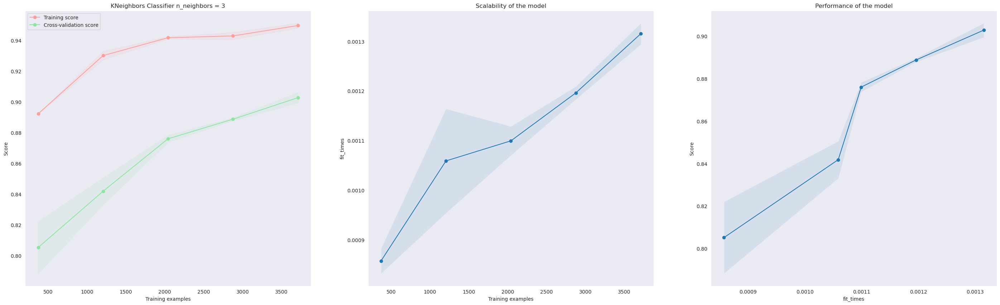

KNeighbors Classifier n_neighbors = 3
Standardization
accuracy:  0.9203158650394831
recall:  0.8836206896551724
precision:  0.9534883720930233
f1:  0.9172259507829977
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       697
           1       0.95      0.88      0.92       696

    accuracy                           0.92      1393
   macro avg       0.92      0.92      0.92      1393
weighted avg       0.92      0.92      0.92      1393



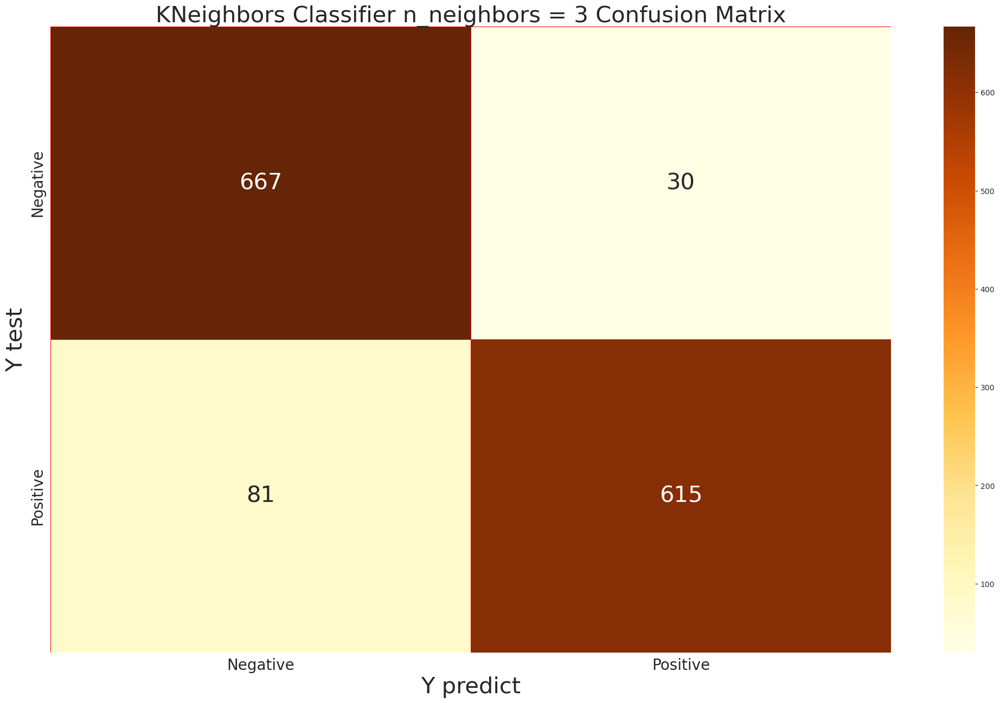

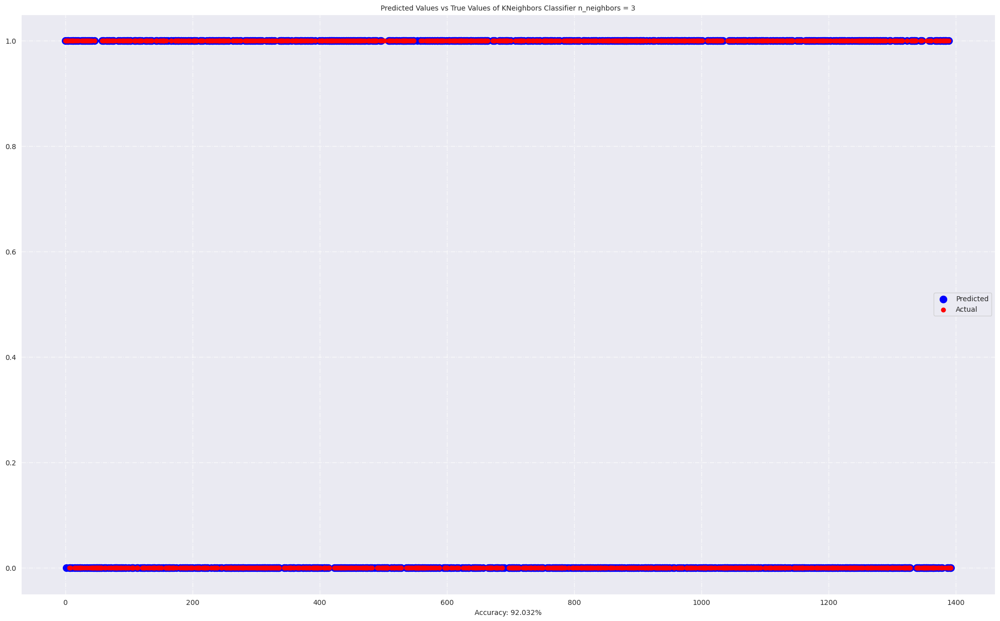

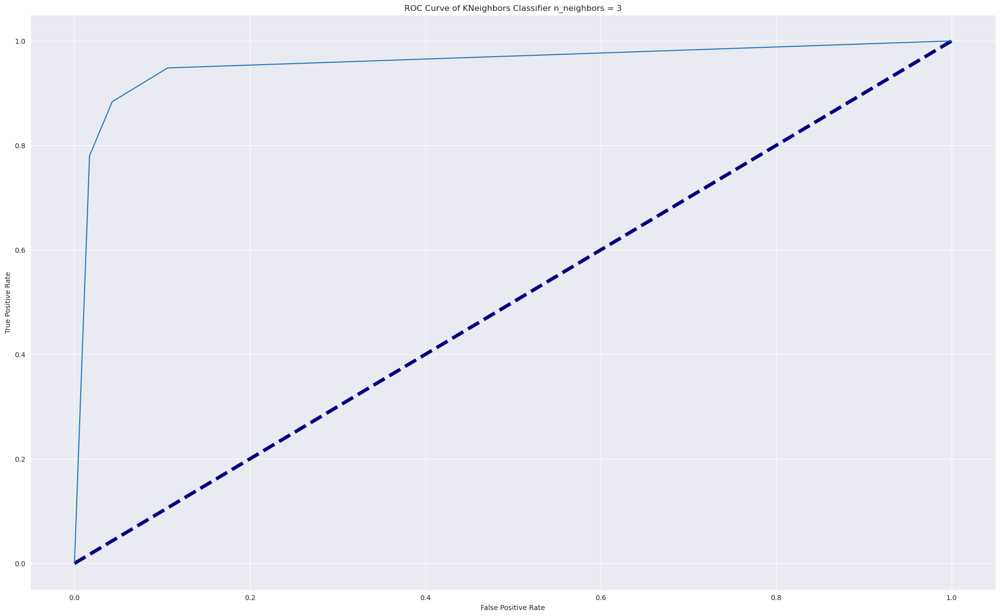

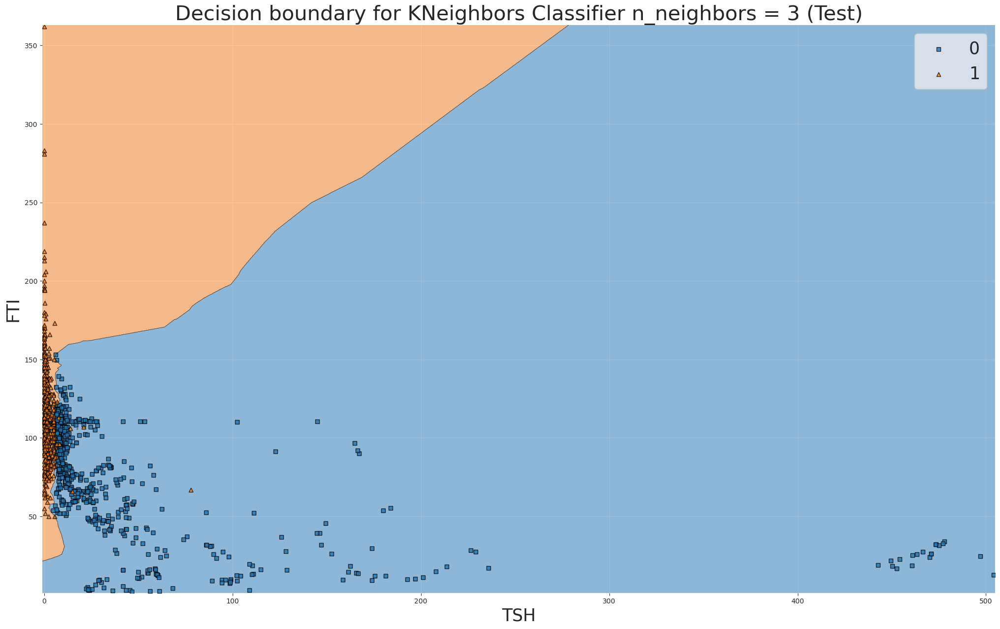

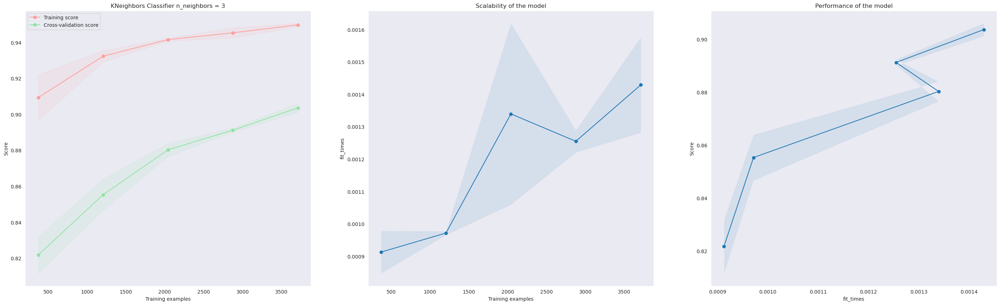

In [48]:
## Run K-Nearest Neighbors (KNN) on three feature scaling:
for fc_name, value in feature_scaling.items():
    scores_1 = []
    X_train, X_test, y_train, y_test = value
    for i in range(2, 50):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(X_train, y_train)
        scores_1.append(accuracy_score(y_test, knn.predict(X_test)))
    
    max_val = max(scores_1)
    max_index = np.argmax(scores_1) + 2
    knn = KNeighborsClassifier(n_neighbors=max_index)
    knn.fit(X_train, y_train)
    run_model(f'KNeighbors Classifier n_neighbors = {max_index}', knn, X_train, X_test, y_train, y_test, fc_name, proba=True)


DecisionTree Classifier
Raw
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



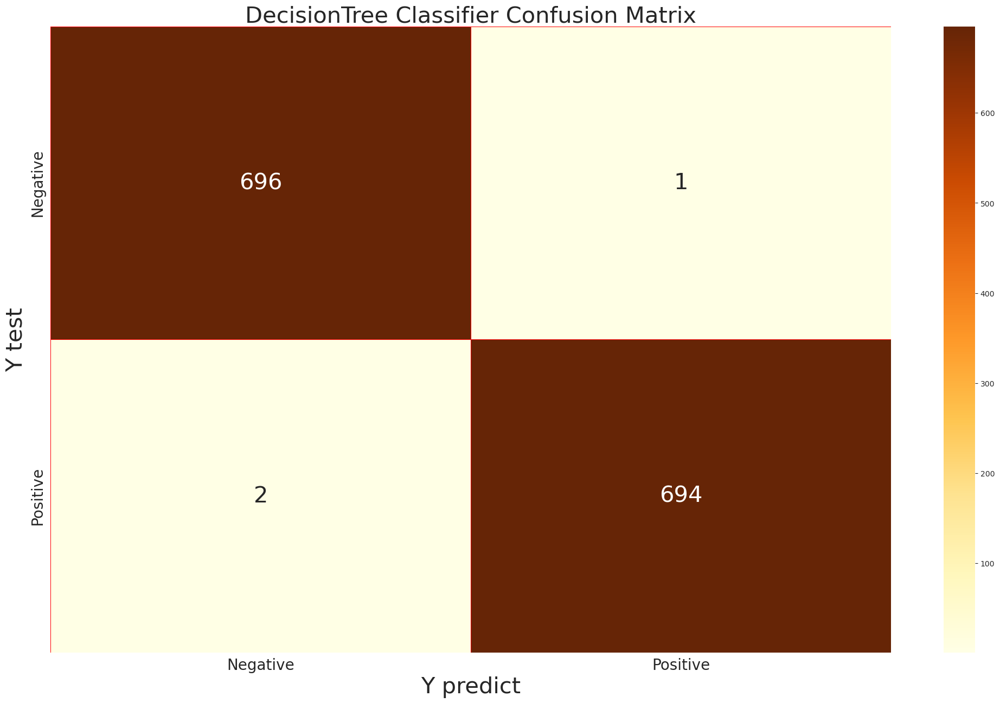

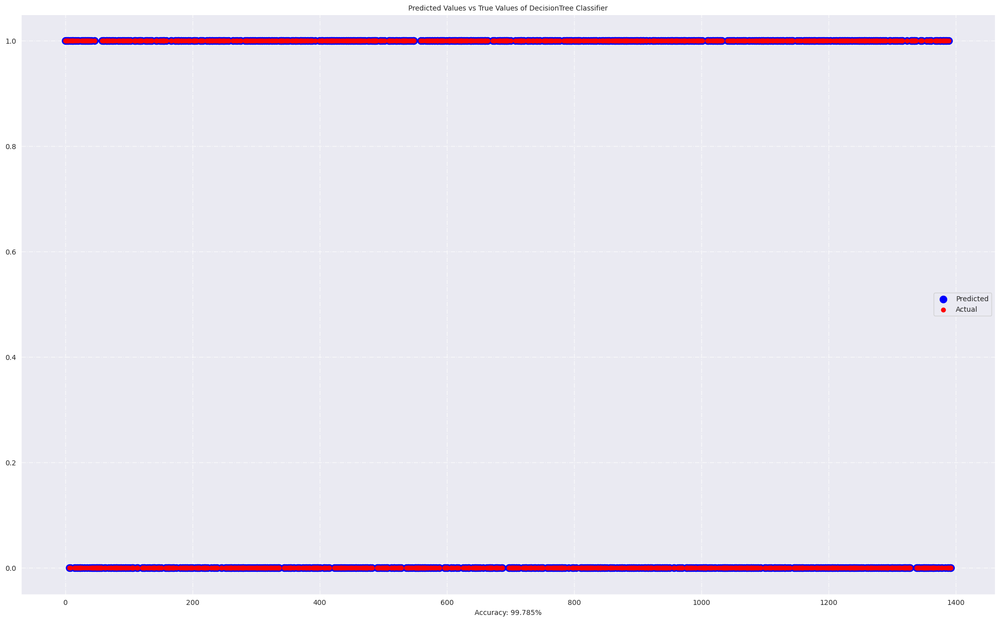

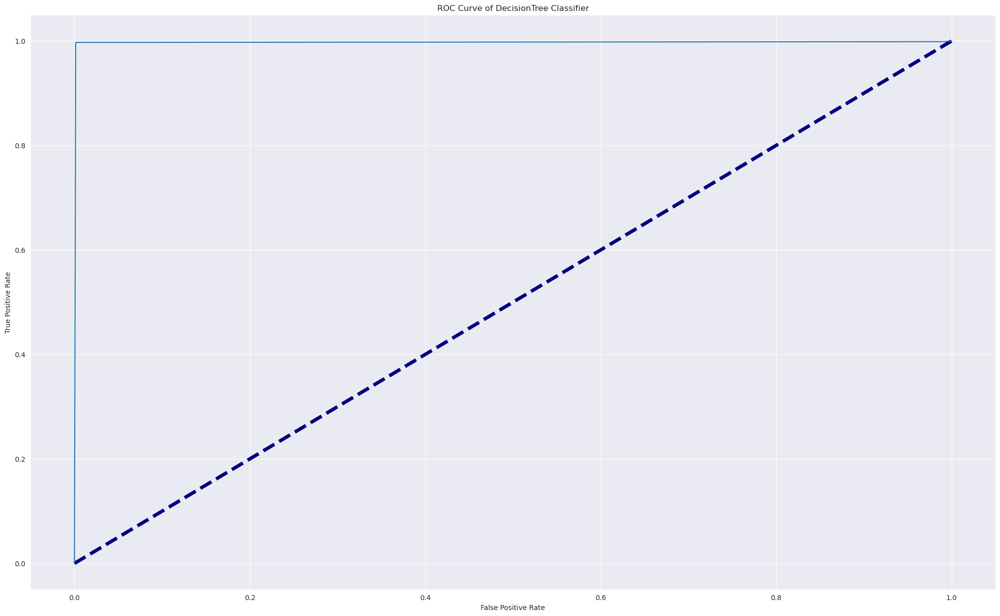

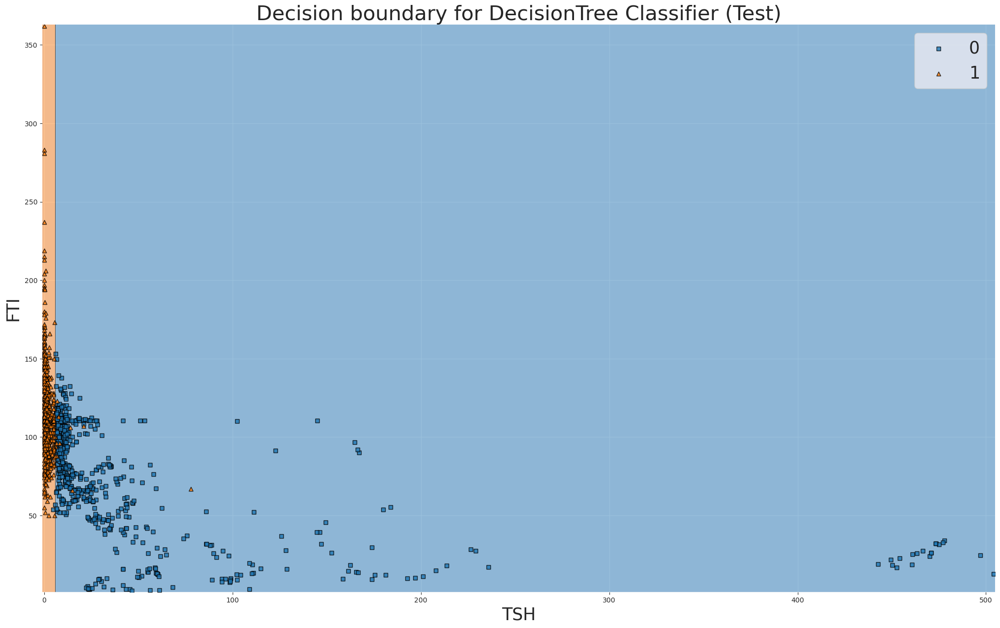

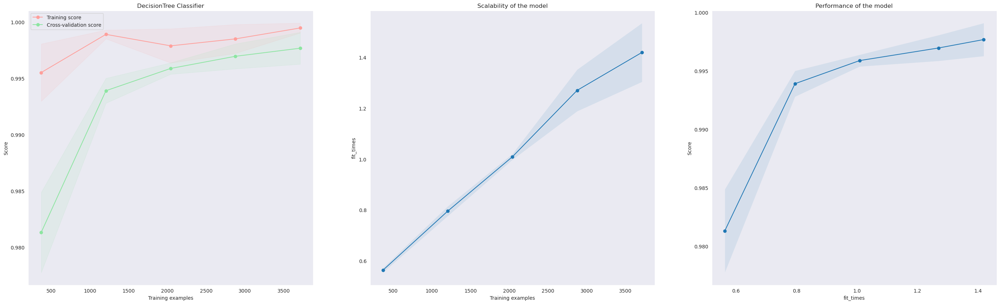

DecisionTree Classifier
Normalization
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



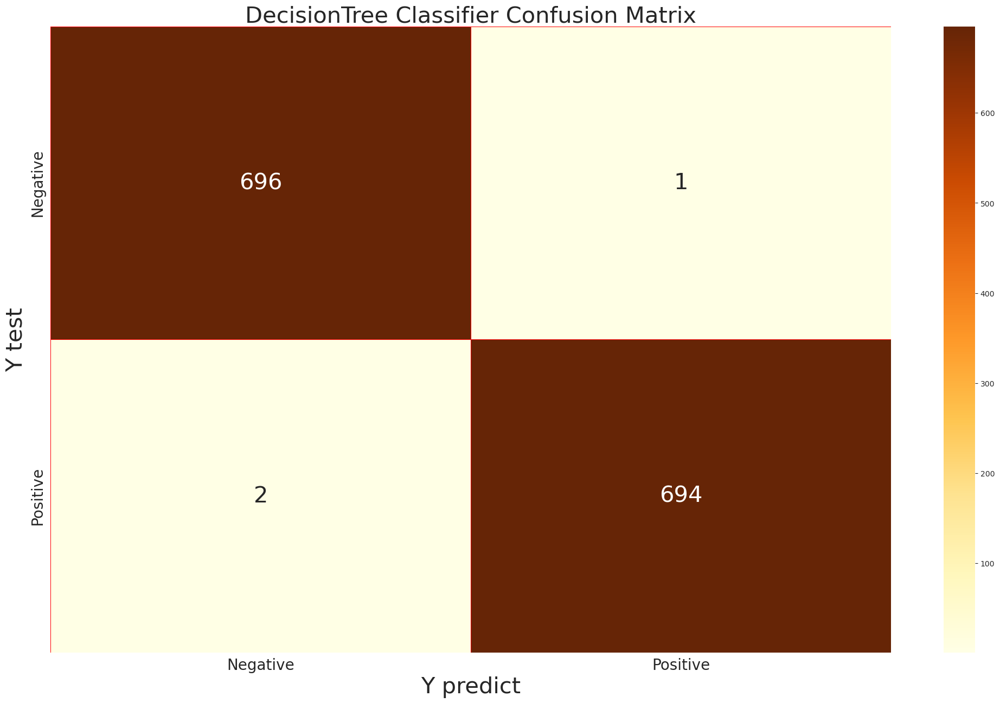

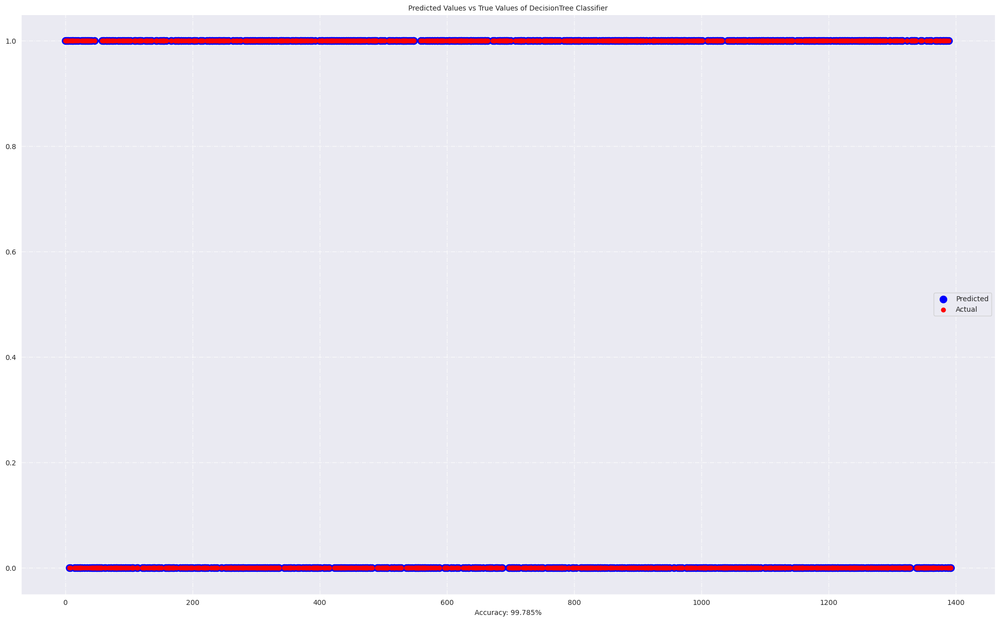

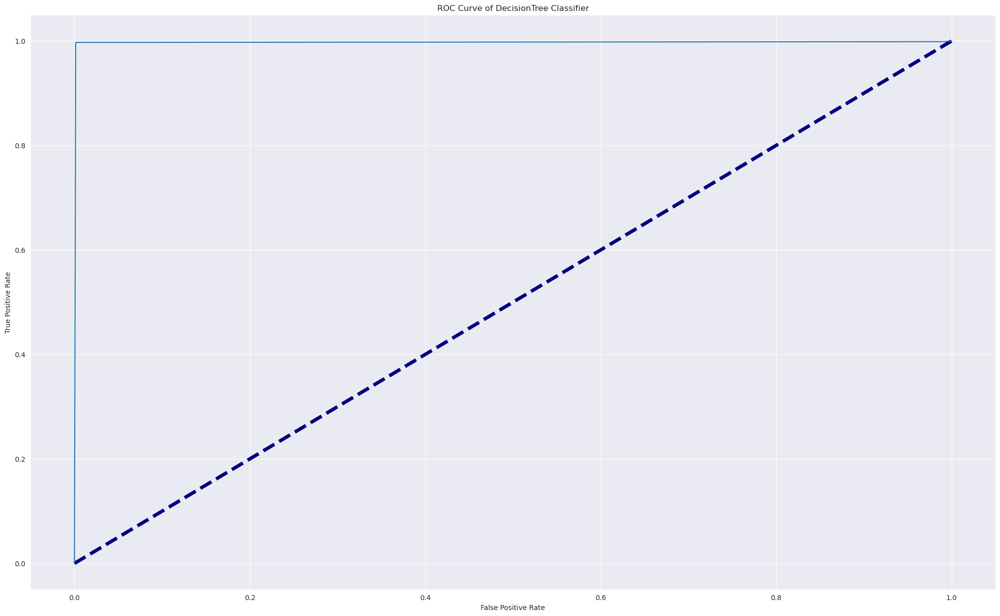

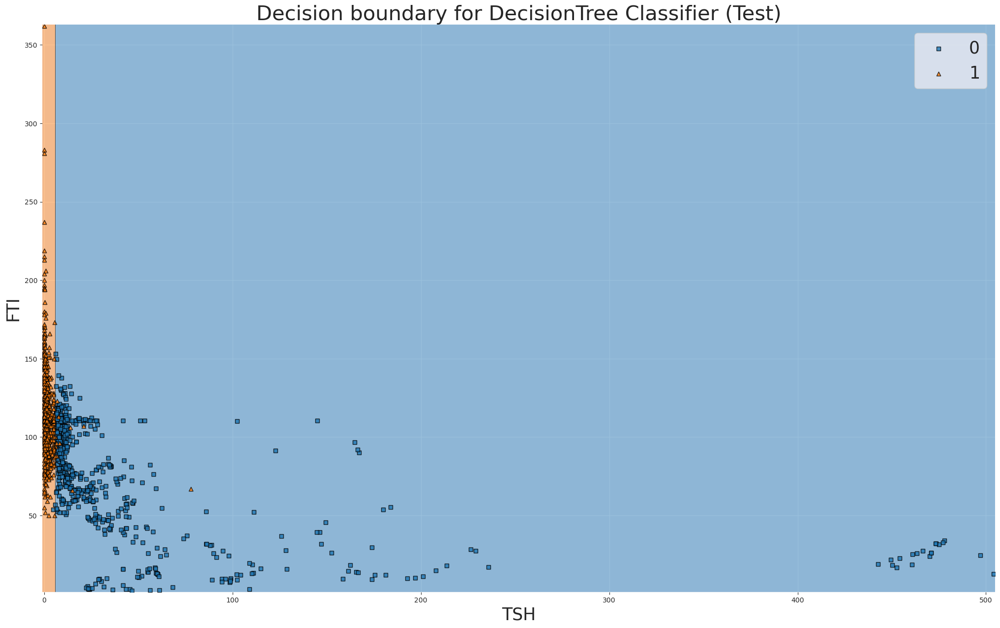

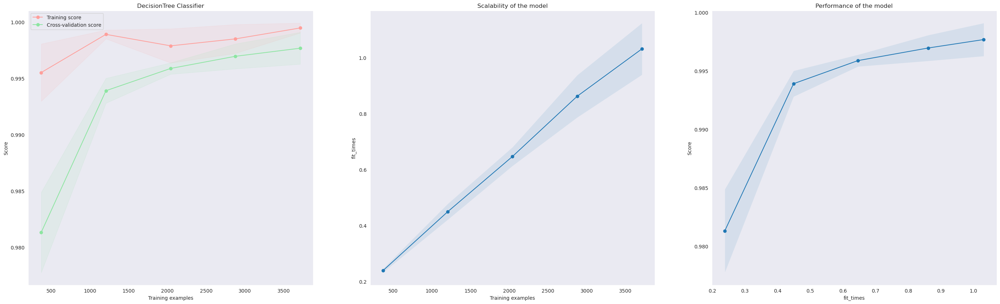

DecisionTree Classifier
Standardization
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



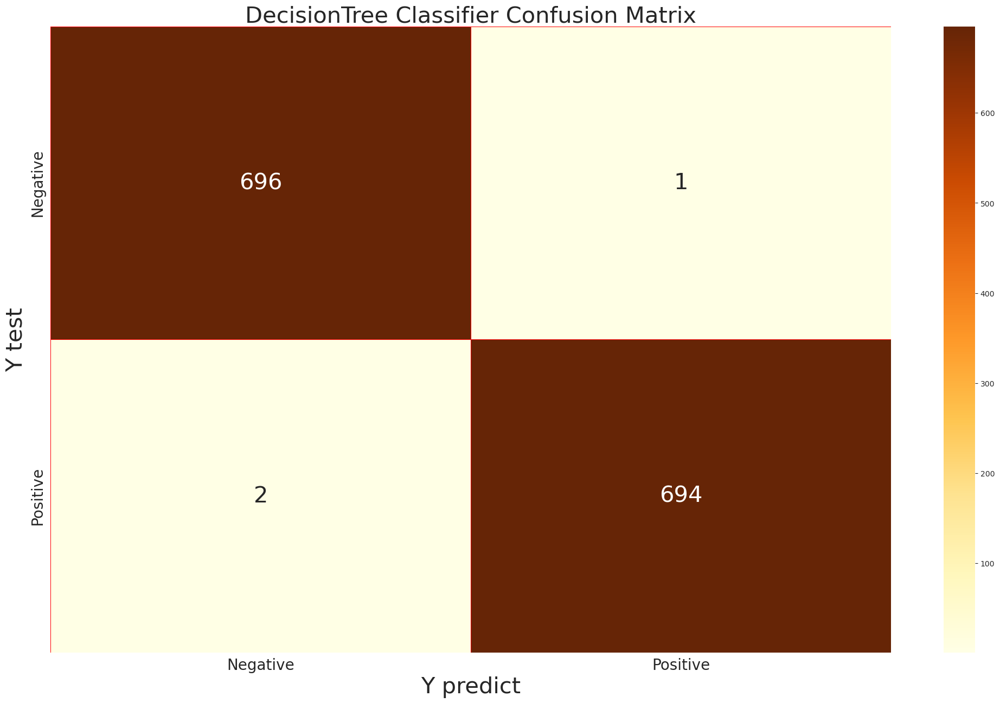

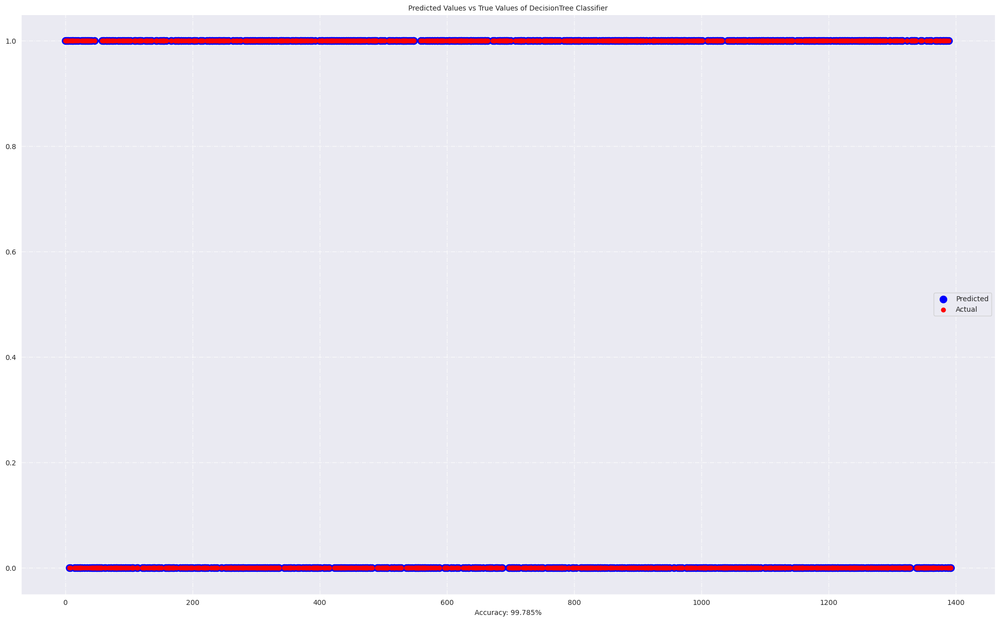

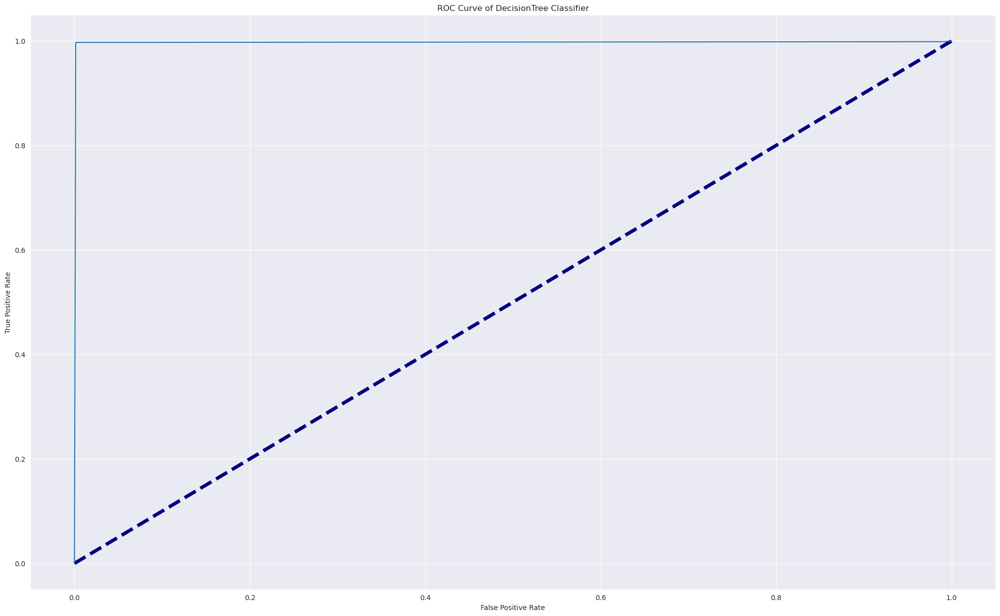

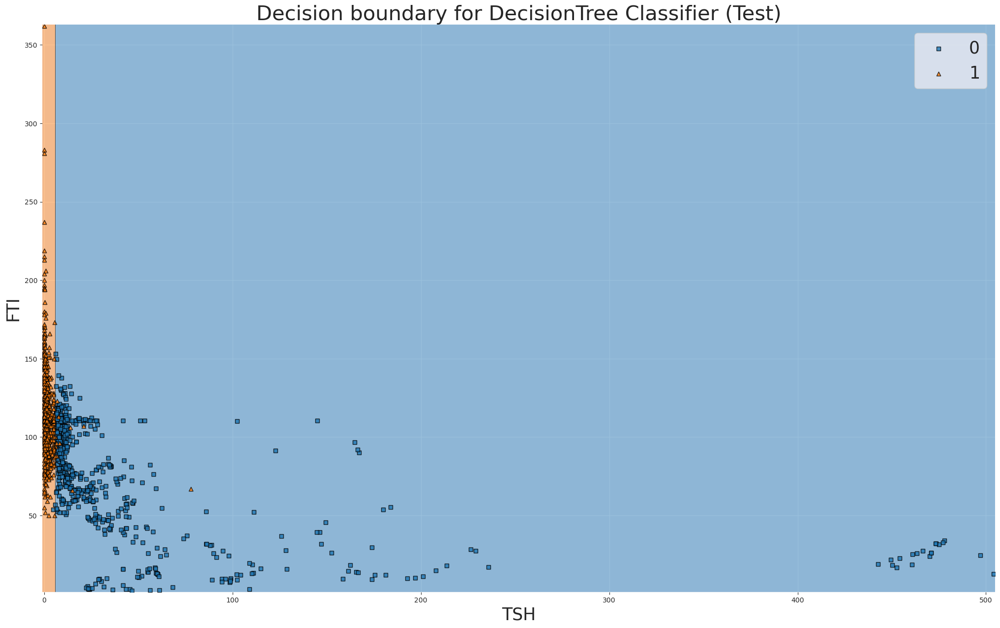

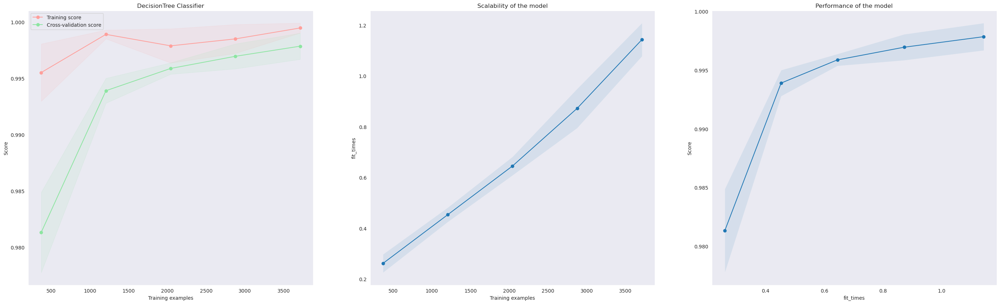

In [49]:
for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    dt = DecisionTreeClassifier()
    parameters = {
        'max_depth': np.arange(1, 21, 1),
        'random_state': [2021]
    }
    searcher = GridSearchCV(dt, parameters)
    run_model('DecisionTree Classifier', searcher, X_train, X_test, y_train, y_test, fc_name, proba= True)


RandomForest Classifier
Raw
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



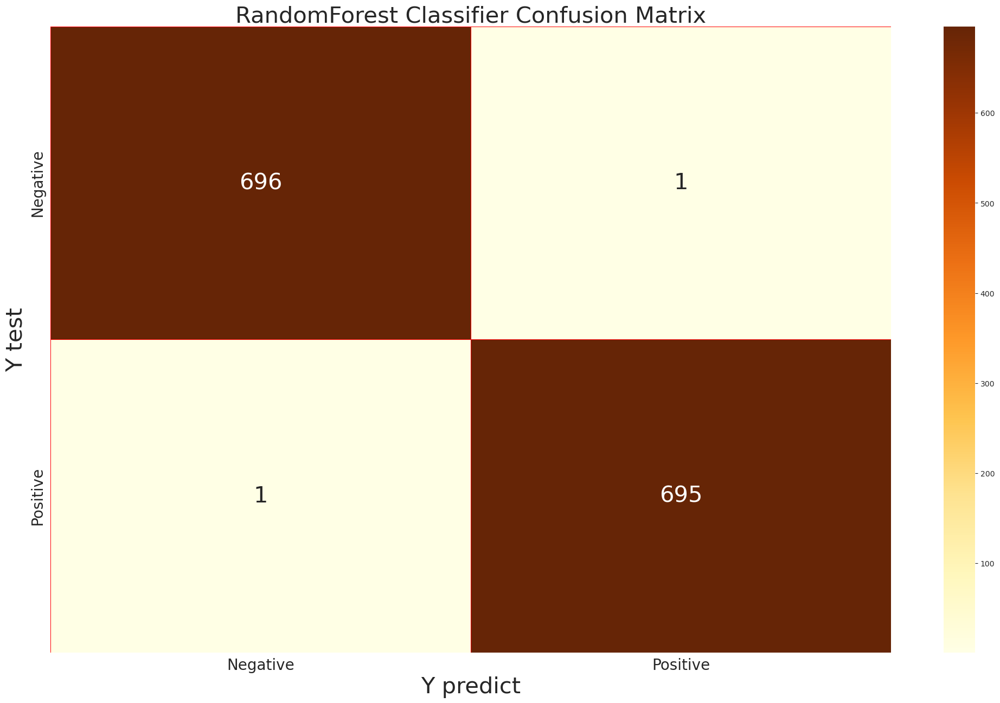

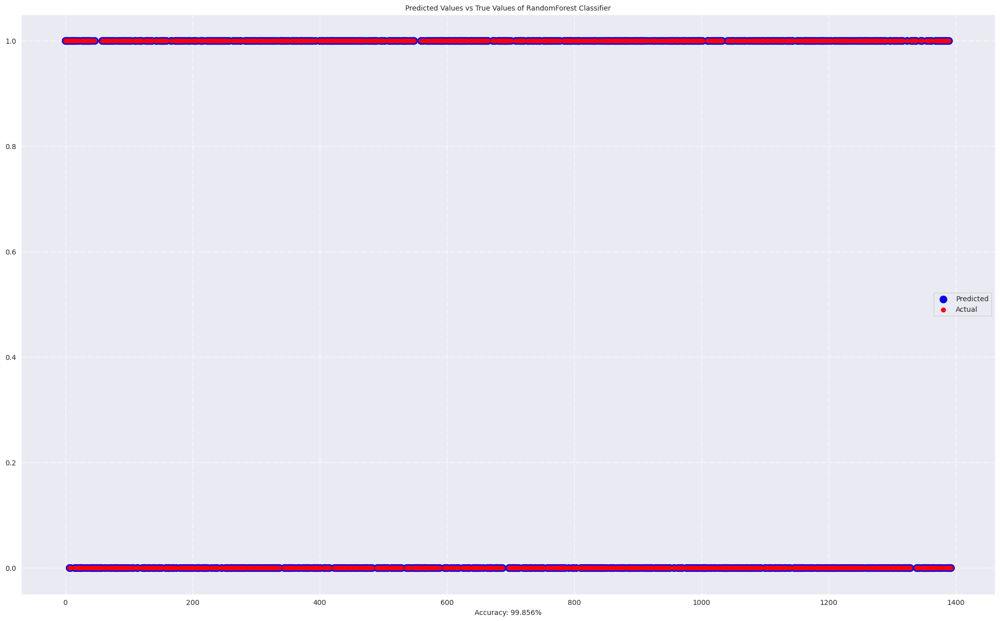

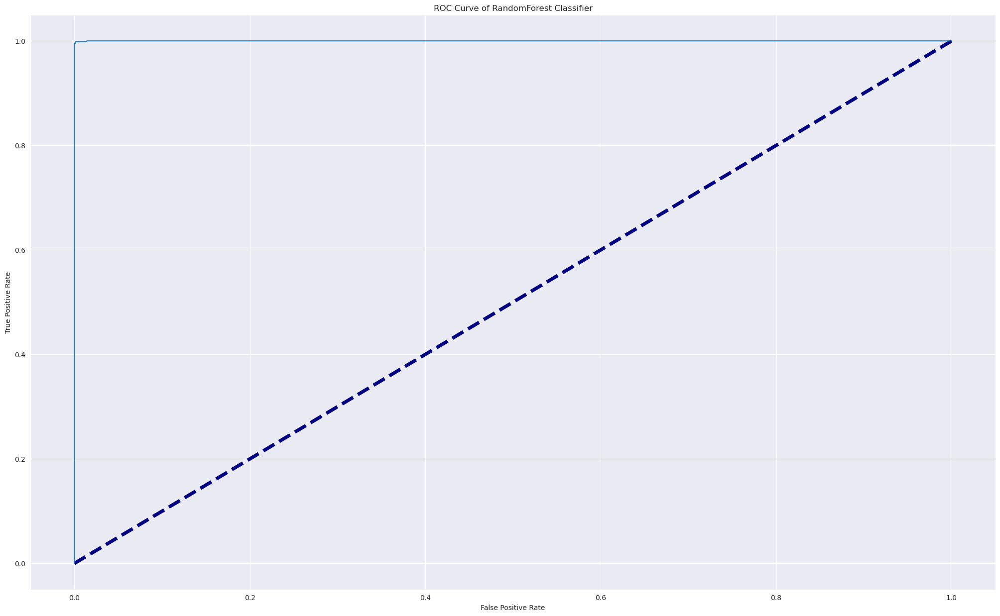

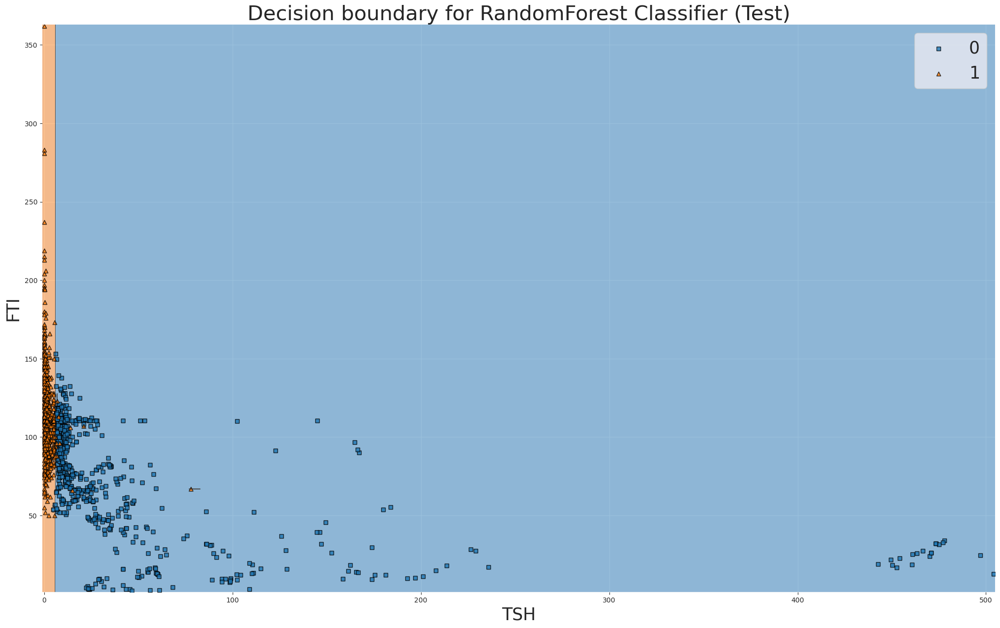

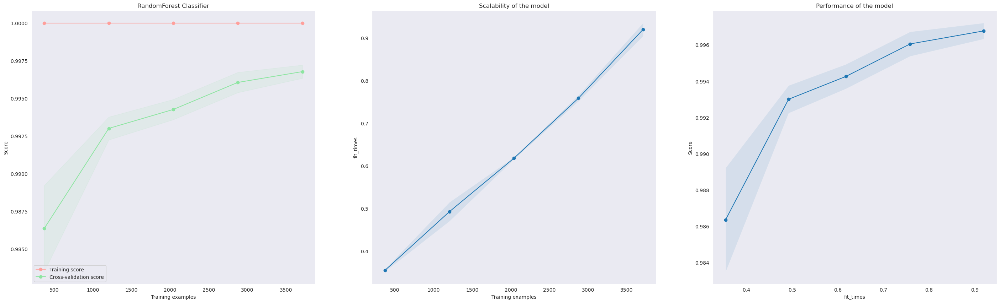

RandomForest Classifier
Normalization
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



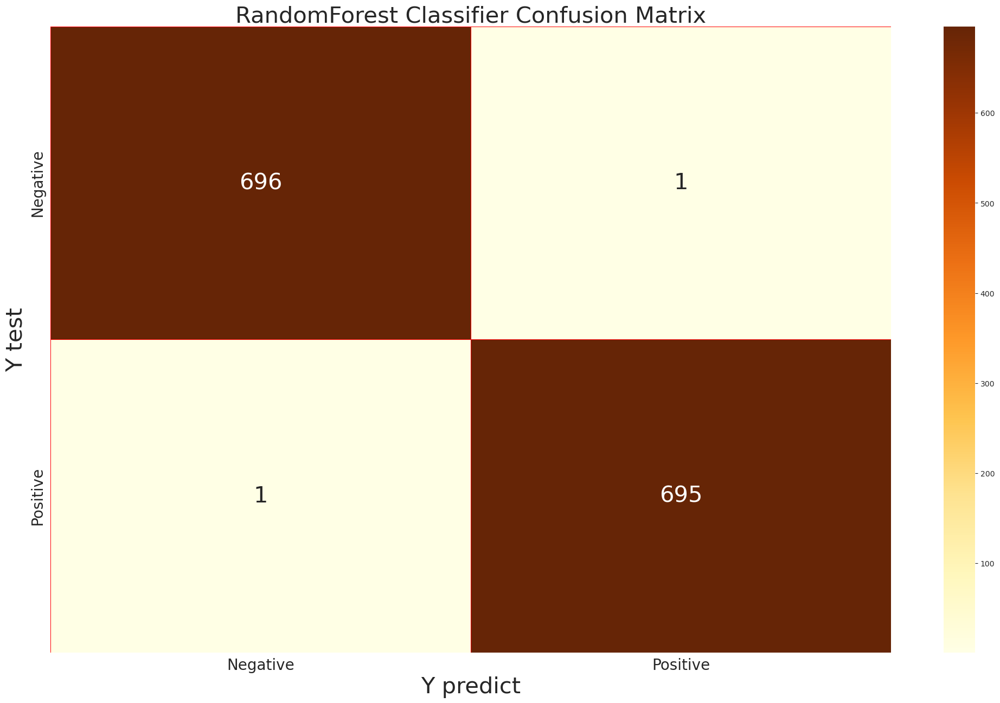

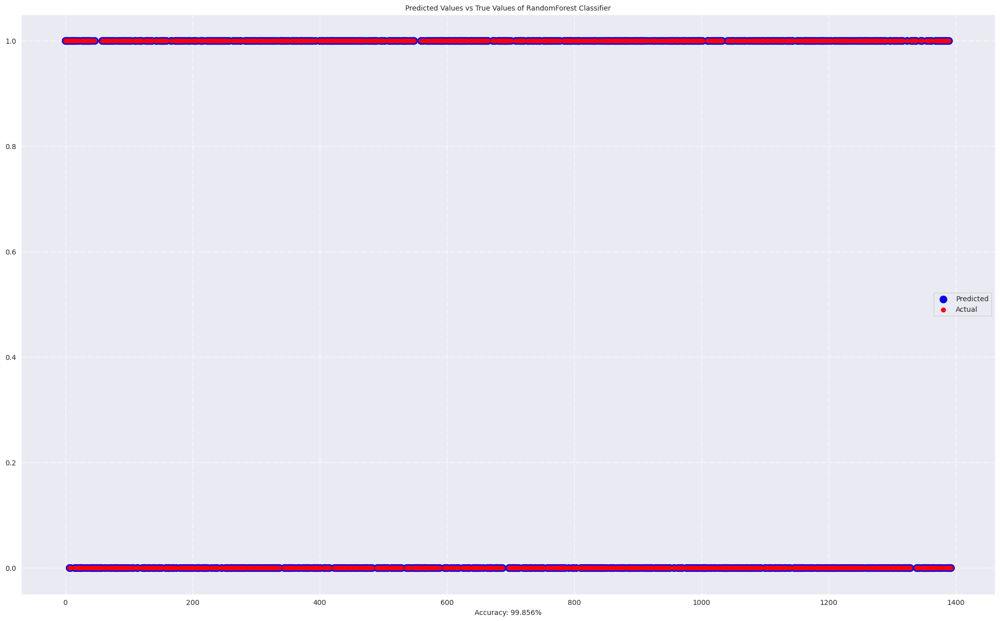

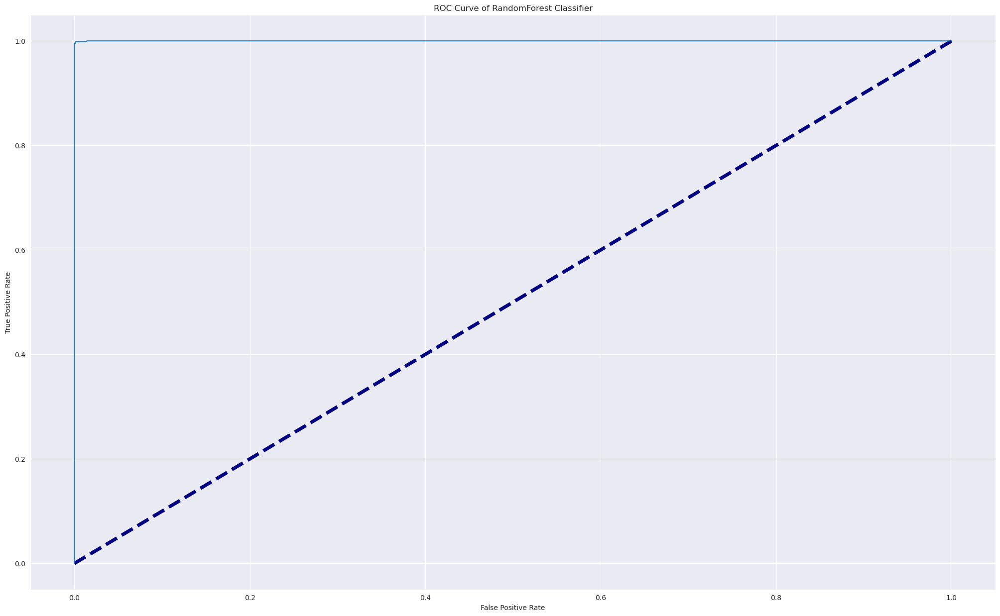

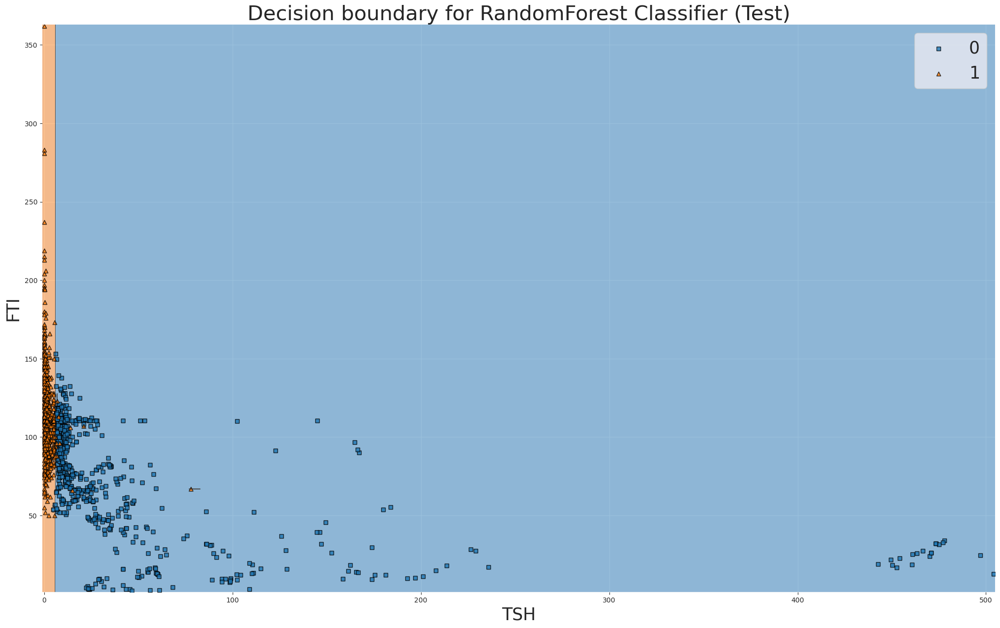

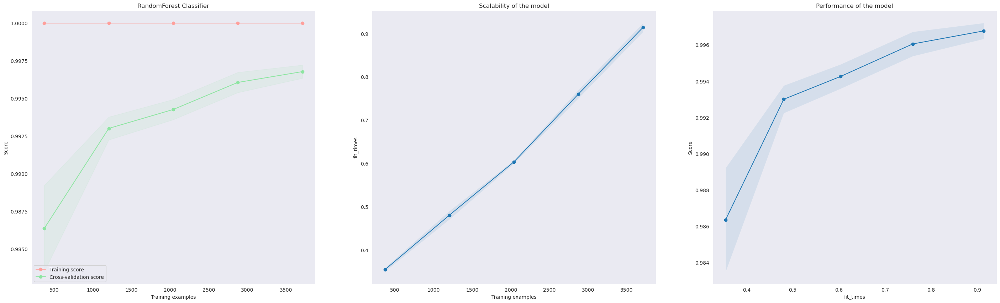

RandomForest Classifier
Standardization
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



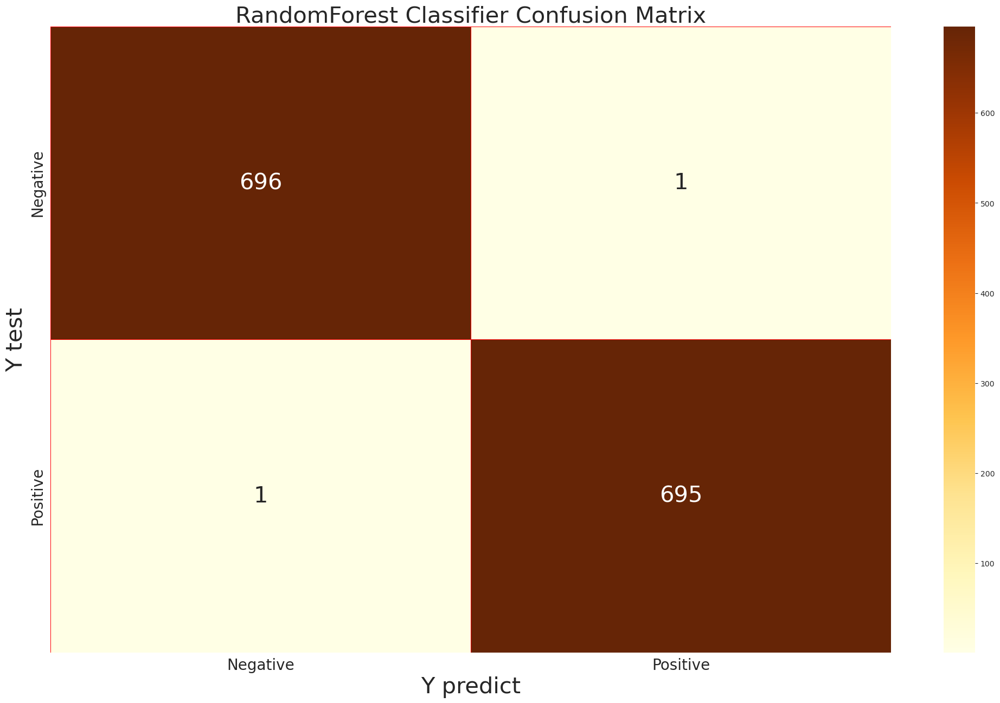

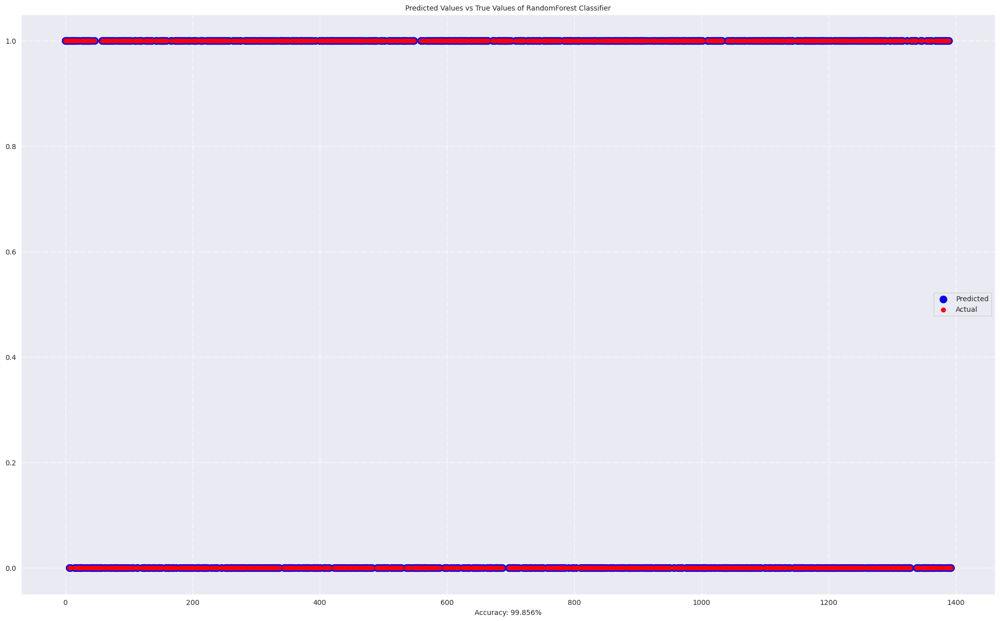

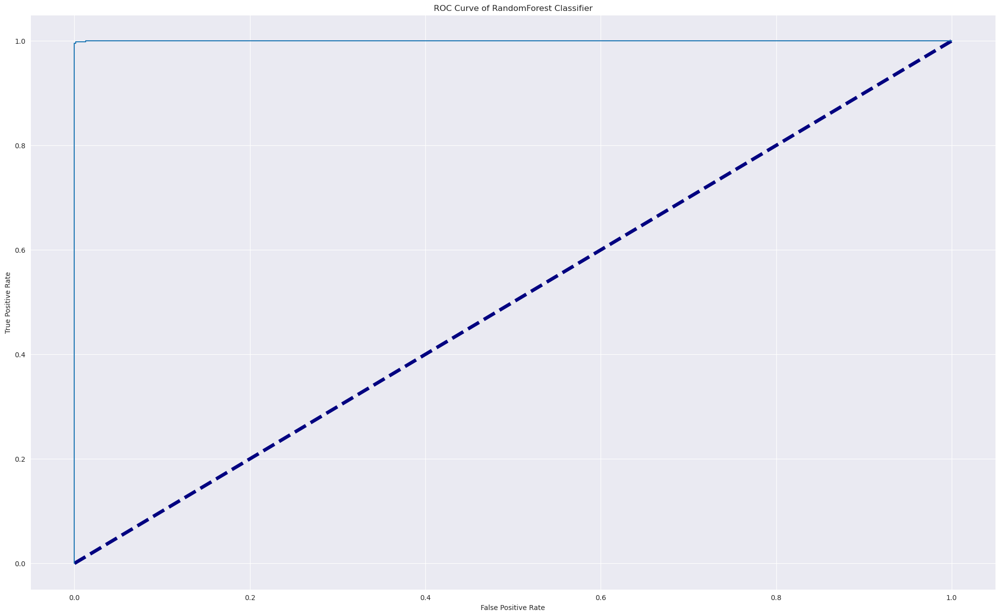

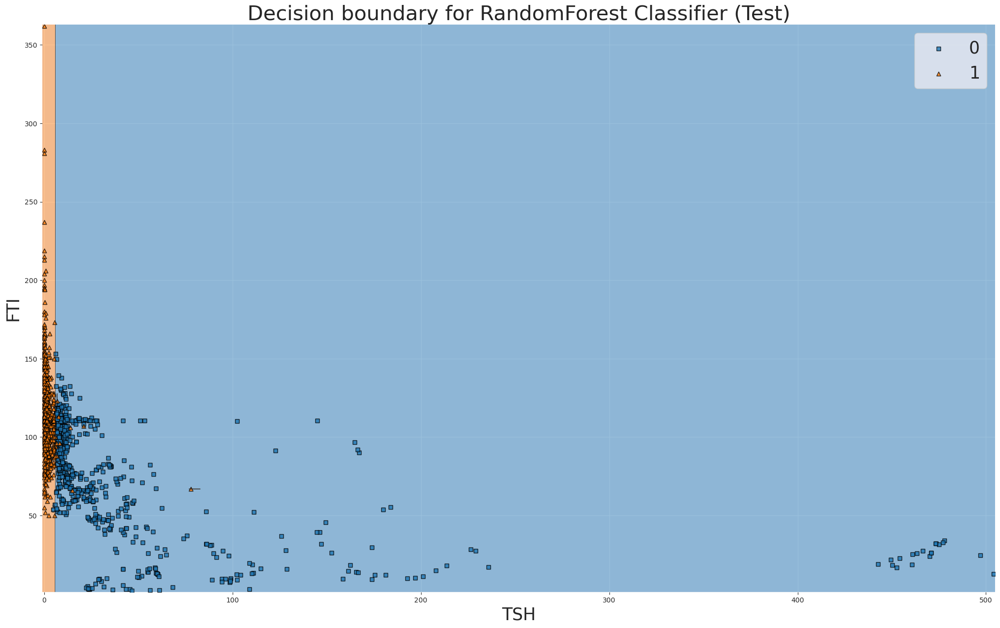

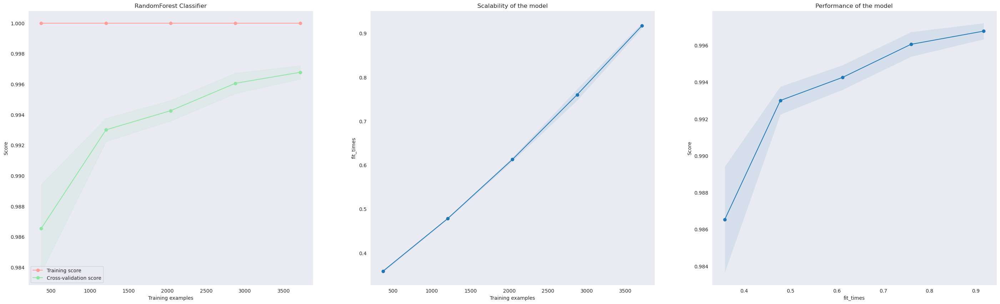

In [50]:
## Run Random Forest (RF) classifier on three feature scaling:
rf = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('RandomForest Classifier', rf, X_train, X_test, y_train, y_test, fc_name, proba=True)

GradientBoosting Classifier
Raw
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



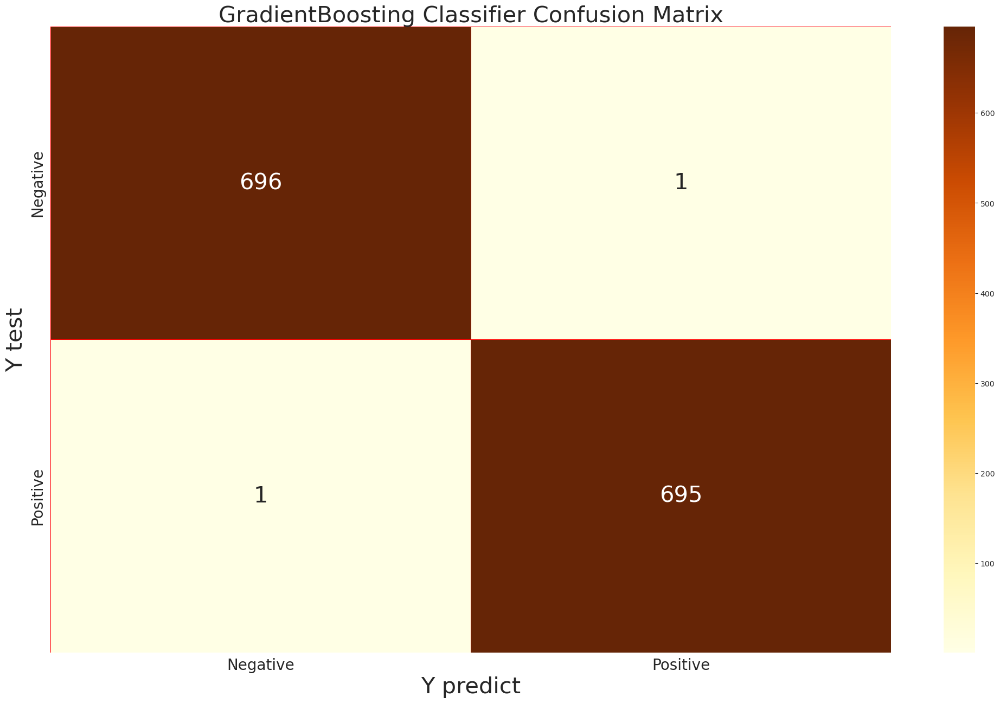

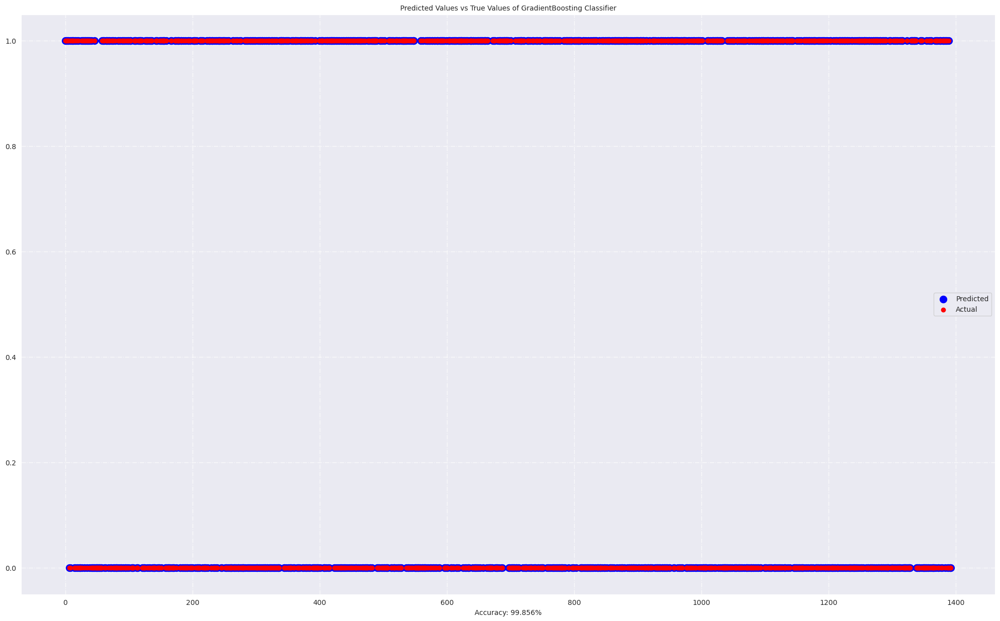

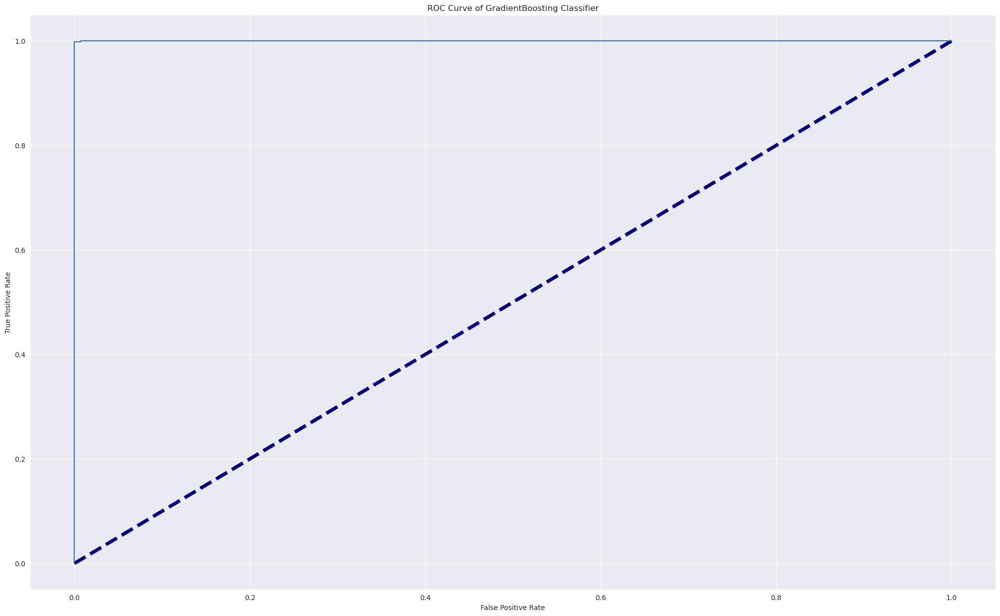

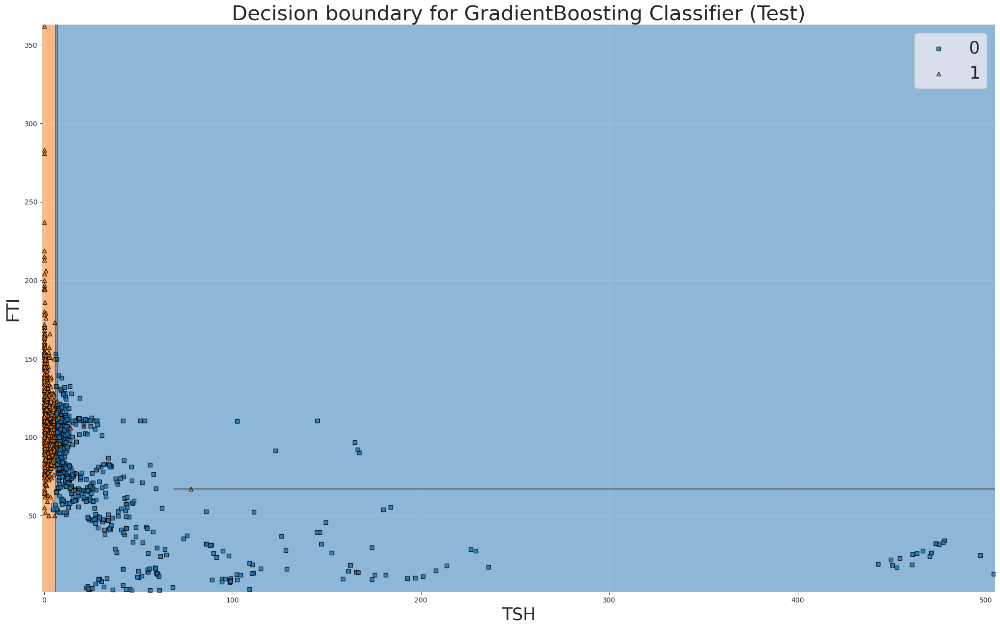

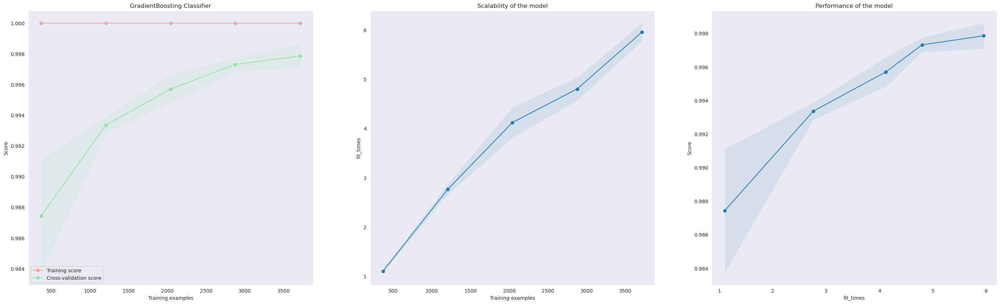

GradientBoosting Classifier
Normalization
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



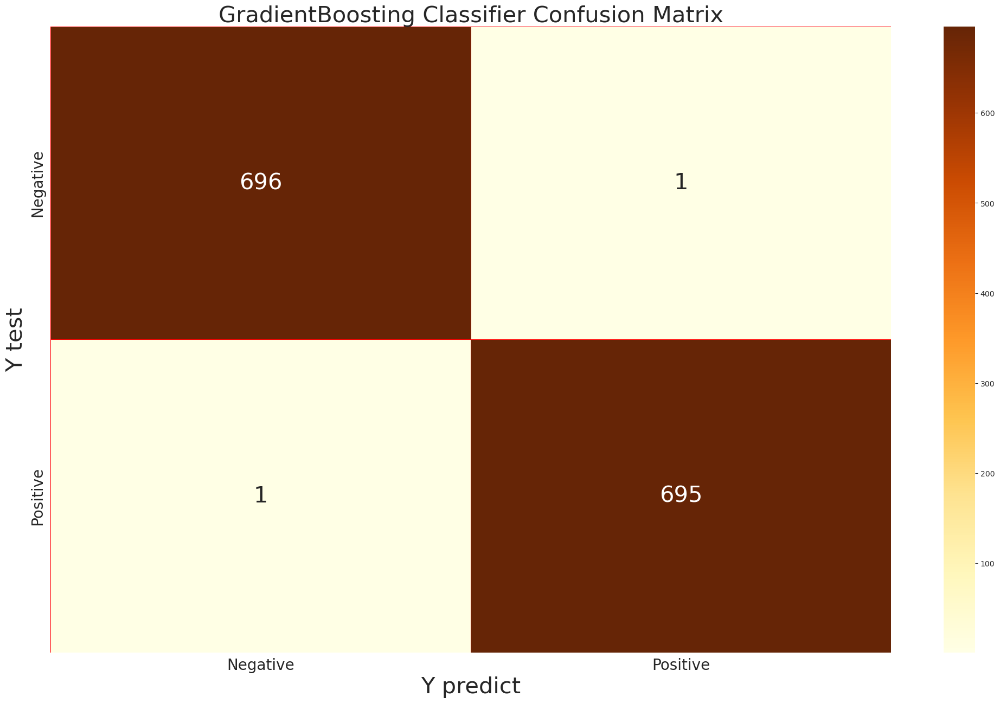

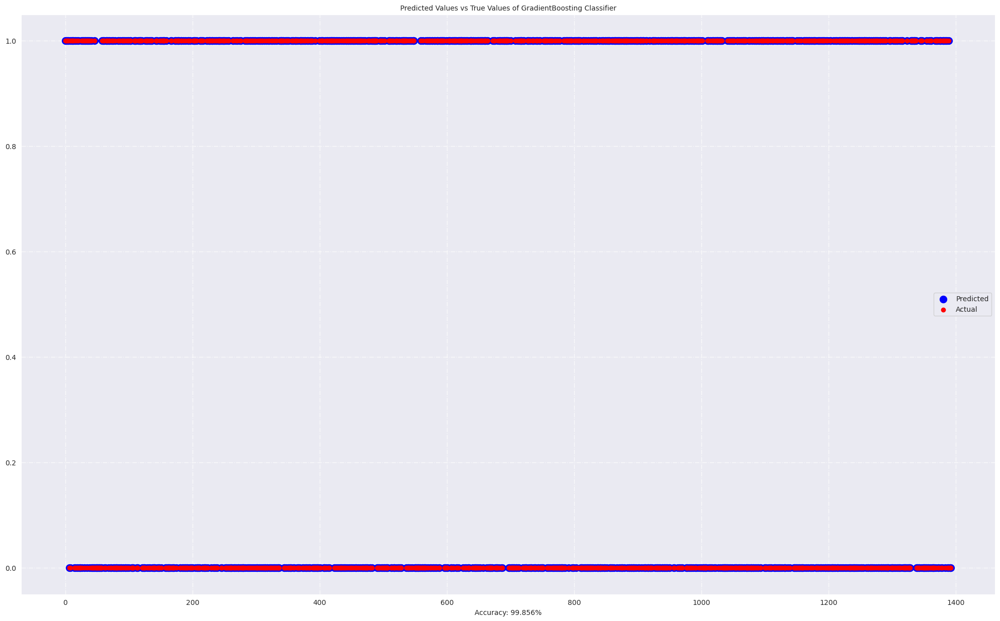

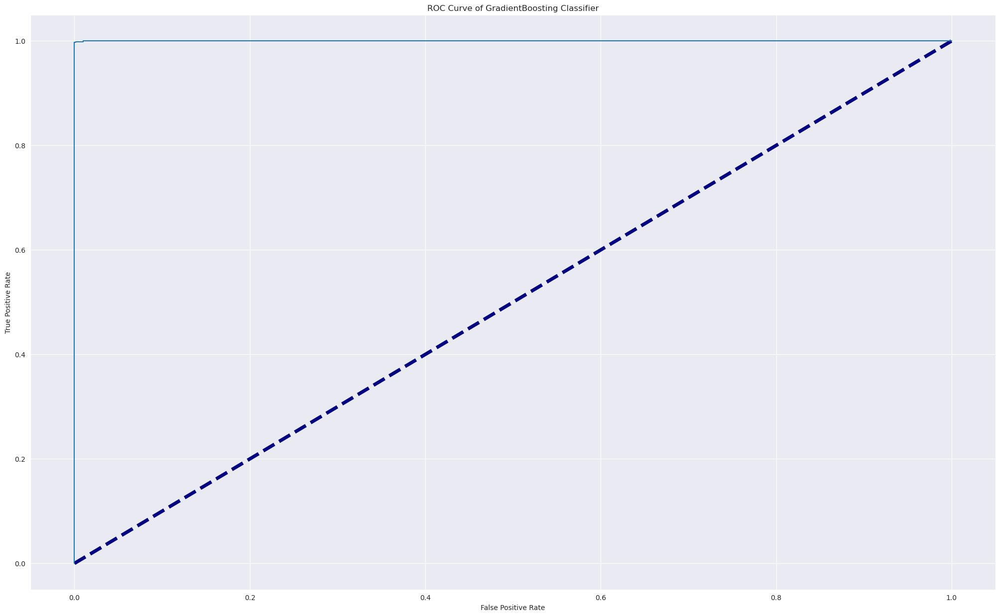

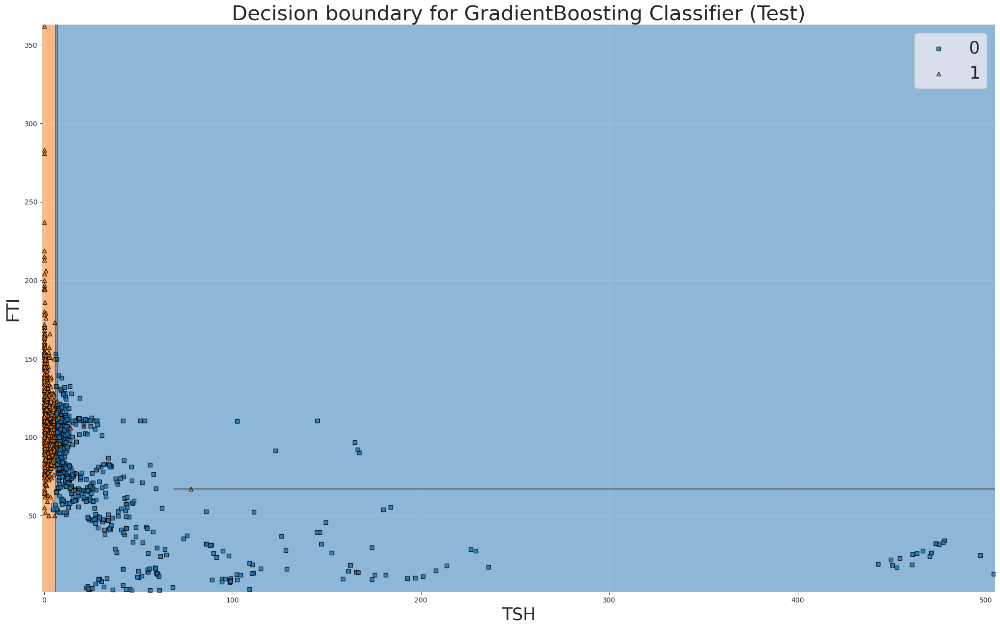

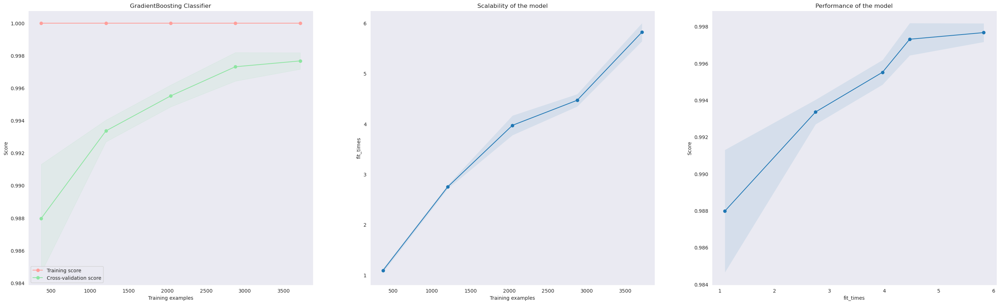

GradientBoosting Classifier
Standardization
accuracy:  0.9985642498205313
recall:  0.9985632183908046
precision:  0.9985632183908046
f1:  0.9985632183908046
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



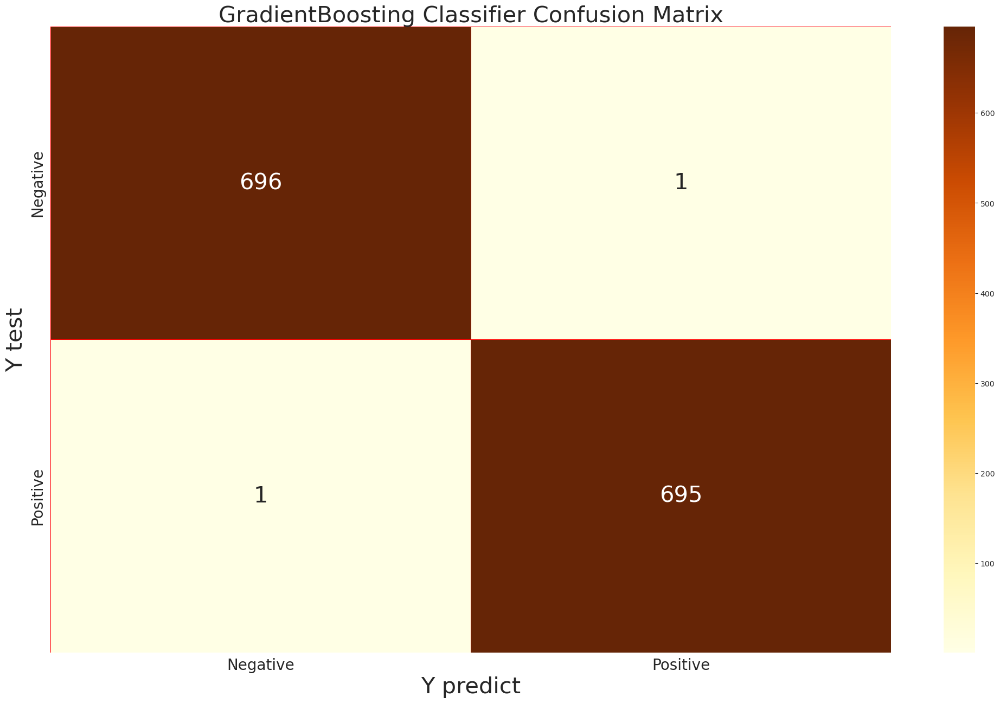

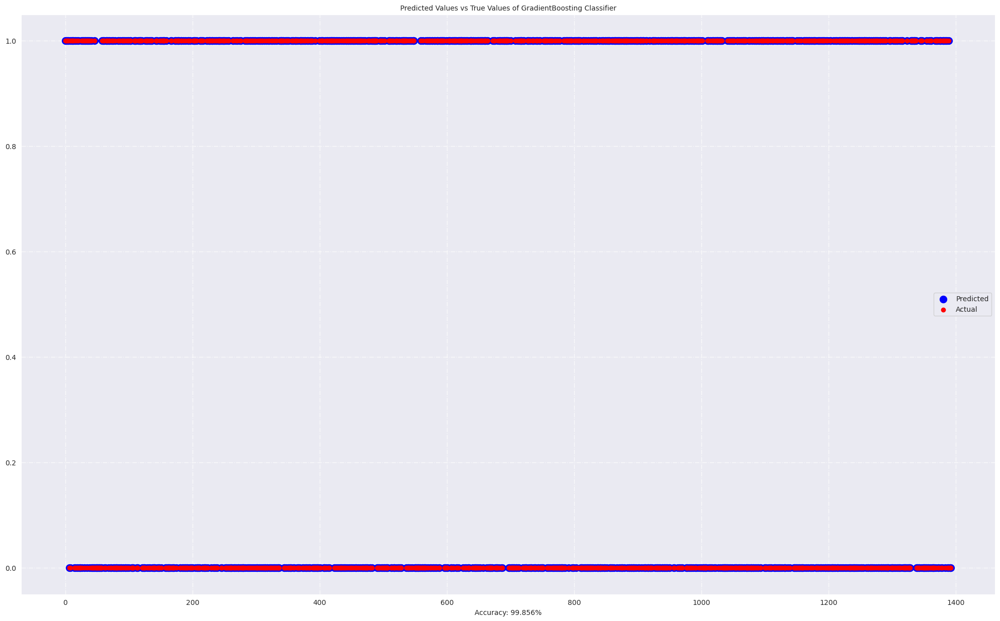

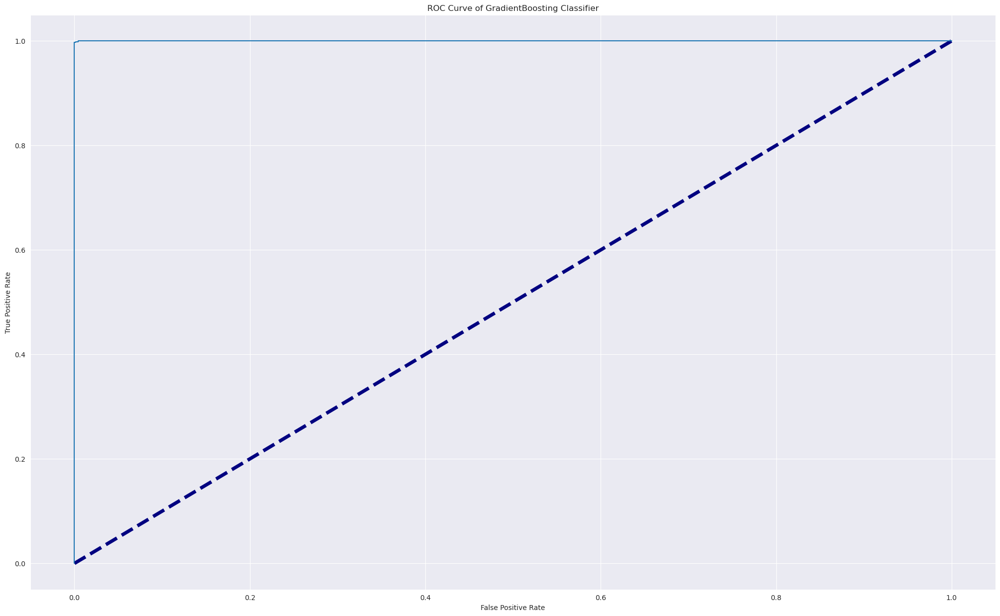

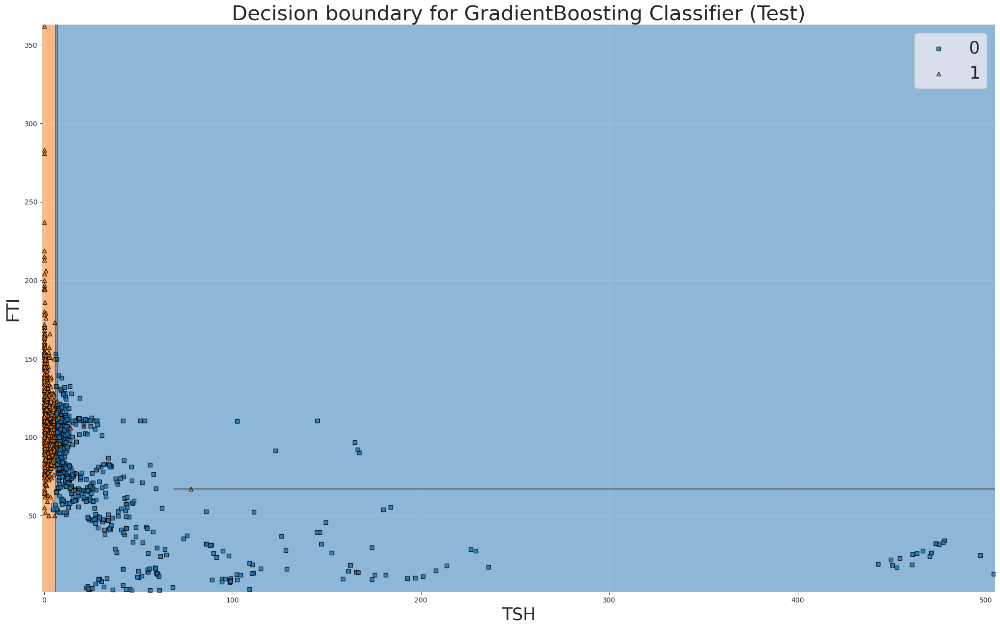

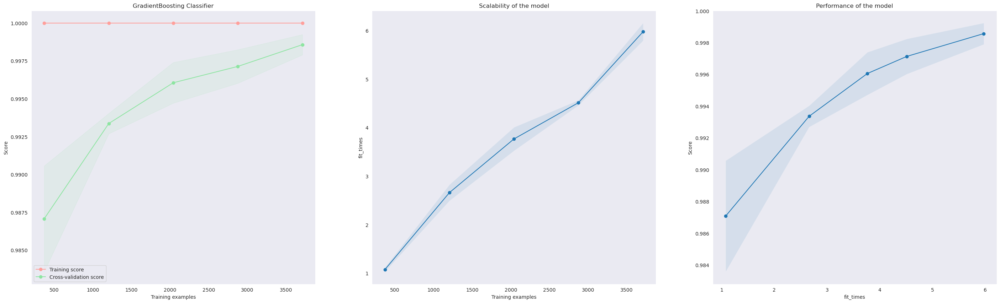

In [51]:
## Run Gradient Boosting (GB) classifier on three feature scaling:
gbt = GradientBoostingClassifier(n_estimators=200, max_depth=21, subsample=0.8, max_features=0.2, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('GradientBoosting Classifier', gbt, X_train, X_test, y_train, y_test, fc_name, proba=True)


XGBoost Classifier
Raw
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



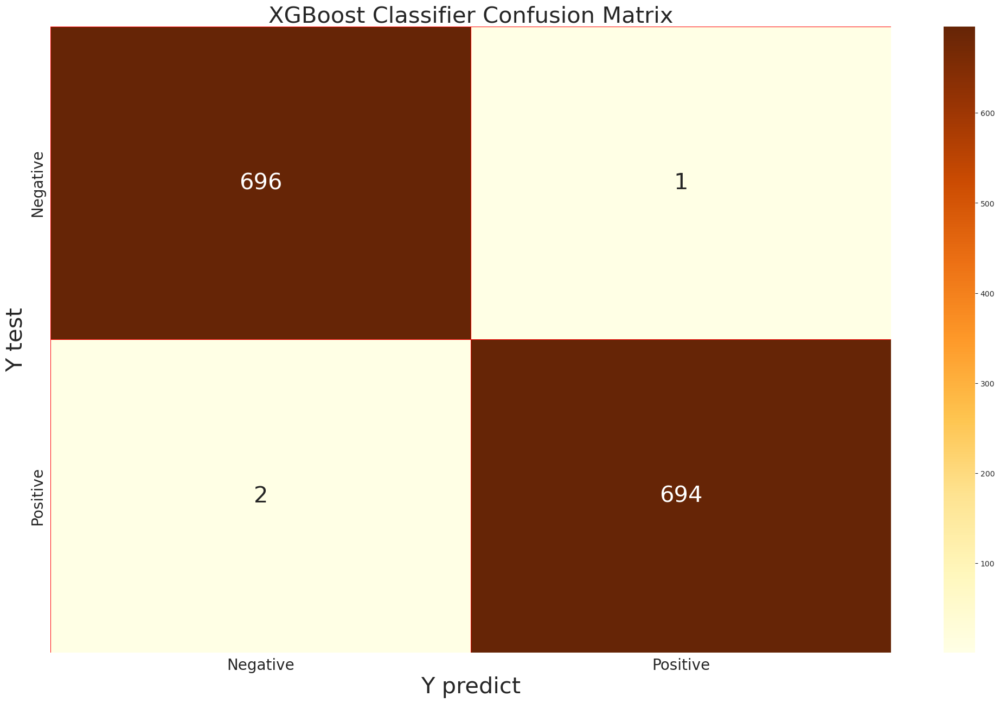

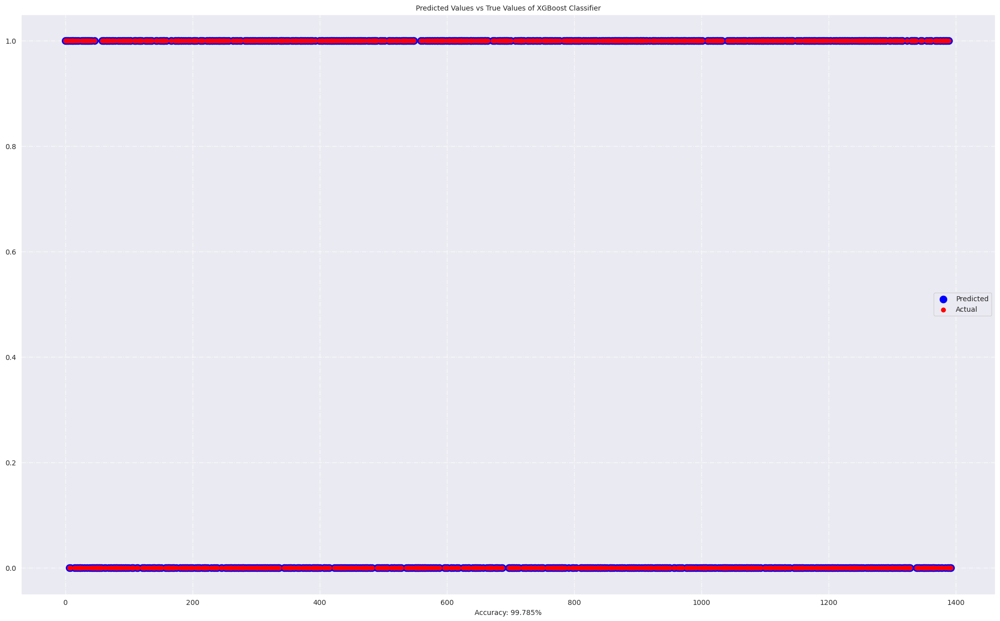

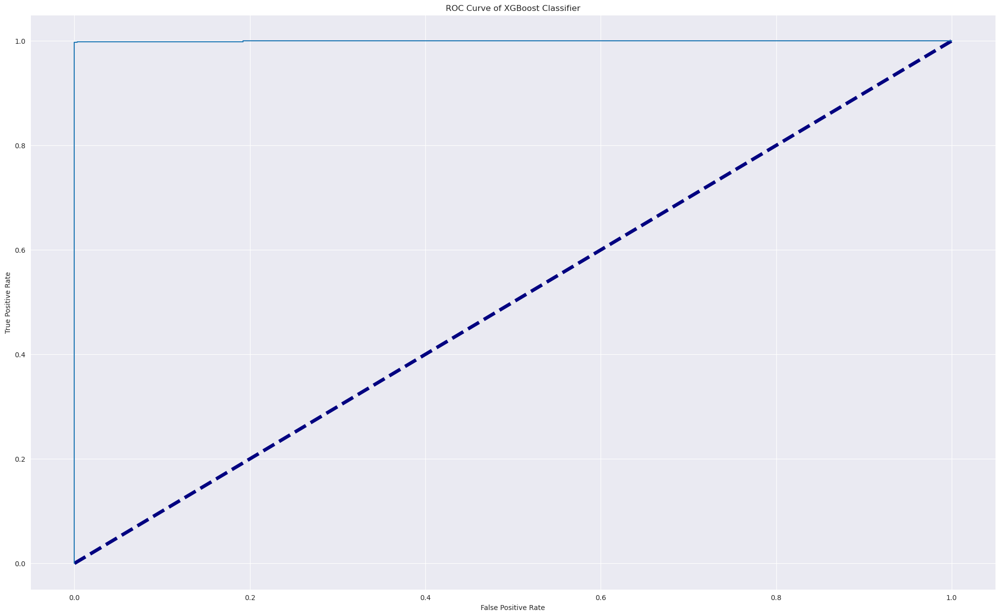

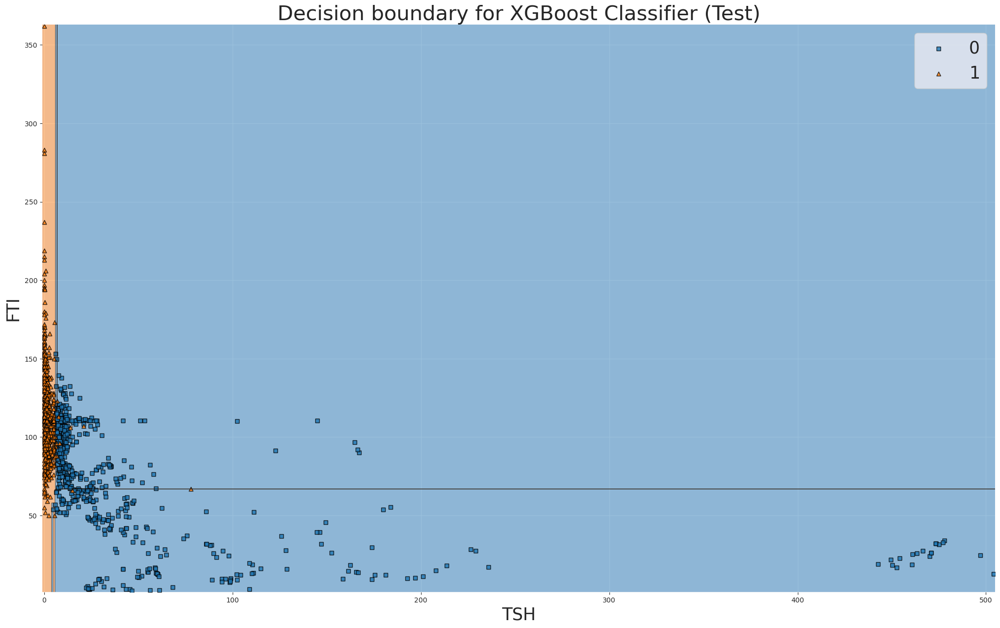

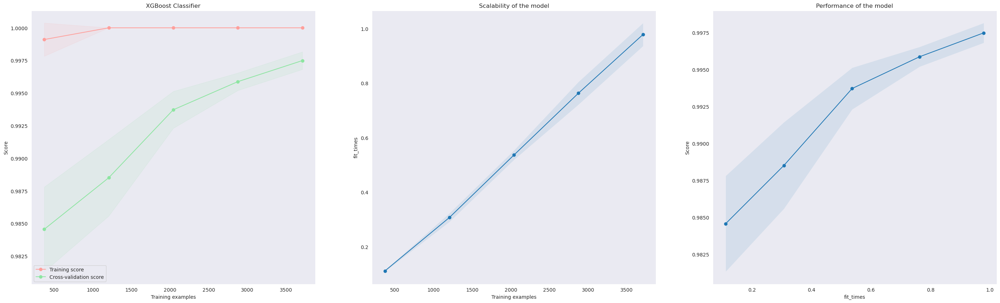

XGBoost Classifier
Normalization
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



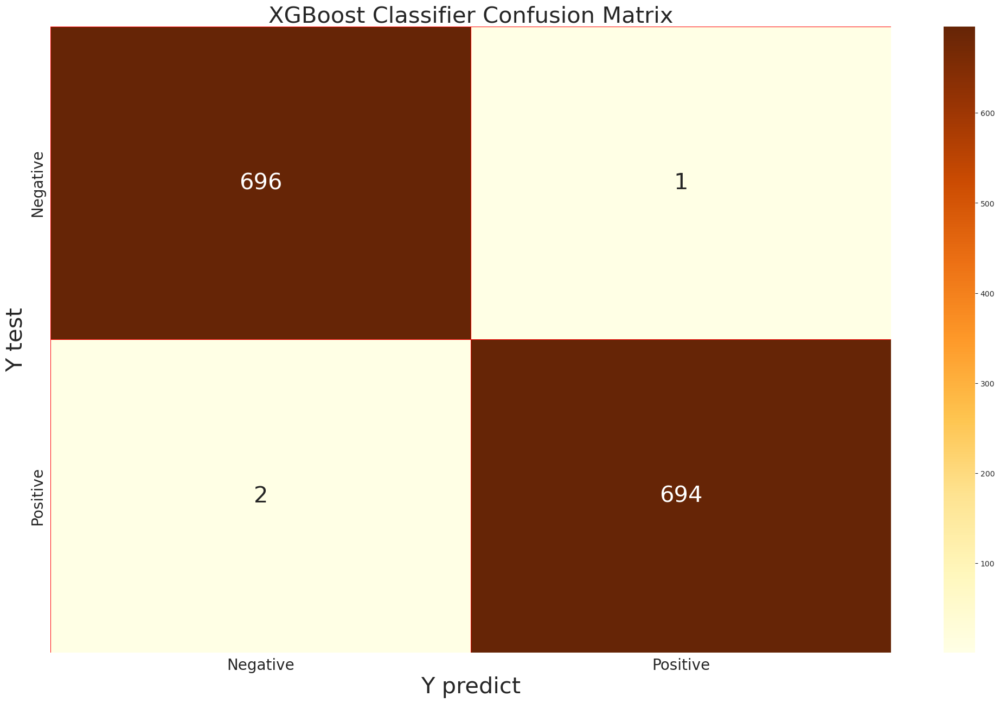

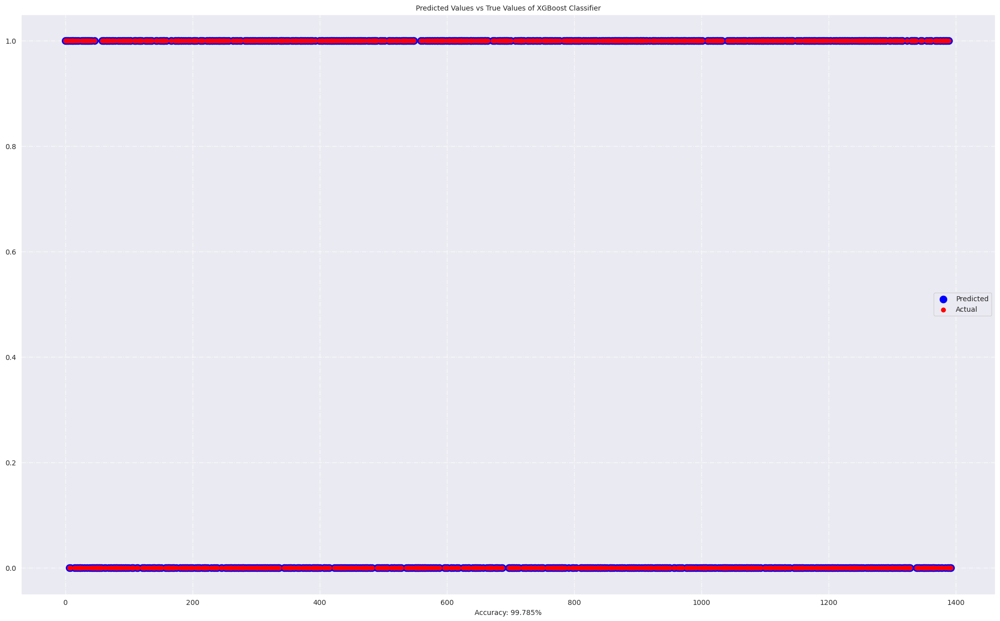

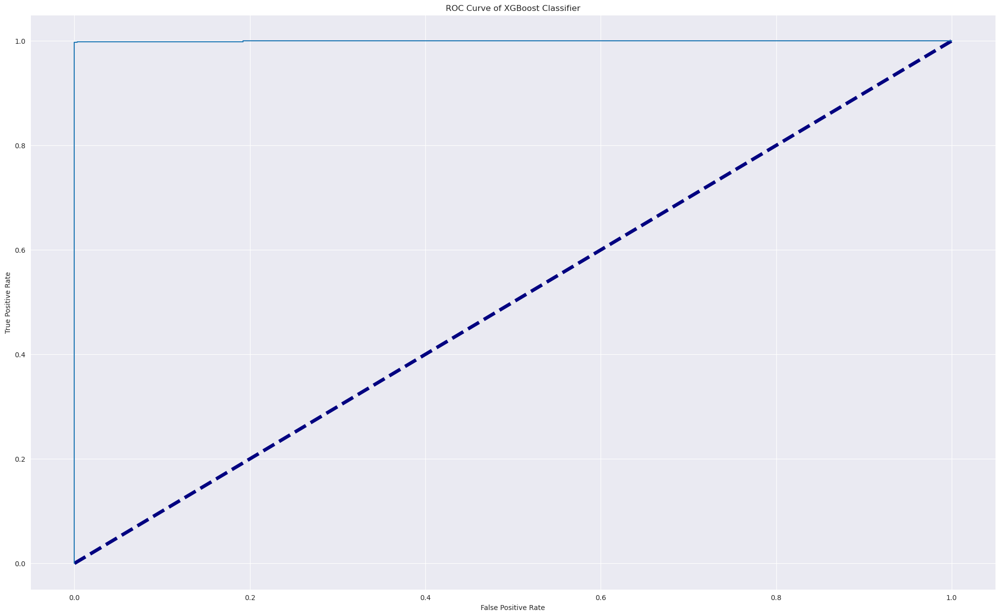

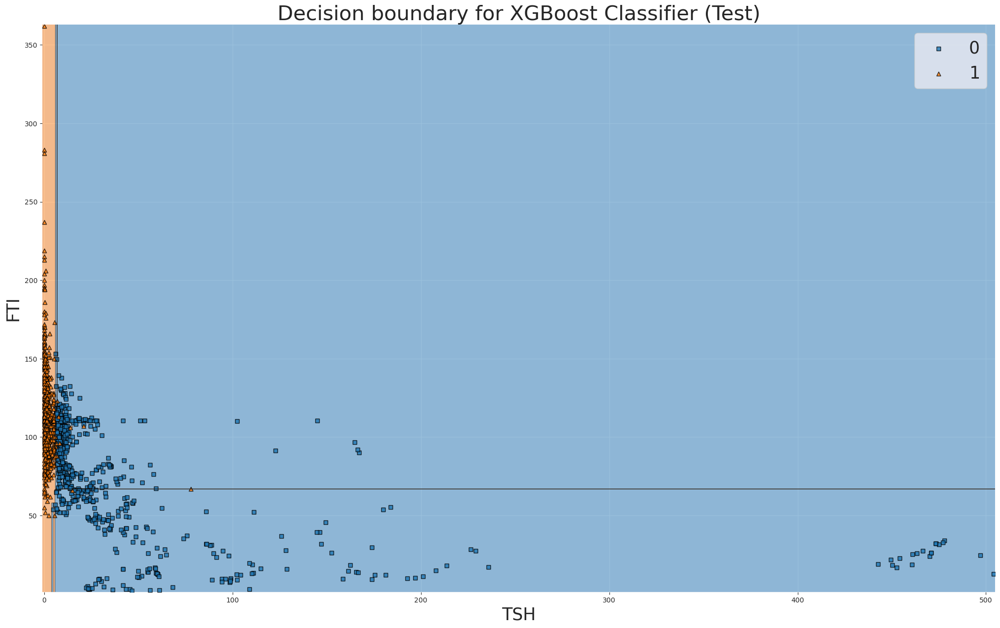

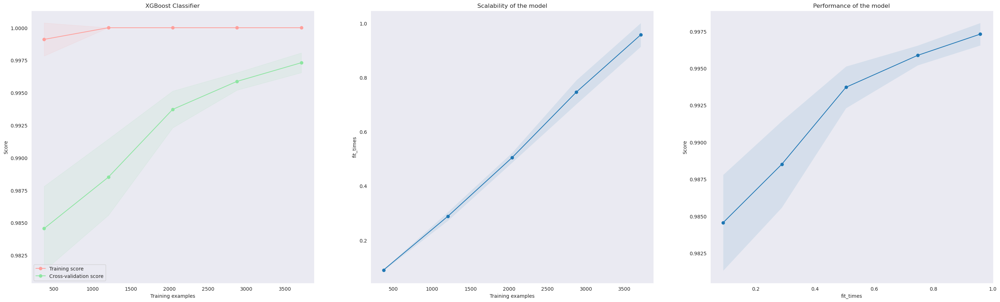

XGBoost Classifier
Standardization
accuracy:  0.9978463747307968
recall:  0.9971264367816092
precision:  0.9985611510791367
f1:  0.9978432782171099
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       697
           1       1.00      1.00      1.00       696

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



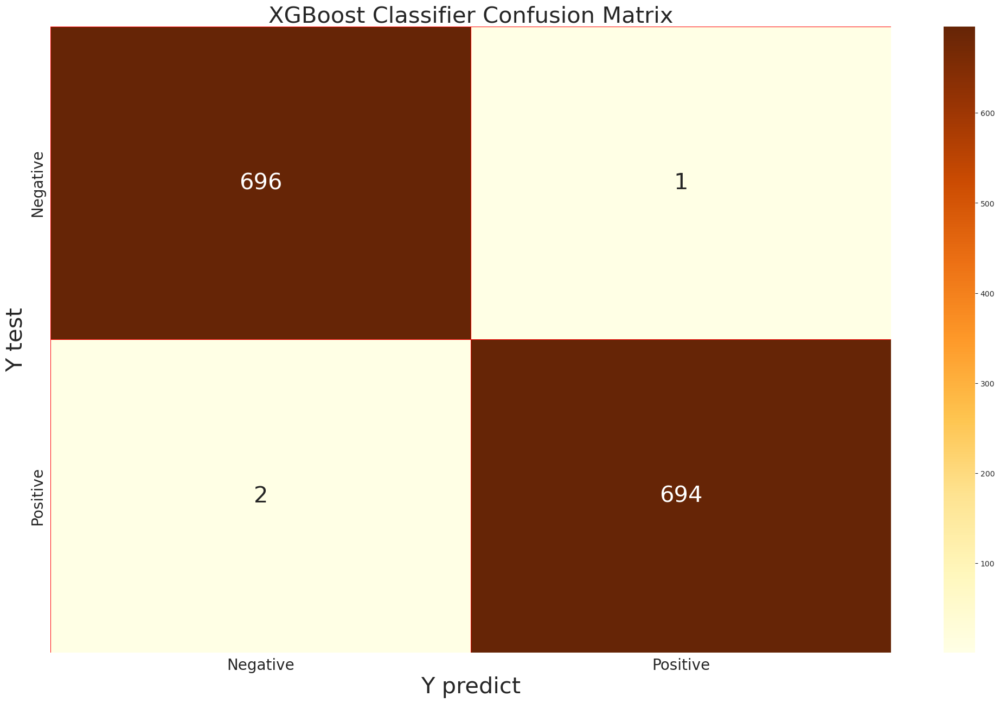

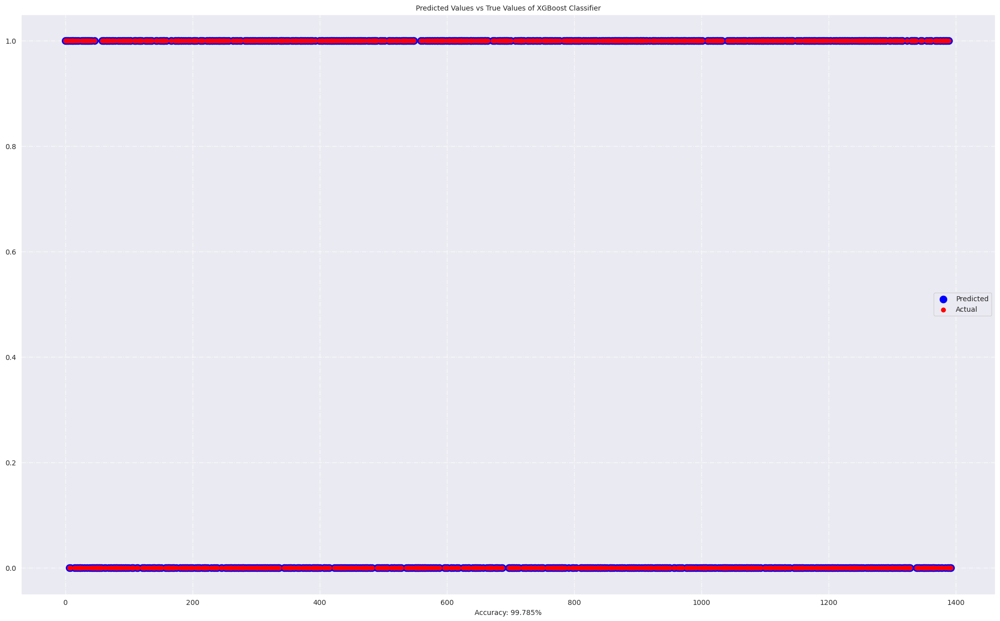

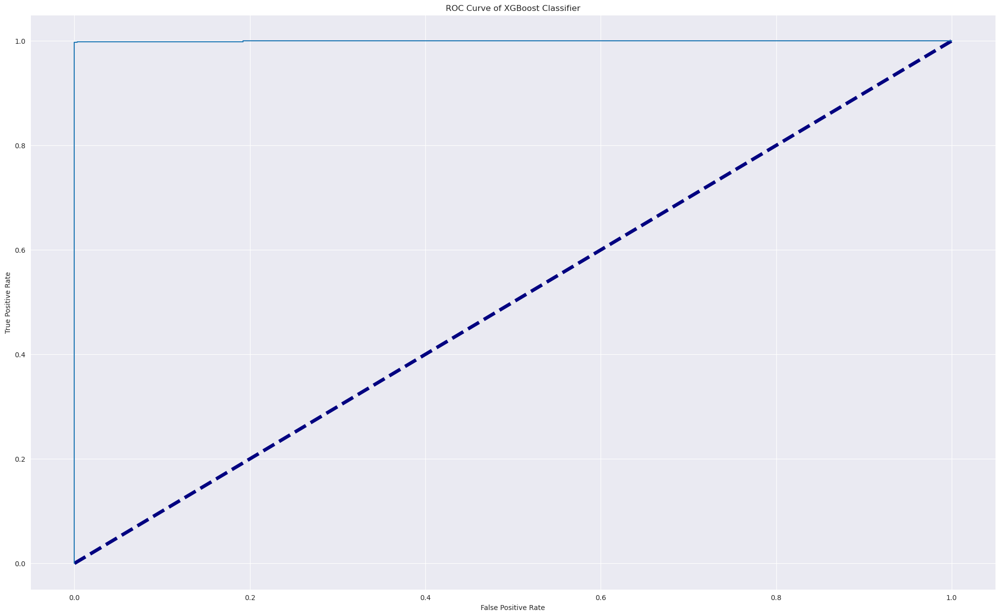

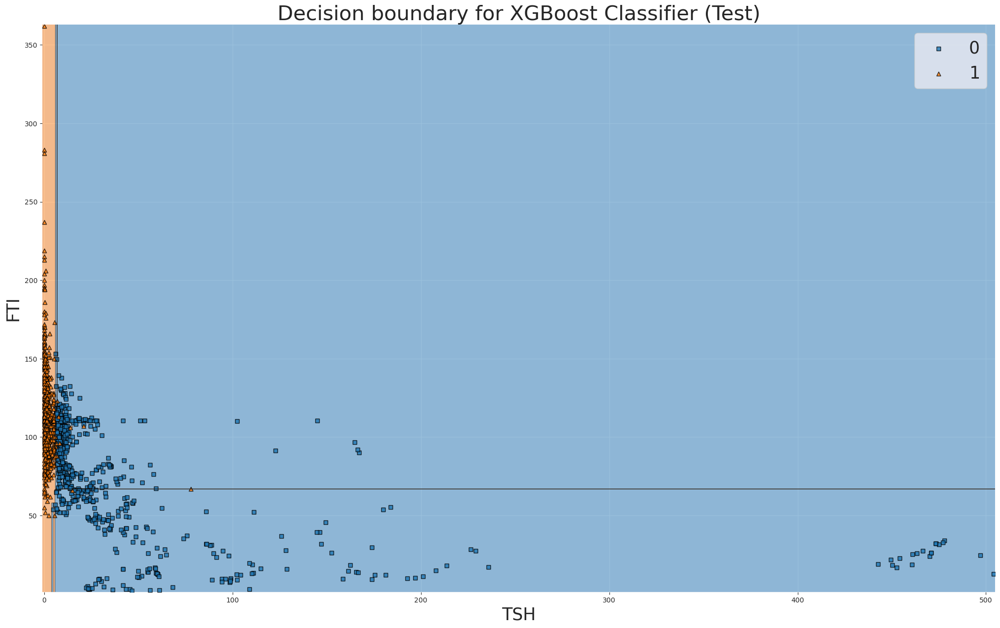

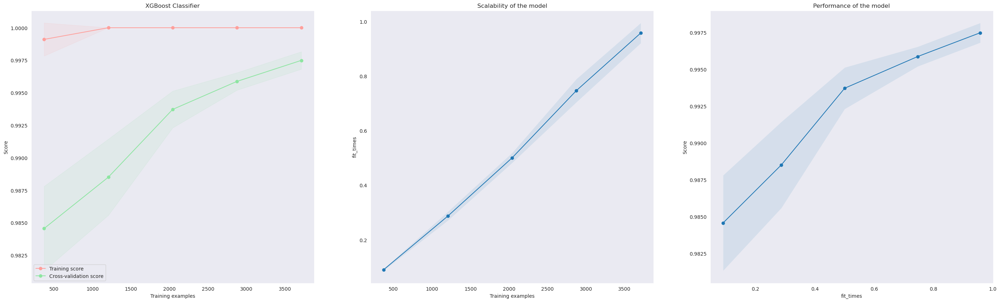

In [52]:
## Run XGBoost classifier on three feature scaling:
for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    xgb = XGBClassifier(n_estimators=200, max_depth=20, random_state=2021, use_label_encoder=False, eval_metric='mlogloss')
    run_model('XGBoost Classifier', xgb, X_train, X_test, y_train, y_test, fc_name, proba=True)

MLP Classifier
Raw
accuracy:  0.9928212491026561
recall:  0.985632183908046
precision:  1.0
f1:  0.9927641099855282
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       697
           1       1.00      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



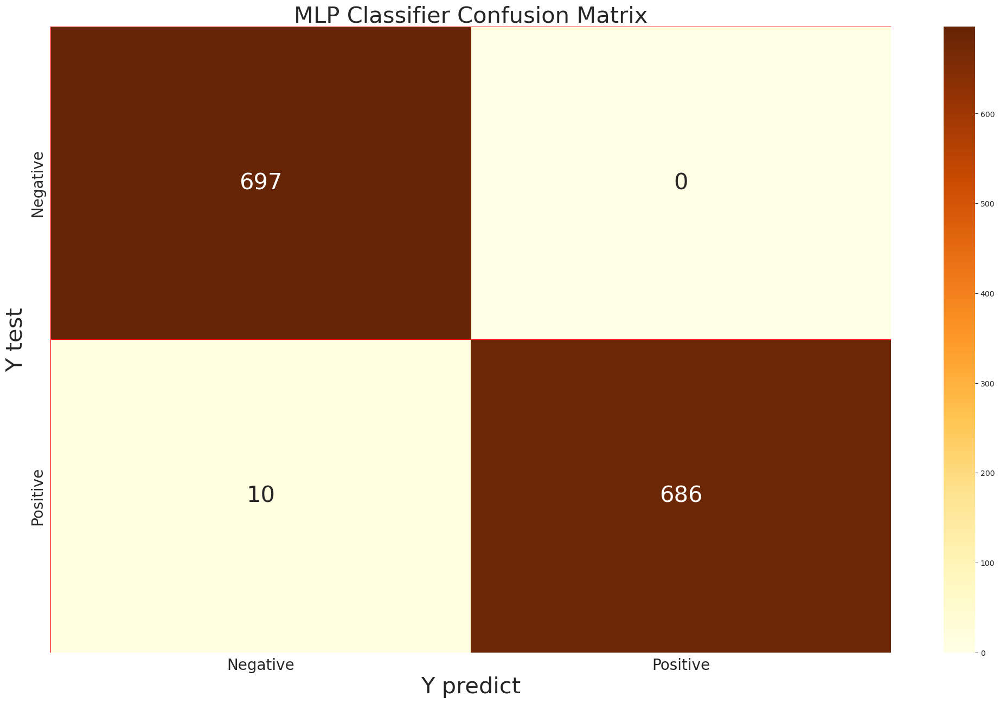

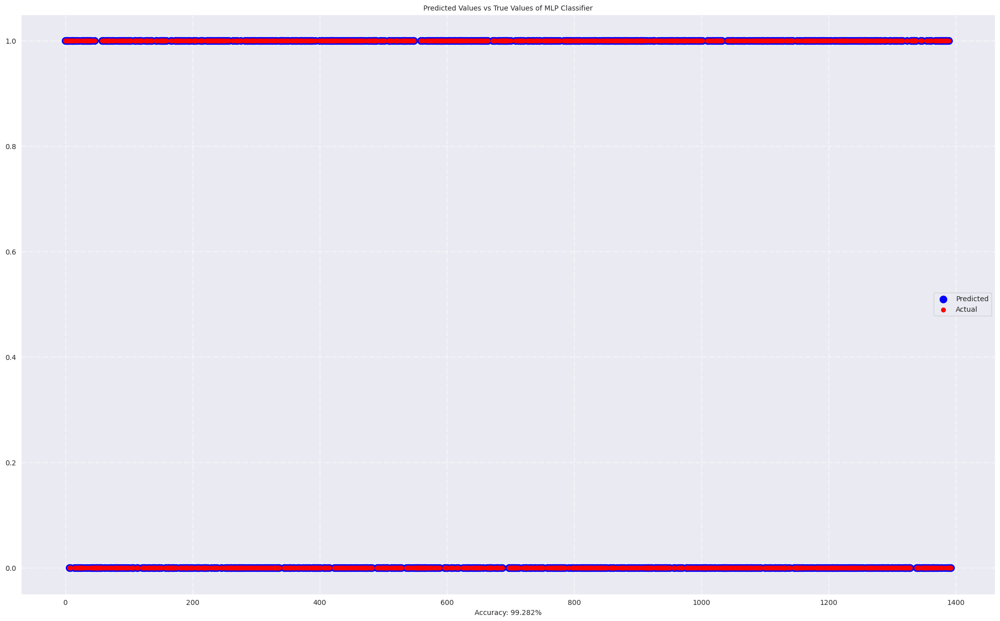

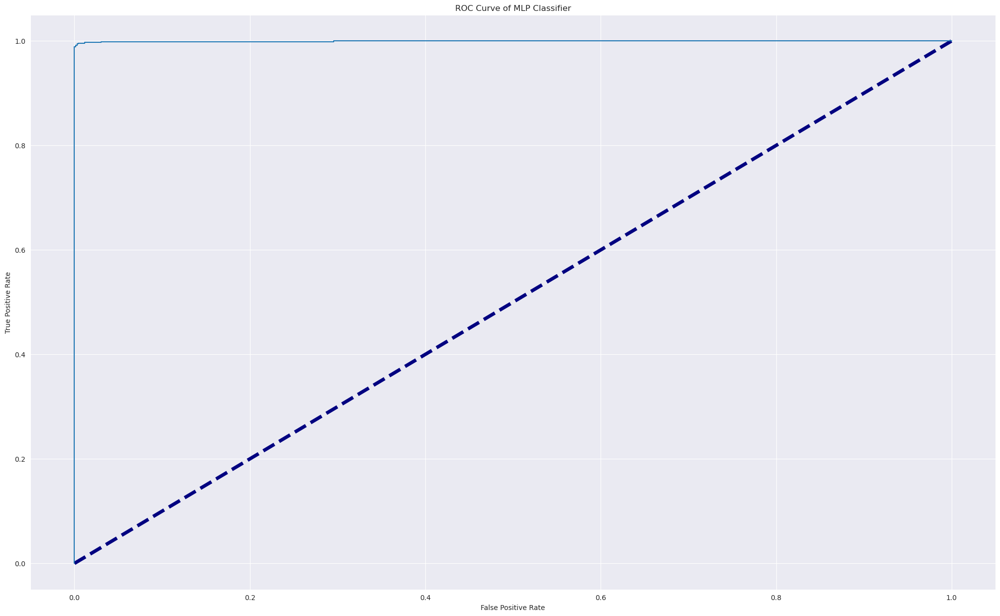

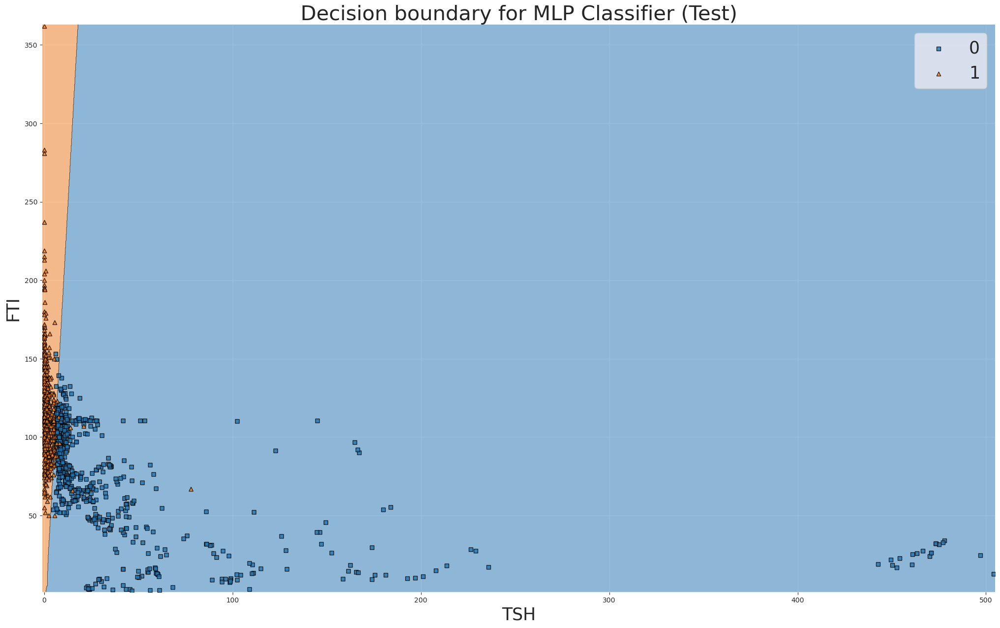

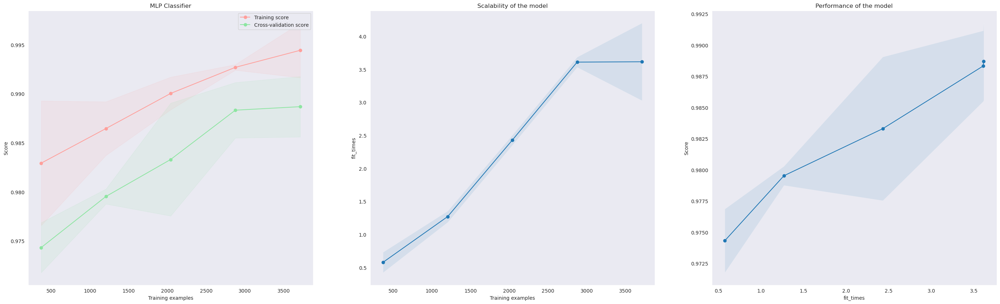

MLP Classifier
Normalization
accuracy:  0.9870782483847811
recall:  0.9885057471264368
precision:  0.9856733524355301
f1:  0.9870875179340028
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



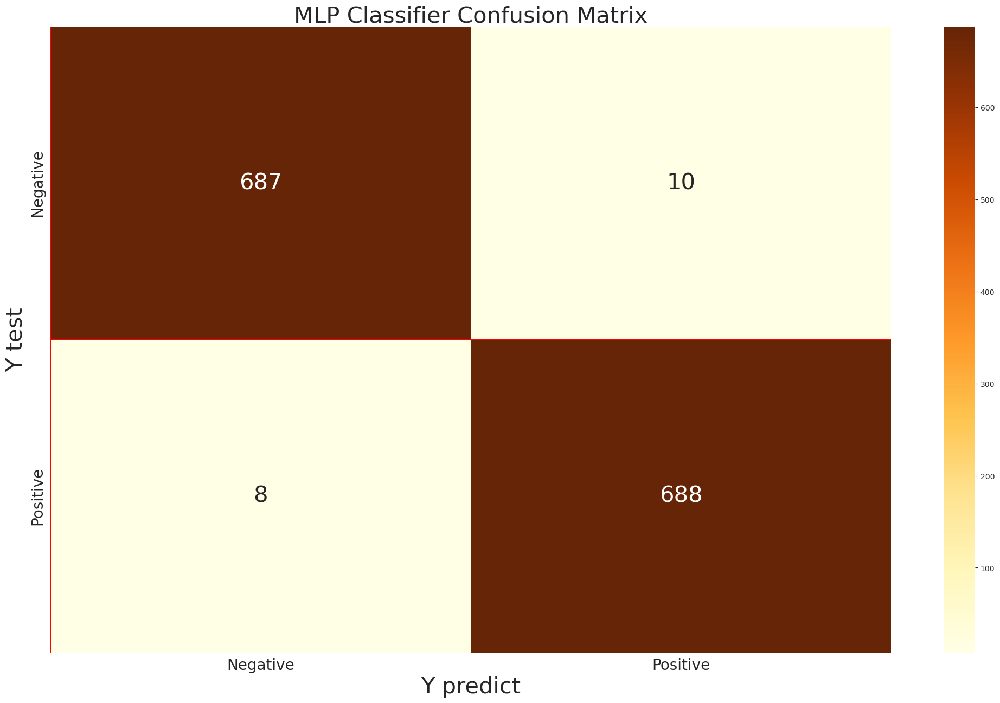

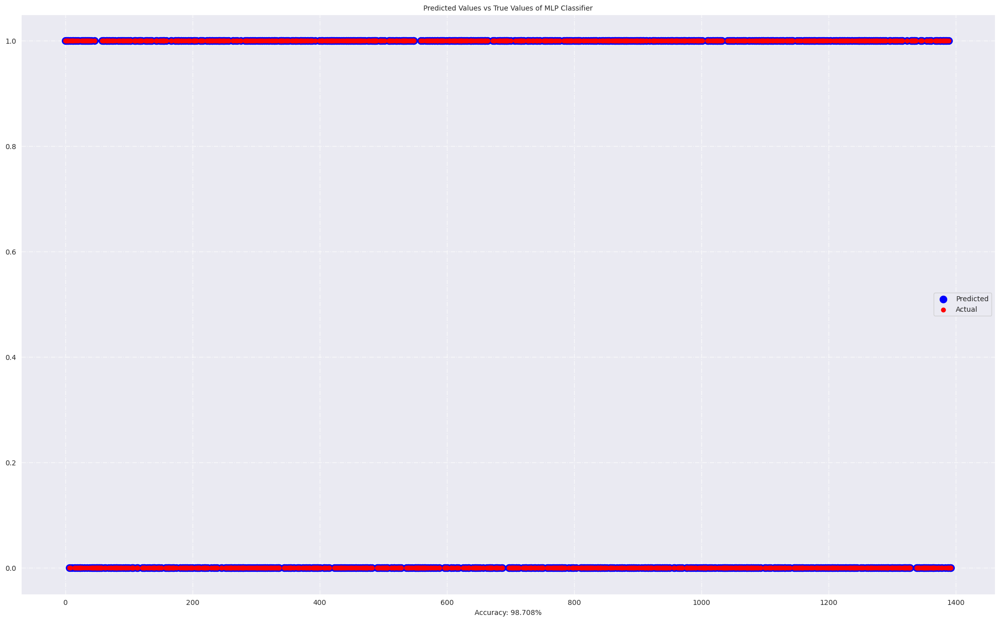

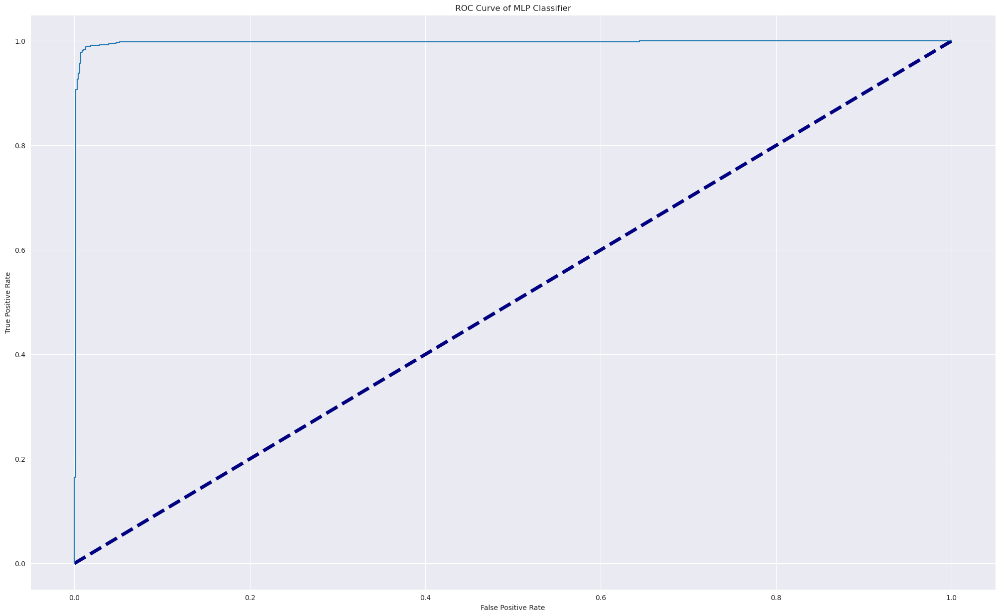

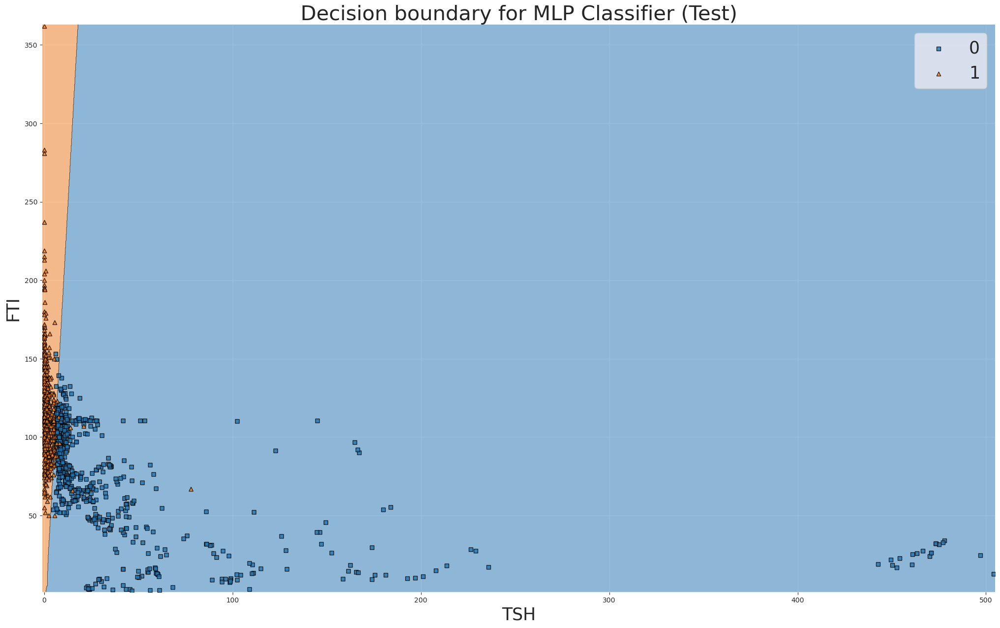

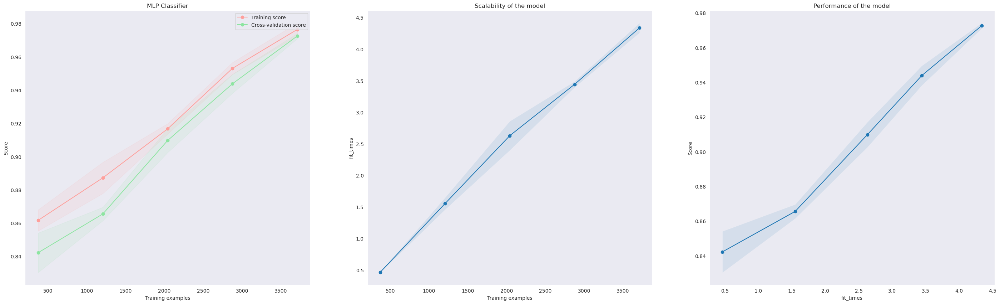

MLP Classifier
Standardization
accuracy:  0.990667623833453
recall:  0.9885057471264368
precision:  0.9927849927849928
f1:  0.9906407487401009
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



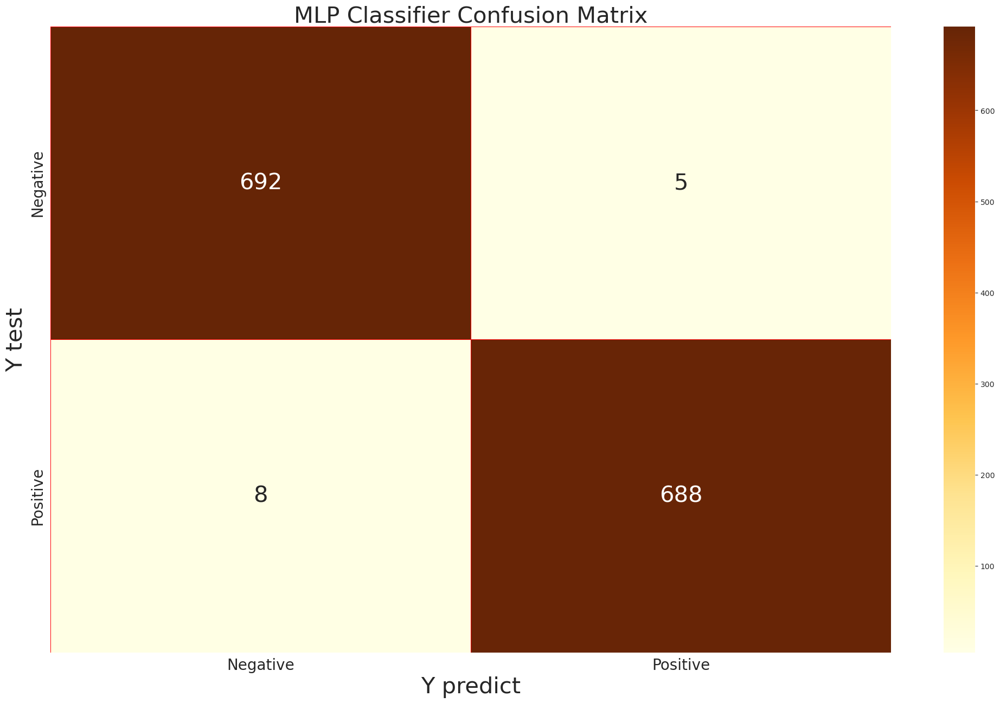

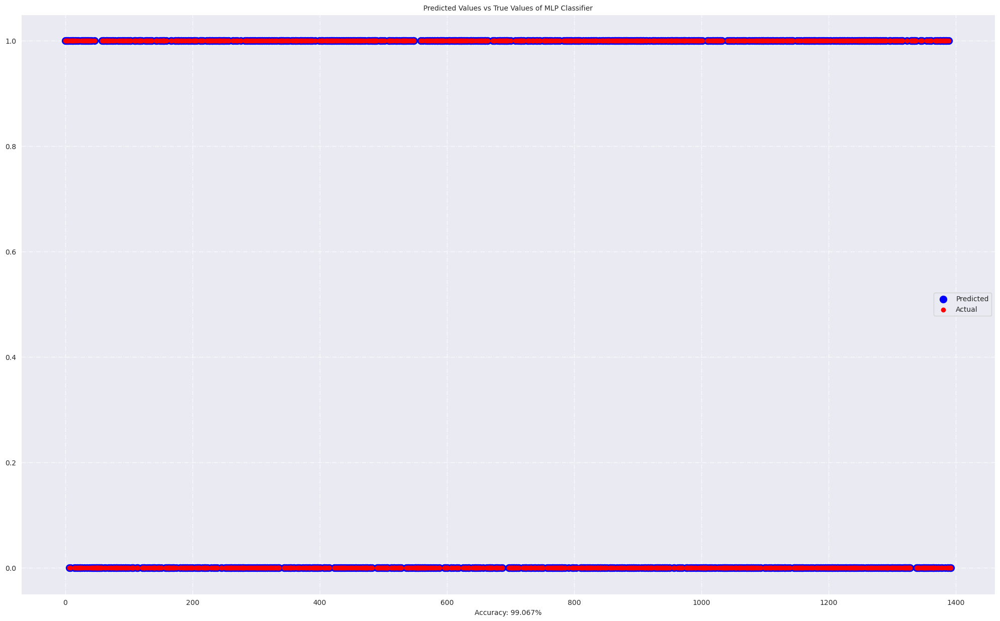

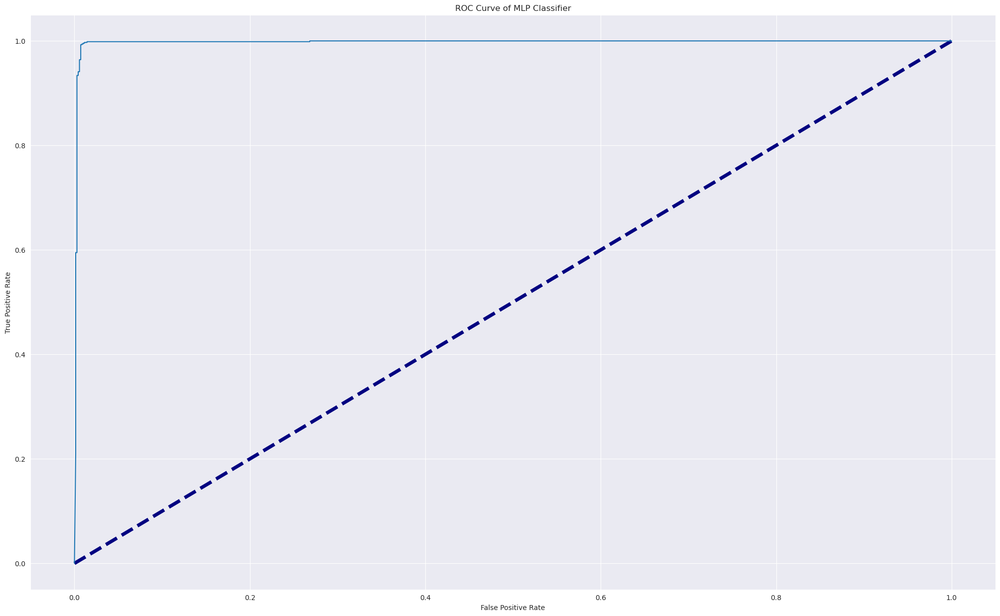

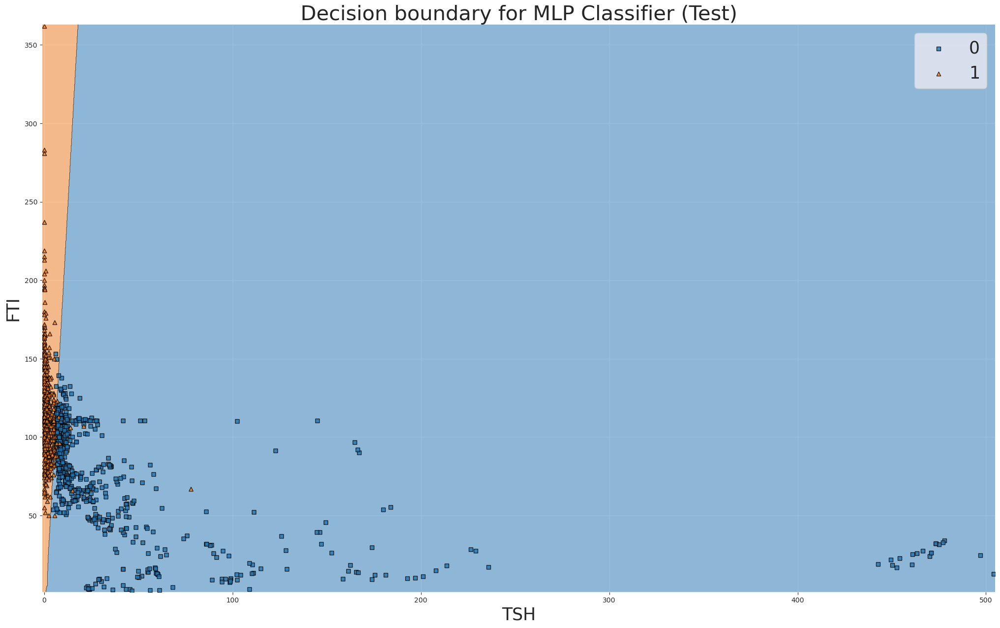

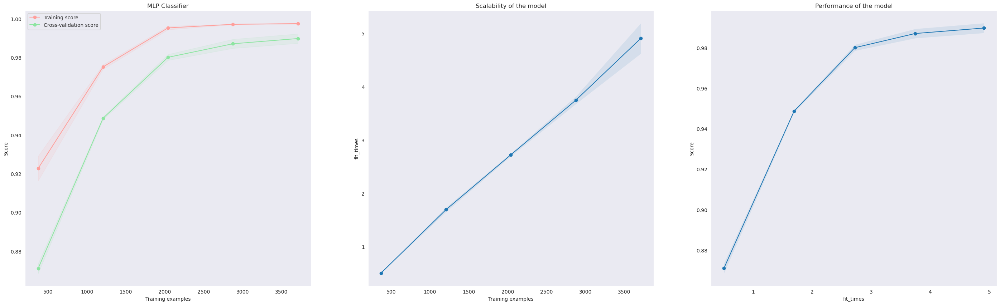

In [53]:
## Run MLP classifier on three feature scaling:
mlp = MLPClassifier(random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('MLP Classifier', mlp, X_train, X_test, y_train, y_test, fc_name, proba=True)

__________________________
**ANN**

In [54]:
import tensorflow as tf

MLP Classifier
Raw
accuracy:  0.9928212491026561
recall:  0.985632183908046
precision:  1.0
f1:  0.9927641099855282
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       697
           1       1.00      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



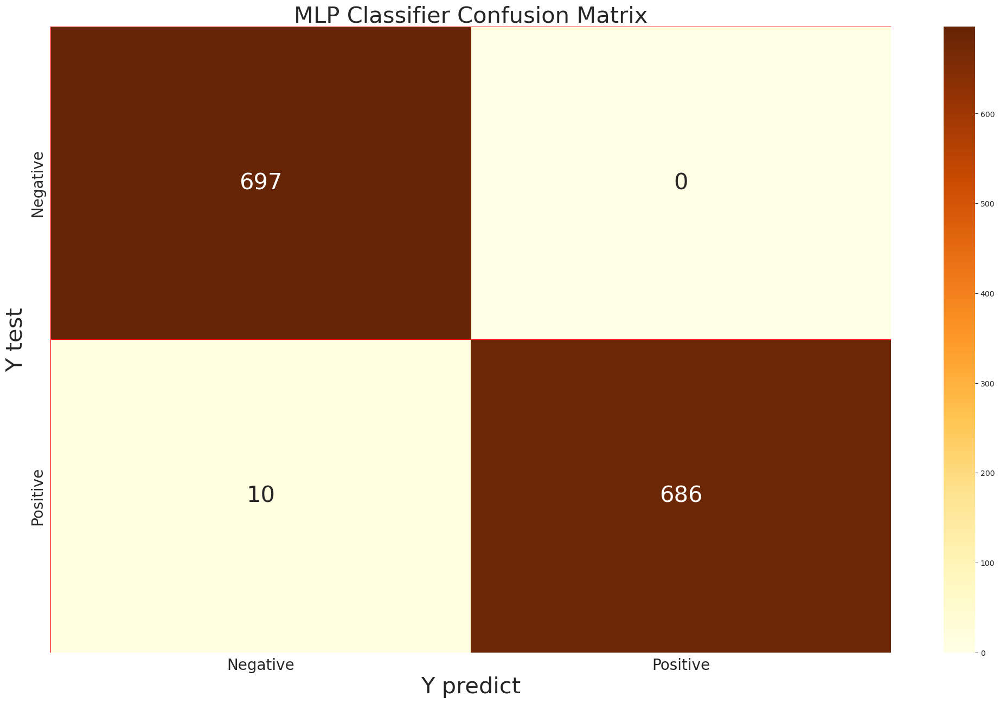

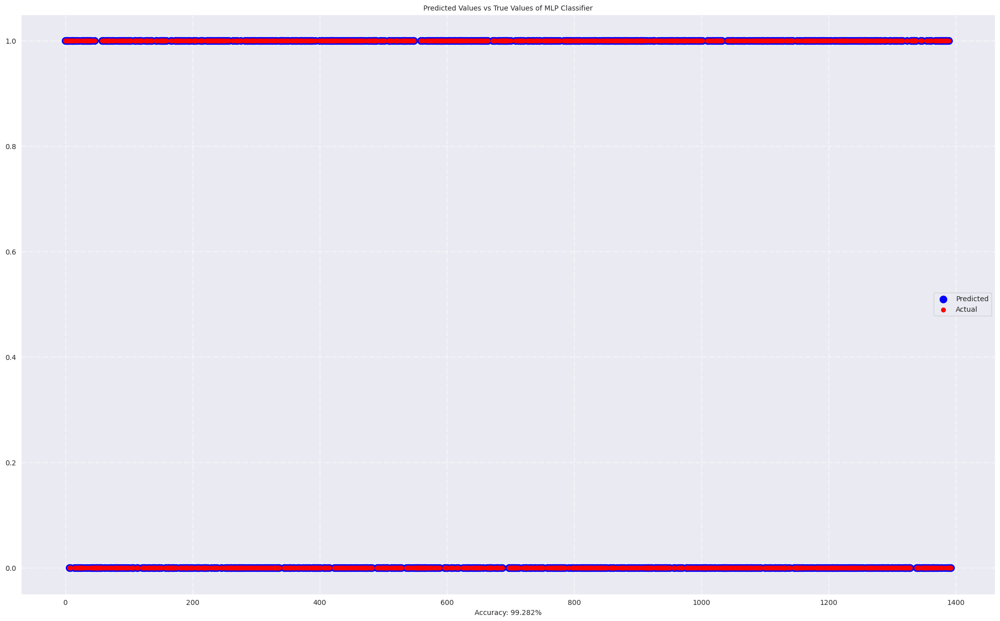

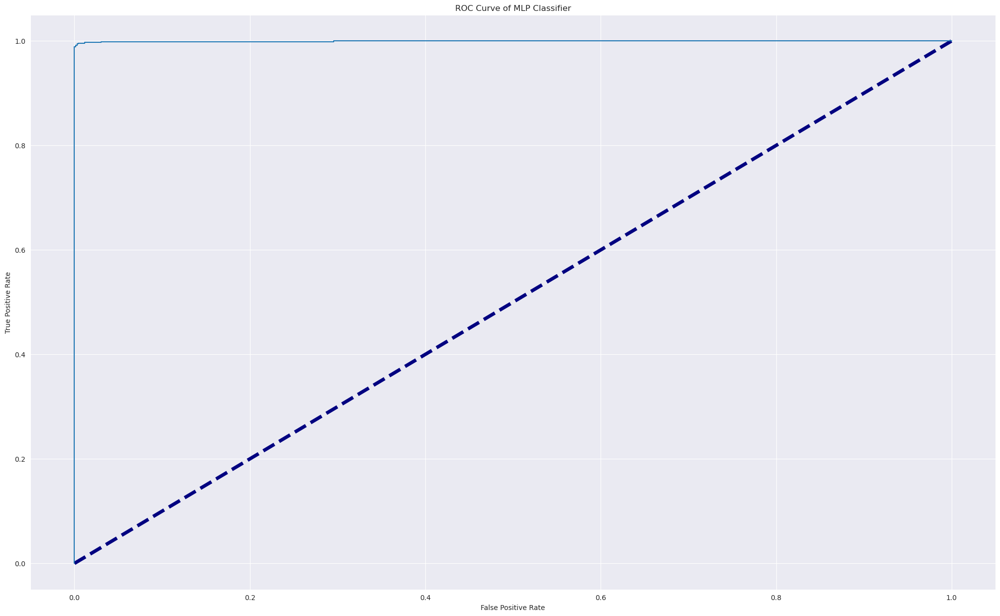

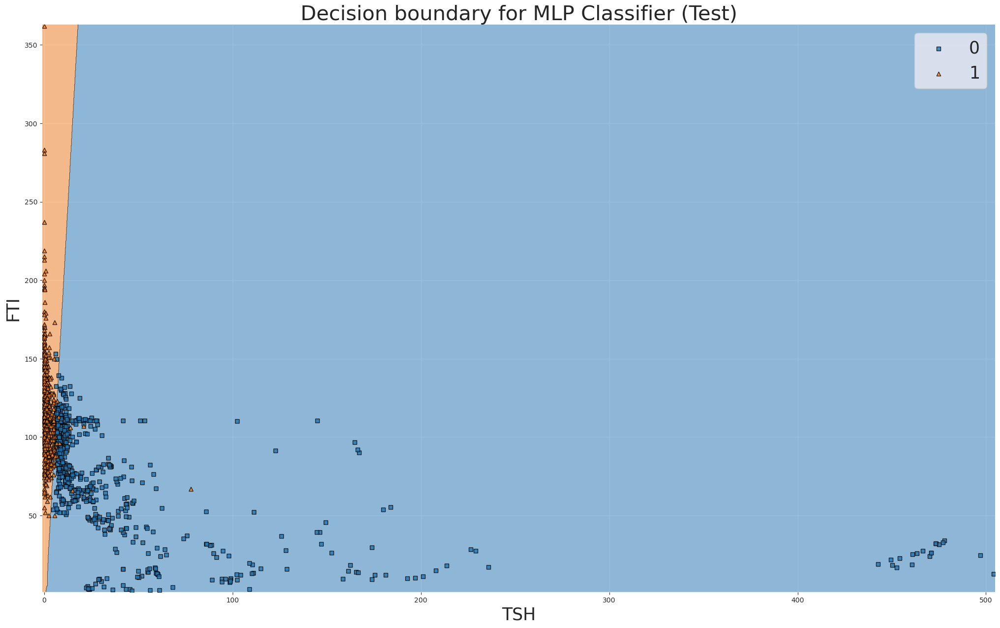

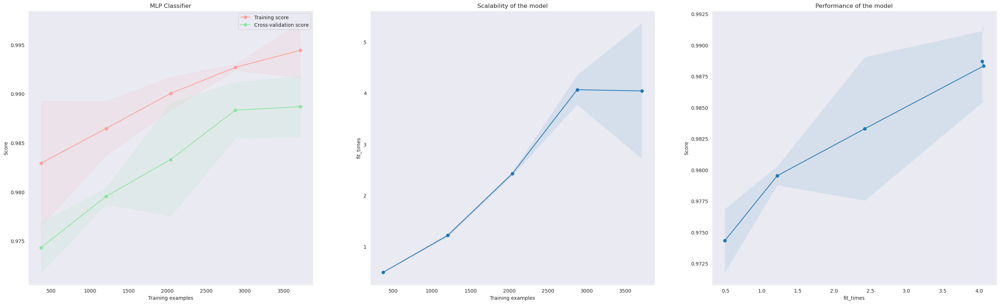

MLP Classifier
Normalization
accuracy:  0.9870782483847811
recall:  0.9885057471264368
precision:  0.9856733524355301
f1:  0.9870875179340028
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



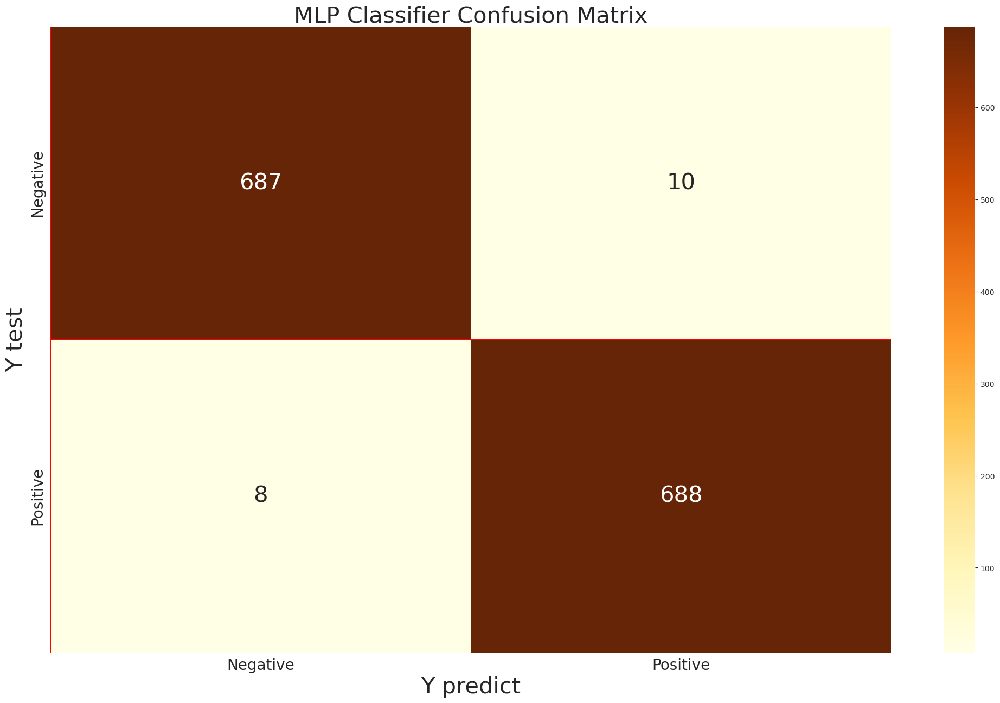

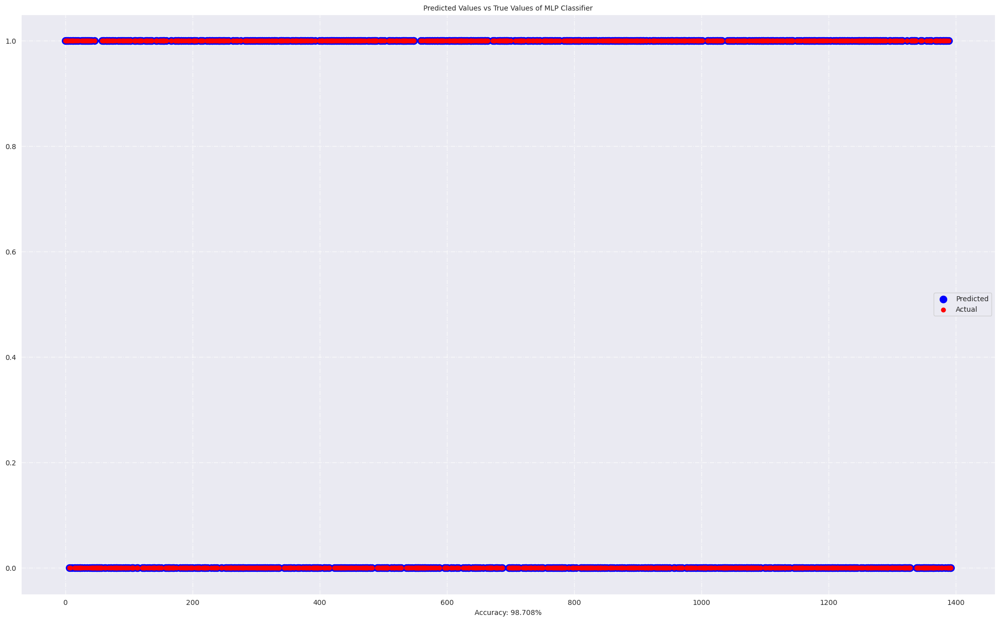

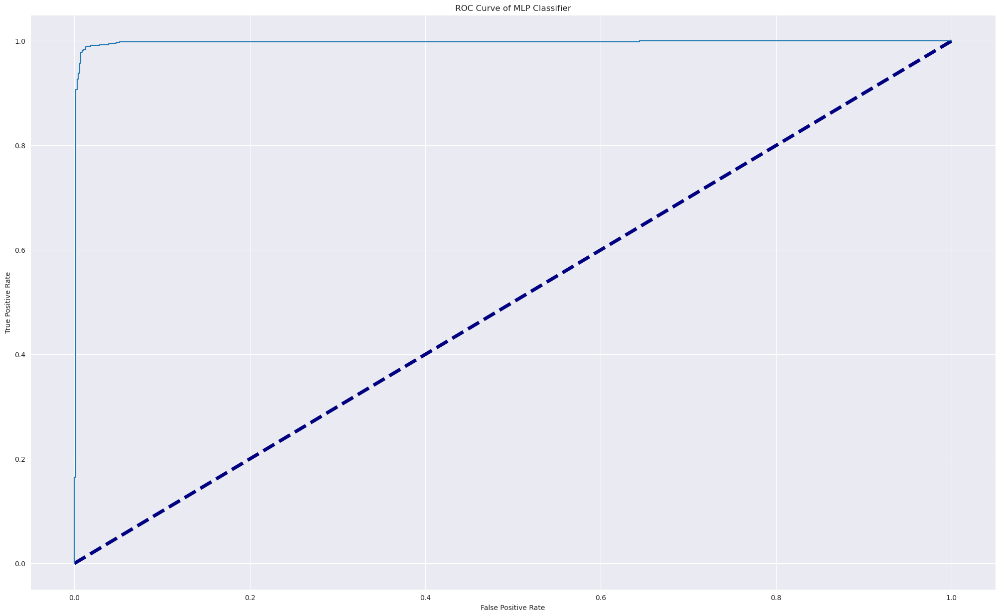

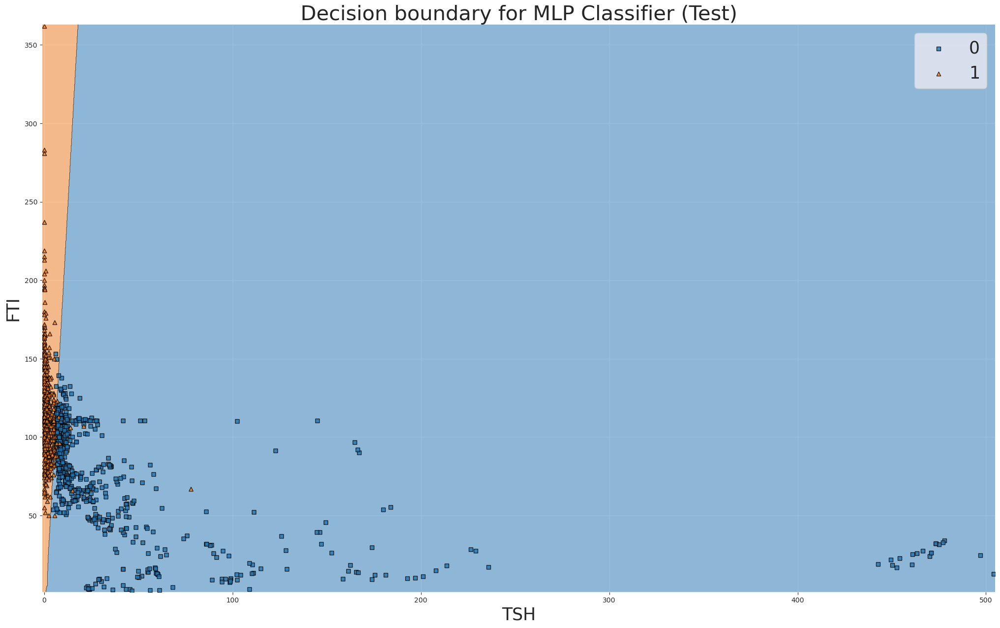

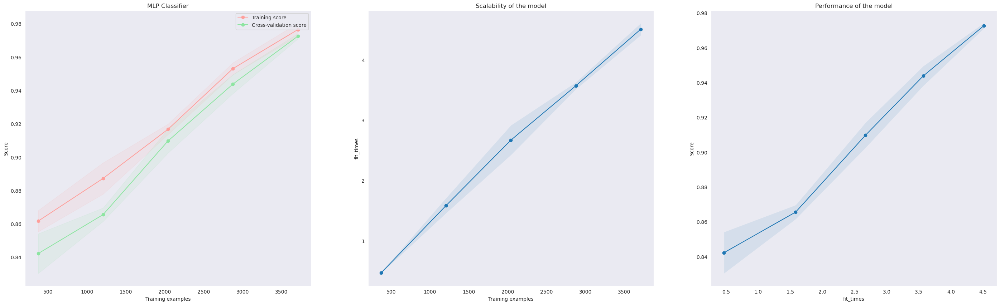

MLP Classifier
Standardization
accuracy:  0.990667623833453
recall:  0.9885057471264368
precision:  0.9927849927849928
f1:  0.9906407487401009
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



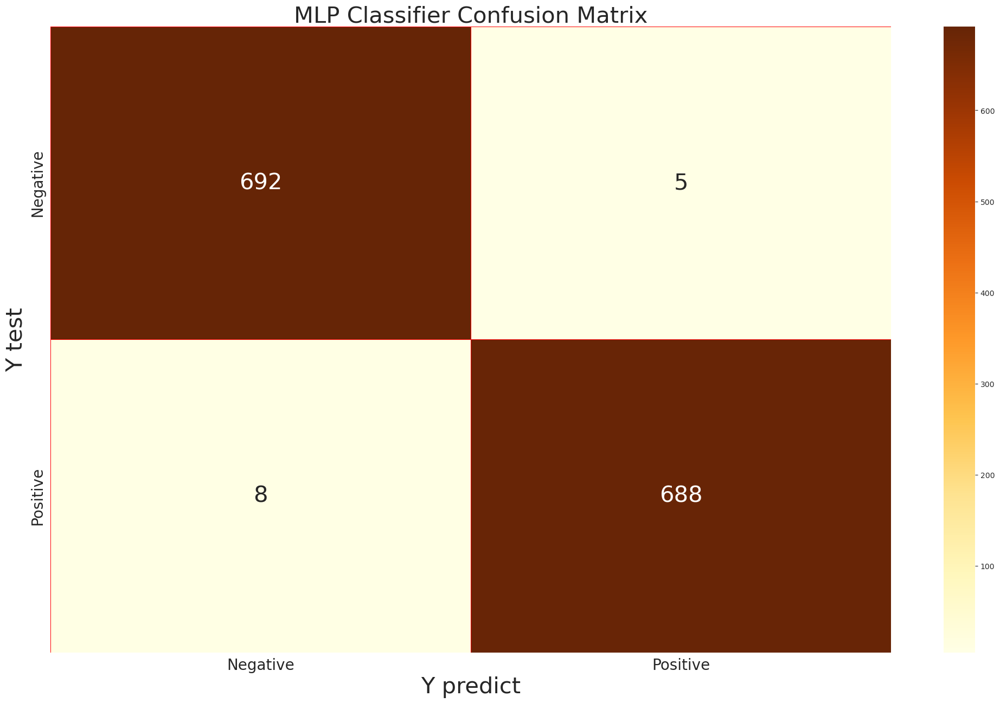

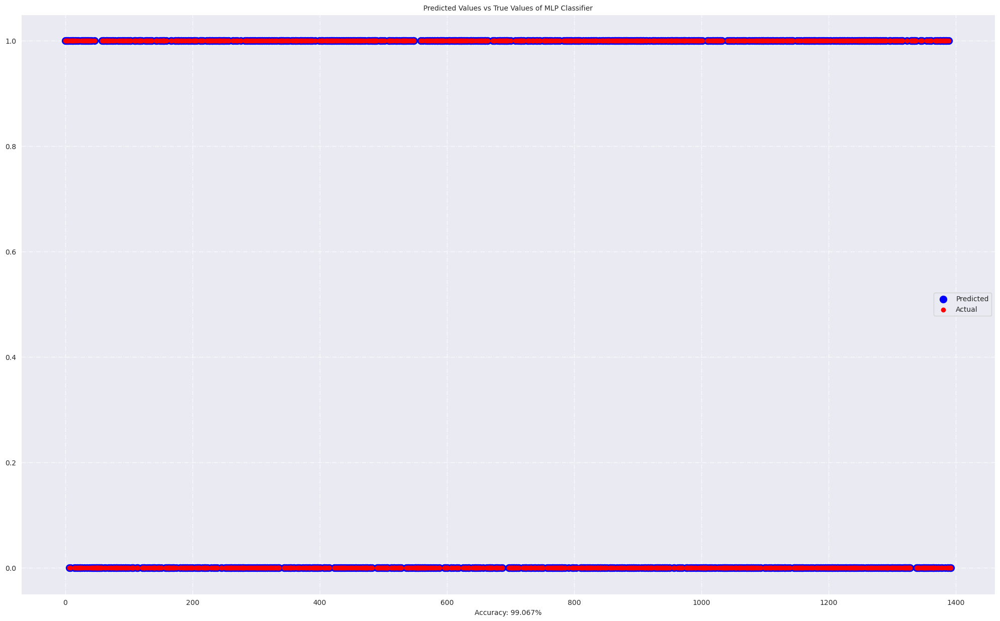

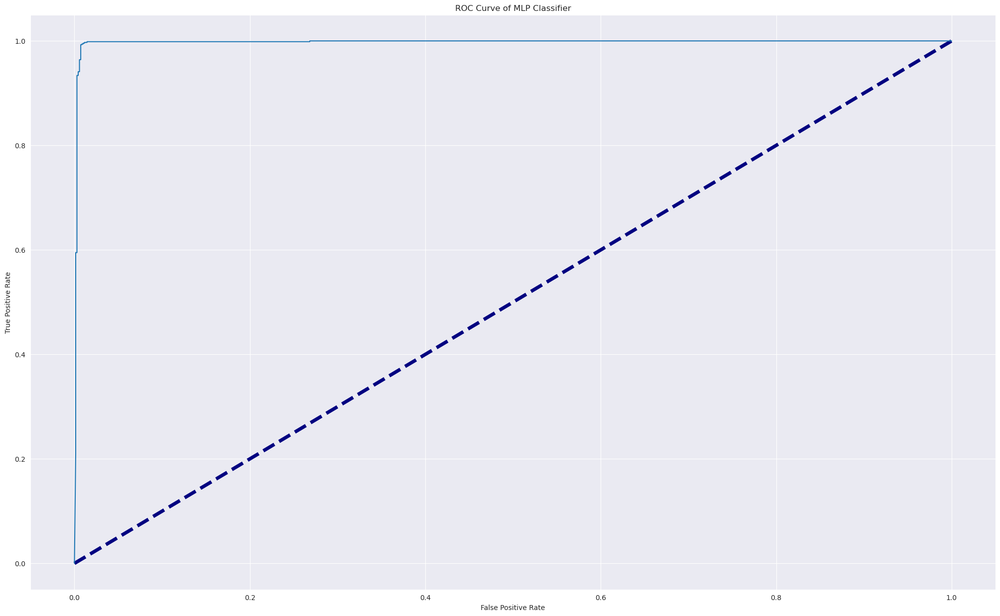

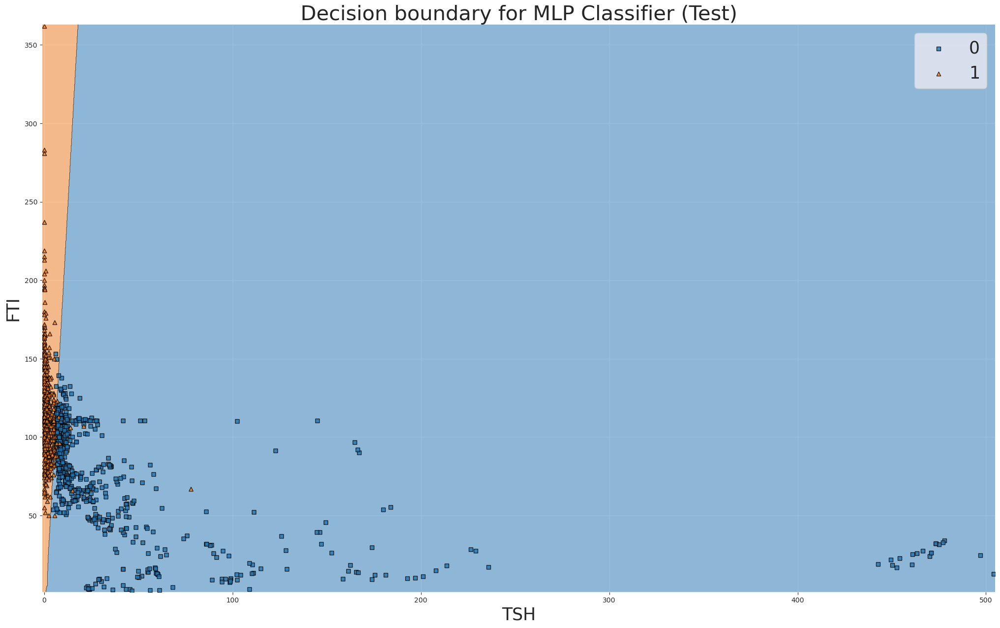

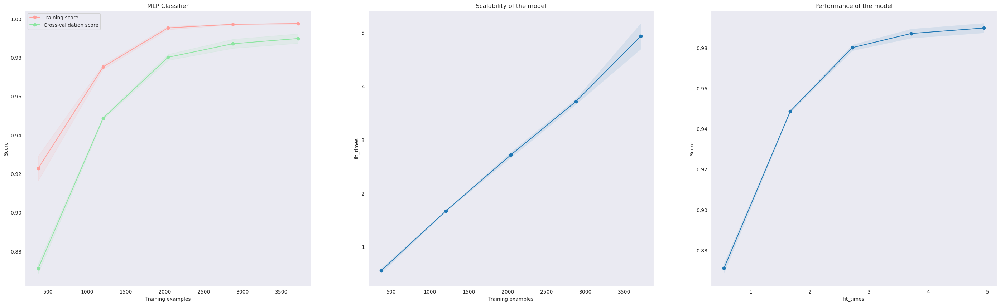

Epoch 1/100
70/70 [==============================] - 1s 6ms/step - loss: 0.6625 - accuracy: 0.7450 - val_loss: 0.6033 - val_accuracy: 0.8196
Epoch 2/100
70/70 [==============================] - 0s 3ms/step - loss: 0.5173 - accuracy: 0.8292 - val_loss: 0.4406 - val_accuracy: 0.8276
Epoch 3/100
70/70 [==============================] - 0s 3ms/step - loss: 0.4070 - accuracy: 0.8364 - val_loss: 0.3749 - val_accuracy: 0.8330
Epoch 4/100
70/70 [==============================] - 0s 3ms/step - loss: 0.3709 - accuracy: 0.8431 - val_loss: 0.3531 - val_accuracy: 0.8330
Epoch 5/100
70/70 [==============================] - 0s 3ms/step - loss: 0.3501 - accuracy: 0.8456 - val_loss: 0.3421 - val_accuracy: 0.8339
Epoch 6/100
70/70 [==============================] - 0s 3ms/step - loss: 0.3440 - accuracy: 0.8496 - val_loss: 0.3340 - val_accuracy: 0.8366
Epoch 7/100
70/70 [==============================] - 0s 3ms/step - loss: 0.3322 - accuracy: 0.8541 - val_loss: 0.3272 - val_accuracy: 0.8393
Epoch 8/100
7

In [57]:
mlp = MLPClassifier(random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    run_model('MLP Classifier', mlp, X_train, X_test, y_train, y_test, fc_name, proba=True)

# Hidden layer 1
ann = tf.keras.Sequential()
ann.add(tf.keras.layers.Dense(units=20, kernel_initializer='uniform', activation='relu'))
ann.add(tf.keras.layers.Dropout(0.5))

# Output layer
ann.add(tf.keras.layers.Dense(units=1, kernel_initializer='uniform', activation='sigmoid'))

# Compiles the ANN using ADAM optimizer
ann.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the summary for showing the structure and parameters
# print(ann.summary())

# Trains the ANN with 100 epochs
history = ann.fit(X_train, y_train, batch_size=64, validation_split=0.20, epochs=100, shuffle=True)

# Saves model
ann.save('thyroid_model.h5')

# Saves history into npy file
np.save('thyroid_history.npy', history.history)


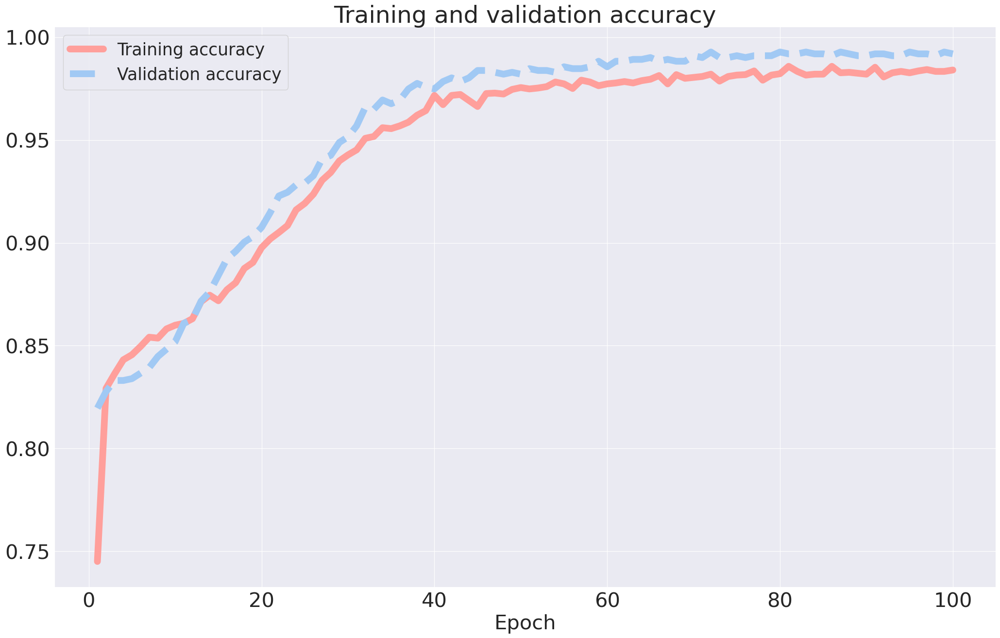

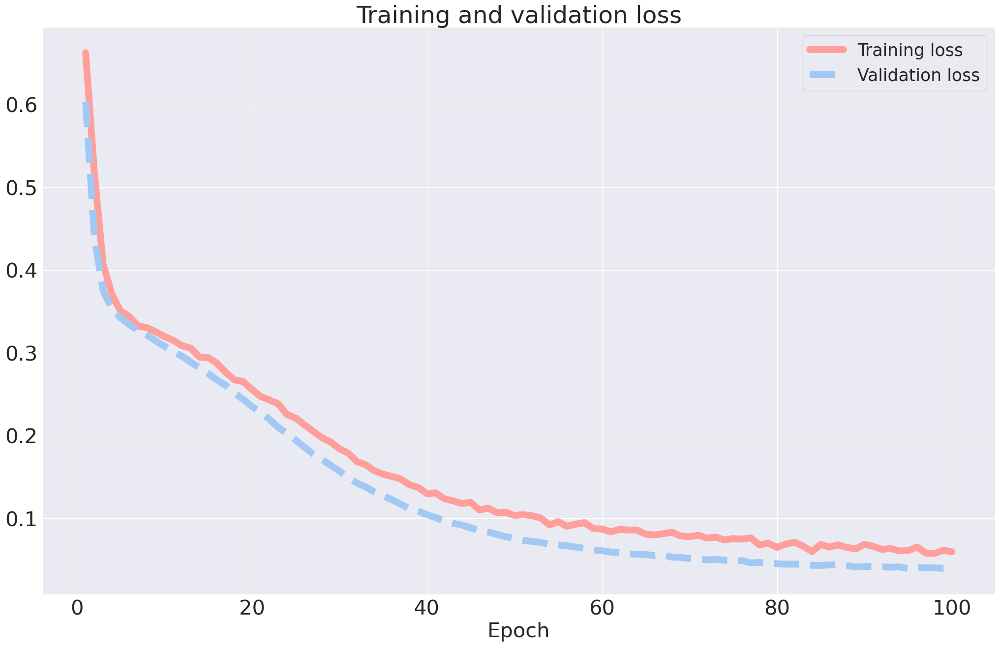

In [58]:
## Plot accuracy and loss versus epoch:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Accuracy
fig, ax = plt.subplots(figsize=(25, 15))
plt.plot(epochs, acc, 'r', label='Training accuracy', lw=10)
plt.plot(epochs, val_acc, 'b--', label='Validation accuracy', lw=10)
plt.title('Training and validation accuracy', fontsize=35)
plt.legend(fontsize=25)
ax.set_xlabel("Epoch", fontsize=30)
ax.tick_params(labelsize=30)
plt.show()

# Loss
fig, ax = plt.subplots(figsize=(25, 15))
plt.plot(epochs, loss, 'r', label='Training loss', lw=10)
plt.plot(epochs, val_loss, 'b--', label='Validation loss', lw=10)
plt.title('Training and validation loss', fontsize=35)
plt.legend(fontsize=25)
ax.set_xlabel("Epoch", fontsize=30)
ax.tick_params(labelsize=30)
plt.show()

In [59]:
## Predict result using test data: Sets the threshold for the predictions. In this case, the threshold is 0.5 (this value can be modified).
# Prediction on test set
y_pred = ann.predict(X_test)
y_pred = [int(p >= 0.5) for p in y_pred]
print(y_pred)

44/44 [==============================] - 0s 1ms/step
[1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0

In [60]:
## Performance Evaluation - Accuracy and Classification Report
#Accuracy Score
print ('Accuracy Score : ',accuracy_score(y_pred, y_test,normalize=True), '\n')
#precision, recall report
print ('Classification Report:\n\n' ,classification_report(y_pred,y_test))

Accuracy Score :  0.9913854989231874 

Classification Report:

               precision    recall  f1-score   support

           0       0.99      0.99      0.99       697
           1       0.99      0.99      0.99       696

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



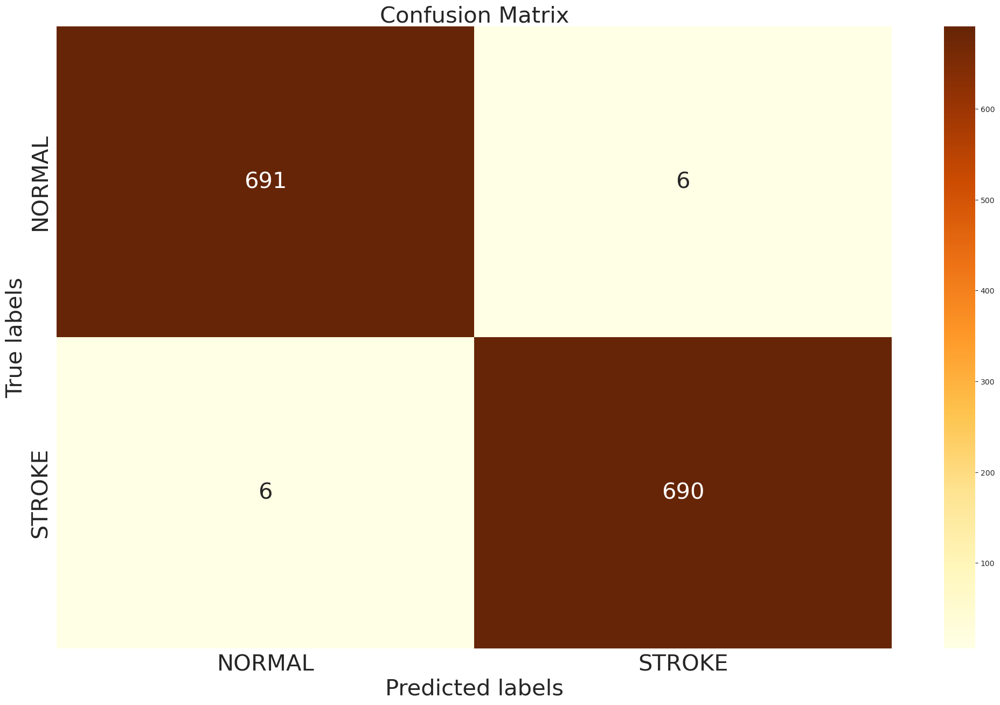

In [61]:
#Confusion matrix:
conf_mat =confusion_matrix(y_true=y_test,y_pred = y_pred)
class_list = ['NORMAL', 'STROKE']
fig, ax = plt.subplots(figsize=(25,15))
sns.heatmap(conf_mat, annot=True, ax= ax, cmap='YlOrBr', fmt='g',
annot_kws={"size": 30})
ax.set_xlabel('Predicted labels',fontsize=30)
ax.set_ylabel('True labels',fontsize=30)
ax.set_title('Confusion Matrix',fontsize=30)
ax.xaxis.set_ticklabels(class_list),
ax.yaxis.set_ticklabels(class_list)
ax.tick_params(labelsize=30)

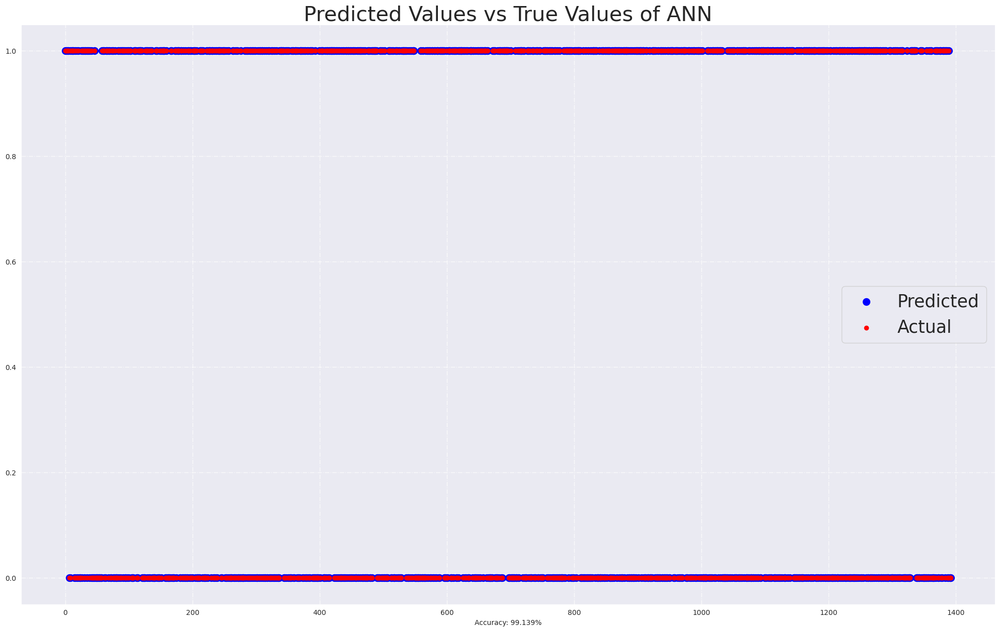

In [62]:
def plot_real_pred_val(Y_test, ypred, name):
    plt.figure(figsize=(25, 15))
    acc = accuracy_score(Y_test, ypred)
    plt.scatter(range(len(ypred)), ypred, color="blue", lw=5, label="Predicted")
    plt.scatter(range(len(Y_test)), Y_test, color="red", label="Actual")
    plt.title("Predicted Values vs True Values of " + name, fontsize=30)
    plt.xlabel("Accuracy: " + str(round((acc * 100), 3)) + "%")
    plt.legend(fontsize=25)
    plt.grid(True, alpha=0.75, lw=1, ls='-.')
    plt.show()

plot_real_pred_val(y_test, y_pred, 'ANN')
